# IV_tiff_segmenter
author: Camillo Moschner (cm967)

start: 11.05.2021

## Import Statements

In [1]:
import numpy as np
import pandas as pd
from copy import deepcopy

In [4]:
import matplotlib
import matplotlib.pyplot as plt, imshow
import matplotlib.gridspec as gridspec
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib import cm
import seaborn as sns
import time
import warnings
from itertools import chain, combinations

In [5]:
import zarr
from numcodecs import Blosc
from PIL import Image
from tifffile import imread, memmap
import napari

In [12]:
from tqdm.notebook import tqdm
import PIL.Image
import IPython.display
import ipywidgets as widgets
from ipywidgets import interact, interact_manual
%matplotlib inline

from skimage.transform import rescale, resize, downscale_local_mean
from skimage import measure
from skimage.filters import (threshold_otsu, threshold_niblack, threshold_sauvola)
from skimage.measure import label, regionprops, regionprops_table
from sklearn.cluster import DBSCAN

from scipy.ndimage.morphology import grey_opening, grey_closing, grey_dilation, grey_erosion, binary_erosion, binary_opening, binary_closing, binary_dilation
from joblib import Parallel, delayed

/var/folders/p_/d1kqy0fj5497sqkd5nkn_rf40000gn/T/ipykernel_81372/3181634851.py:19: DeprecationWarning: Please use `grey_opening` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  from scipy.ndimage.morphology import grey_opening, grey_closing, grey_dilation, grey_erosion, binary_erosion, binary_opening, binary_closing, binary_dilation
/var/folders/p_/d1kqy0fj5497sqkd5nkn_rf40000gn/T/ipykernel_81372/3181634851.py:19: DeprecationWarning: Please use `grey_closing` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  from scipy.ndimage.morphology import grey_opening, grey_closing, grey_dilation, grey_erosion, binary_erosion, binary_opening, binary_closing, binary_dilation
/var/folders/p_/d1kqy0fj5497sqkd5nkn_rf40000gn/T/ipykernel_81372/3181634851.py:19: DeprecationWarning: Please use `grey_dilation` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  from scipy.ndi

In [13]:
from image_analysis_helper import *

## CM's custom cmaps

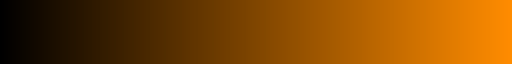

In [17]:
# special colourmaps
YFP_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["black","yellow"])
CFP_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["black","cyan"])
RFP_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["black","red"])
GFP_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["black","lime"])
BFP_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["black","dodgerblue"])

## Function Definitions

In [14]:
from numpy import mean, absolute

def mad(data, axis=None):
    return np.nanmean(absolute(data - np.nanmean(data, axis)), axis)

In [15]:
def create_empty_maskarray(empty_segm_im_nparray,max_cell_length,max_cell_width,pixel_micron_conversion):
    """
    Create a substitute mask for empty trenches that allows you to still create regionprobs data for empty trenches:
    Scenario 1: trench starts with no cells
    Scenario 2: trench loses cells - due to cell loss
    Scenario 3: trench loses cells - due to cell death!
    Out: binary np_array of region to keep analysing even though there's nothing there anymore
    """
    binary_mask = np.zeros(empty_segm_im_nparray.shape)

    mask_rows_upper_quarter = binary_mask.shape[0]/4
    mask_column_centre = binary_mask.shape[1]/2

    half_maxcell_l = max_cell_length/pixel_micron_conversion/2
    half_maxcell_w = max_cell_width/pixel_micron_conversion/2
    margin_perc = 0.05
    binary_mask[int(binary_mask.shape[0]*margin_perc):int(binary_mask.shape[0]-binary_mask.shape[0]*margin_perc),
                int(binary_mask.shape[1]*margin_perc):int(binary_mask.shape[1]-binary_mask.shape[1]*margin_perc)] = 1
    #binary_mask[int(mask_rows_upper_quarter-half_maxcell_l):int(mask_rows_upper_quarter+half_maxcell_l),
              #  int(mask_column_centre-half_maxcell_w):int(mask_column_centre+half_maxcell_w)] = 1
    
    labelled_binary_mask = label(binary_mask)
    #imshow(labelled_binary_mask);
    return labelled_binary_mask

def find_highest_intensity_mean(np_ims_array,percentile_number):
    """
    Calculate the mean pixel intensity of the highest nth percentile of pixels.
    In1: numpy array (image)
    In2: int or float
    Out: float
    """
    threshold_value = np.percentile(np_ims_array,percentile_number)
    percentage_values = np_ims_array[np_ims_array>threshold_value]
    return percentage_values.mean()

def create_highest_intensity_mask(np_ims_array, percentile_number):
    """
    Create a binary mask of the highest nth percentile of pixels.
    In1: numpy array
    In2: int or float
    Out: numpy array (binary image)
    """
    threshold_value = np.percentile(np_ims_array,percentile_number)
    percentage_indices = np.argwhere(np_ims_array>threshold_value)
    binary_mask = np.zeros(np_ims_array.shape)
    for value in percentage_indices:
        binary_mask[value[0],value[1]] = 1
    return binary_mask

In [18]:
warnings.filterwarnings('ignore')

-----
# Define Data Information
## Digital Information

Load measurement-master zarr file:

In [19]:
filled_trench_master_zarr = zarr.open(f'3_trench_master_tiff/trenches_filled.zarr', mode='r')
filled_trench_master_zarr

<zarr.core.Array (1334, 3, 100, 650, 73) int32 read-only>

Load experiment's metadata as DataFrame:

In [20]:
metadata_df = pd.read_csv("3_trench_master_tiff/filled_trench_master_metadata.csv")#pickle.load( open( metadata_df_dir, "rb" ) )

Save-to-folder:

In [21]:
save_to_folder= "3_trench_master_tiff/"
if save_to_folder[-1] != os.path.sep:
    save_to_folder += os.path.sep

Define colour channel names:

In [22]:
PC_id = 'PC'
segm_marker_id = 'mCherry'
reporter_id = 'Green'

channel_ids = {'phase_contrast_id':PC_id, 
               'segmentation_marker_id':segm_marker_id, 
               'reporter_id':reporter_id}

In [23]:
metadata_df

,directory,FOV,trench,colour_channel,timepoint,trench_cum,trench_id,trench_no_per_FOV,sample_id,loading_value_tzero,trench_filled_cum
0,2_sliced_trenches/xy000_tr0_Green_T0000.png,xy000,0,Green,0,0,xy000_tr00,15,NC,1,0
1,2_sliced_trenches/xy000_tr0_Green_T0001.png,xy000,0,Green,1,0,xy000_tr00,15,NC,1,0
2,2_sliced_trenches/xy000_tr0_Green_T0002.png,xy000,0,Green,2,0,xy000_tr00,15,NC,1,0
3,2_sliced_trenches/xy000_tr0_Green_T0003.png,xy000,0,Green,3,0,xy000_tr00,15,NC,1,0
4,2_sliced_trenches/xy000_tr0_Green_T0004.png,xy000,0,Green,4,0,xy000_tr00,15,NC,1,0
...,...,...,...,...,...,...,...,...,...,...,...
400195,2_sliced_trenches/xy127_tr4_mCherry_T0095.png,xy127,4,mCherry,95,1789,xy127_tr04,5,pUC,1,1333
400196,2_sliced_trenches/xy127_tr4_mCherry_T0096.png,xy127,4,mCherry,96,1789,xy127_tr04,5,pUC,1,1333
400197,2_sliced_trenches/xy127_tr4_mCherry_T0097.png,xy127,4,mCherry,97,1789,xy127_tr04,5,pUC,1,1333
400198,2_sliced_trenches/xy127_tr4_mCherry_T0098.png,xy127,4,mCherry,98,1789,xy127_tr04,5,pUC,1,1333


- - - - - - 

# Identify Pipeline Steps

In [24]:
filled_trench_master_zarr

<zarr.core.Array (1334, 3, 100, 650, 73) int32 read-only>

## Segmentation
- Thresholding (global [Otsu] vs local [Niblack])
- Morphological operations
  - erosion
  - dilation
  - opening
  - closing
- Labelling
- Labelled Object characterisation

### Segmentation functions

In [25]:
def segment_segm_im(current_segm_im,window_s, k_n, squ_y,squ_x):
    """
    Out: np.array (binary segmentation mask)
    """
    scale_factor = 1
    all_cells_niblack = threshold_niblack(current_segm_im, window_size = window_s, k=k_n) # niblack thresholding!

    niblack_binary = current_segm_im > all_cells_niblack
    #niblack_binary = rescale(niblack_binary, scale=scale_factor, anti_aliasing=False)

    square = np.ones((squ_y,squ_x))
    opened_mask = binary_opening(niblack_binary,square)
    opened_mask = rescale(opened_mask, scale=1/scale_factor, anti_aliasing=False).astype(int)
    return opened_mask

In [26]:
def create_trench_mask_master_tiff(nparray_master_tiff,trench_id, memmaped_image):
    """
    Segments FP-based segmentation marker image and memory maps it to the mask_master.tif file.
    Out: none
    """
    # 2- loop through every timepoint/trench to access its segm image:
    for timepoint in list(range(len(nparray_master_tiff[trench_id,1,:, :,:]))):
        # 3- create binary segmentation mask:
        current_segm_im = segment_segm_im(nparray_master_tiff[trench_id,1,timepoint, :,:], 
                                          window_size_global, k_n_global, 
                                          squ_y_global, squ_x_global)
        # map binary segmentation mask to current dimension in the memory-mapped image:
        memmaped_image[trench_id,timepoint, 0:int(current_segm_im.shape[0]),0:int(current_segm_im.shape[1])] = current_segm_im

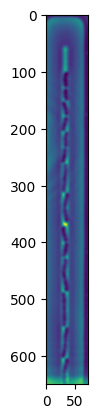

In [27]:
#imshow(convert_to_mother_cell_mask_only(mask_memmap_image[11,85,:,:],min_pixel_area_per_cell))
imshow(filled_trench_master_zarr[1100,0,85,:,:])

In [28]:
from skimage.morphology import white_tophat, black_tophat, disk

def subtract_background(image, radius=50, light_bg=False):
    """
    Source: https://forum.image.sc/t/background-subtraction-in-scikit-image/39118/3
    In: np.array
    Out: np.array
    """
    str_el = disk(radius) #you can also use 'ball' here to get a slightly smoother result at the cost of increased computing time
    if light_bg:
        return black_tophat(image, str_el)
    else:
        return white_tophat(image, str_el)

Interactively choose optimal segmentation parameters:

In [29]:
@interact
def show_trench(trench = (0,len(filled_trench_master_zarr)-1),
                timepoint = (0, len(filled_trench_master_zarr[0,1,:,:,:])-1),
                y_bottom = (0,filled_trench_master_zarr.shape[-2]),
                window_size = (1,21,2),
                k_n = (-1,1,0.01),
                squ_y = (1,10,1),
                squ_x = (1,10,1)):
    #original_index = useable_trenches_indexes[trench]
    #PC_im = master_tiff[trench,0,  timepoint,:y_bottom,:]
    segm_im = filled_trench_master_zarr[trench,1,timepoint,:,:]
    rep_im = filled_trench_master_zarr[trench,2, timepoint,:,:]
    
    plt.style.use('default')
    fig = plt.figure(figsize=(10,6),constrained_layout=True)
    gs = gridspec.GridSpec(1, 4, figure=fig)
    plt.suptitle(f"trench: {trench} | timepoint: {timepoint}",size=14)
    
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.imshow(segm_im,cmap=RFP_cmap);
    ax1.set_xlabel(f"{segm_im.min()}-{segm_im.max()}")
    ax1.set_title('Segm. Marker (mCherry)')
    
    current_segm_im = segment_segm_im(segm_im,window_size,k_n, squ_y, squ_x)
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.imshow(current_segm_im);
    ax2.set_xlabel(f"win:{window_size},k:{k_n}")
    ax2.set_title('Segm. Mask')
    
    ax3 = fig.add_subplot(gs[0, 2])
    ax3.imshow(label(current_segm_im)[:y_bottom,:]);
    ax3.set_xlabel(f"#:{ label(current_segm_im,return_num=True)[1] }")
    ax3.set_title(f"Labelled Mask")
    
    ax4 = fig.add_subplot(gs[0, 3])
    ax4.imshow(rep_im,GFP_cmap)
    ax4.set_xlabel(f"{rep_im.min()}-{rep_im.max()}")
    ax4.set_title(f"Reporter (GFP)")

    plt.show()
    plt.close()
    
    global y_bottom_global
    y_bottom_global = y_bottom
    global window_size_global
    window_size_global = 17#window_size
    global k_n_global
    k_n_global = -0.02#k_n
    global squ_y_global
    squ_y_global = 7#squ_y
    global squ_x_global
    squ_x_global = 7#squ_x  

interactive(children=(IntSlider(value=666, description='trench', max=1333), IntSlider(value=49, description='t…

-_-_-_-_-_-_-_-_-_-_-
### Mask_Master_Zarr
Create a Zarr file of binary cell masks with the same dimensions as the master_tiff containing all trenches/channels/timepoints:

1) Define Zarr dimensions:

In [30]:
len(filled_trench_master_zarr)

1334

Run parallelised segmentation that immediately adds every mask created to the memory-mapped mask_master.tif file:

In [31]:
data_df = metadata_df
test_im = convert_to_nparray(data_df.directory.iloc[0]).shape
trench_y_size = test_im[0]
trench_x_size = test_im[1]
n_trenches = len(data_df.trench_filled_cum.unique())
n_timepoints = len(data_df.timepoint.unique())
#n_channels = len(data_df.colour_channel.unique())
# choose compressor and establish empty zarr
compressor = Blosc(cname='zstd', clevel=1, shuffle=Blosc.BITSHUFFLE)
# trench_mask_master_zarr = zarr.open(f'3_trench_master_tiff/trench_mask_master.zarr', mode='w', shape=(n_trenches, n_timepoints, trench_y_size, trench_x_size),
#                 chunks=(1,1,trench_y_size, trench_x_size), dtype='int32', compressor = compressor)

In [32]:
#_ = Parallel(n_jobs = -1, require='sharedmem')(delayed(create_trench_mask_master_tiff)(filled_trench_master_zarr,trench_id,trench_mask_master_zarr) for trench_id in tqdm(range(len(filled_trench_master_zarr))))

In [33]:
trench_mask_master_zarr = zarr.open(f'3_trench_master_tiff/trench_mask_master.zarr', mode='r+')

In [34]:
trench_mask_master_zarr

<zarr.core.Array (1334, 100, 650, 73) int32>

In [35]:
@interact
def show(x=(0,len(trench_mask_master_zarr)-1),
           time=(0,99)):
         imshow( trench_mask_master_zarr[x,time, :,:] )

interactive(children=(IntSlider(value=666, description='x', max=1333), IntSlider(value=49, description='time',…

In [36]:
@interact
def show(x=(0,len(trench_mask_master_zarr)-1),
           time=(0,99)):
         imshow( gh_mask_zarr[x,time, :,:] )

interactive(children=(IntSlider(value=666, description='x', max=1333), IntSlider(value=49, description='time',…

### Manual mask correction

In [37]:
trench_mask_master_zarr, filled_trench_master_zarr

(<zarr.core.Array (1334, 100, 650, 73) int32>,
 <zarr.core.Array (1334, 3, 100, 650, 73) int32 read-only>)

In [38]:
gh_mask_dir = '/Users/camillomoschner/Desktop/221018_LVL2DVs_STMM/3_trench_master_tiff/masks.zarr'
gh_mask_zarr = zarr.open(gh_mask_dir,mode='r+')
gh_mask_zarr

<zarr.core.Array (1334, 100, 650, 73) uint8>

In [39]:
@interact
def show(x=(0,len(filled_trench_master_zarr)-1),
         time=(0,99),
         channel=(0,2)):
    imshow(filled_trench_master_zarr[x,channel,time])

interactive(children=(IntSlider(value=666, description='x', max=1333), IntSlider(value=49, description='time',…

## Mask Comparison

In [40]:
@interact
def show_trench(trench = (0,len(filled_trench_master_zarr)-1),
                timepoint = (0, len(filled_trench_master_zarr[0,1,:,:,:])-1),
                vmin=(0,20_000),
                vmax=(30_000,66_000)
                ):
    #original_index = useable_trenches_indexes[trench]
    PC_im = filled_trench_master_zarr[trench,0,  timepoint,:,:]
    segm_im = filled_trench_master_zarr[trench,1,timepoint,:,:]
    rep_im = filled_trench_master_zarr[trench,2, timepoint,:,:]
    cm_mask = trench_mask_master_zarr[trench, timepoint,:,:]
    gh_mask = gh_mask_zarr[trench, timepoint,:,:]
    sample_name = {metadata_df.loc[metadata_df.trench_filled_cum==trench].sample_id.iloc[0]}
    plt.style.use('default')
    fig = plt.figure(figsize=(10,6),constrained_layout=True)
    gs = gridspec.GridSpec(1, 5, figure=fig)
    plt.suptitle(f"trench: {trench} | {sample_name} | timepoint: {timepoint}\n",size=14)
    
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.imshow(PC_im,vmin=vmin, vmax=vmax)#,cmap='gray');
    ax1.set_xlabel(f"{PC_im.min()}-{PC_im.max()}")
    ax1.set_title('PC')
    
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.imshow(segm_im,cmap=RFP_cmap);
    ax2.set_xlabel(f"{segm_im.min()}-{segm_im.max()}")
    ax2.set_title('Segm. Marker\n(mCherry)')
    
    ax3 = fig.add_subplot(gs[0, 2])
    ax3.imshow(label(cm_mask));
    #ax2.imshow(label(cm_mask),alpha=0.5);
    ax3.set_xlabel(f"#: { label(gh_mask,return_num=True)[1] }")
    ax3.set_title('Standard segm\nMask')
    
    ax4 = fig.add_subplot(gs[0, 3])
    ax4.imshow(gh_mask); #[:y_bottom,:]
    ax4.set_xlabel(f"#: { label(gh_mask,return_num=True)[1] }")
    ax4.set_title(f"SyMBac\nMask")
    
    ax5 = fig.add_subplot(gs[0, 4])
    ax5.imshow(rep_im,GFP_cmap)
    ax5.set_xlabel(f"{rep_im.min()}-{rep_im.max()}")
    ax5.set_title(f"Reporter\n(GFP)")
    #plt.savefig(f"{trench}_{time}_sigma{sample_name}.pdf",dpi=150)
    plt.show()
    plt.close() 

interactive(children=(IntSlider(value=666, description='trench', max=1333), IntSlider(value=49, description='t…

#### Correction loop

In [41]:
min_pixel_area_per_cell

58.691231976834466

## Property Measurements

### Omnipose FP segmentation

#### Load model

#### Create segmentation+reporter ims

#### Predict segmentation+reporter masks - WORSE

### Timepoint-parallelised  Measurements

In [42]:
def measure_timepoint_props(im_array, trench_l, timepoint_l, mask_l, sample_name):
    """
    """
    segm_im = im_array[trench_l,1,timepoint_l,:,:]
    rep_im = im_array[trench_l,2, timepoint_l,:,:]
    raw_mask = mask_l[trench_l, timepoint_l,:,:]
    labeled_mask = label(raw_mask)
    #gh_mask = gh_mask_zarr[trench, timepoint_l,:,:]
    # calculate segmented areas features: - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
    important_properties = ["label","area", "centroid","mean_intensity","major_axis_length","minor_axis_length","solidity"]
    # use segmentation mask to measure intensities in reporter image:
    regionprops_objects = regionprops_table(label_image=labeled_mask,
                                            intensity_image=rep_im,
                                            properties=important_properties)
    important_segm_properties = ["mean_intensity"]
    regionprops_segm_objects = regionprops_table(label_image=labeled_mask, 
                                                 intensity_image=segm_im,  
                                                 properties=important_segm_properties)
    # define regionprops DataFrame:
    regionprops_objects = pd.DataFrame(regionprops_objects)
    regionprops_segm_objects = pd.DataFrame(regionprops_segm_objects)
    # merge reporter and segmentation data into one DataFrame
    regionprops_objects['segm_mean_intensity'] = regionprops_segm_objects['mean_intensity']
    regionprops_objects.rename(columns={'mean_intensity':'reporter_mean_intensity'},inplace=True)
    regionprops_objects["trench"] = trench_l
    regionprops_objects["timepoint"] = timepoint_l
    regionprops_objects["sample_id"] = [sample_name for x in range(len(regionprops_objects))]
    return regionprops_objects

In [43]:
len(filled_trench_master_zarr)

1334

In [44]:
try:
    full_segm_info_df = pd.read_csv('full_segmented_data_info.csv')
except:
    measure_timepoint_props(filled_trench_master_zarr, 0, 0, cm_mask)
    full_segm_info_df = []
    # loop through every trench
    for trench in tqdm(range(0,len(filled_trench_master_zarr))):
        sample_name = metadata_df.loc[metadata_df.trench_filled_cum==trench].sample_id.iloc[0]
        #trench_info_list = []
        # loop through every timepoint
        
        
        trench_info_list = Parallel(n_jobs = -1, require='sharedmem')(delayed(measure_timepoint_props)(filled_trench_master_zarr,trench,timepoint, 
                                                                                                       gh_mask_zarr, sample_name)  # trench_mask_master_zarr
                                                       for timepoint in metadata_df.timepoint.unique())
        full_segm_info_df.append(pd.concat(trench_info_list))
    # merge all trench data into one DataFrame:
    full_segm_info_df = pd.concat(full_segm_info_df)

In [45]:
#plt.plot(full_segm_info_df.loc[(full_segm_info_df.trench==0) & (full_segm_info_df.label==2)].timepoint, 
#full_segm_info_df.loc[(full_segm_info_df.trench==0) & (full_segm_info_df.label==2)].major_axis_length)
full_segm_info_df.loc[(full_segm_info_df.trench==0) & (full_segm_info_df.label==2)].timepoint.max()#*5#.area.value_counts()

99

In [46]:
full_segm_info_df.loc[(full_segm_info_df.trench==0) & (full_segm_info_df.label==2)]

,Unnamed: 0,label,area,centroid-0,centroid-1,reporter_mean_intensity,major_axis_length,minor_axis_length,solidity,segm_mean_intensity,trench,timepoint,sample_id
1,1,2,464,75.648707,37.577586,127.409483,43.324657,13.798045,0.968685,865.366379,0,0,NC
13,1,2,505,82.908911,37.499010,129.312871,48.254054,13.549162,0.958254,891.122772,0,1,NC
26,1,2,595,84.477311,37.734454,128.502521,53.932085,14.326168,0.947452,755.611765,0,2,NC
39,1,2,675,90.708148,37.697778,127.921481,62.659925,14.149675,0.940111,695.522963,0,3,NC
52,1,2,352,75.235795,37.715909,127.028409,34.292704,13.244638,0.956522,624.519886,0,4,NC
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1784,1,2,500,68.946000,37.916000,129.132000,51.797015,12.679971,0.961538,768.816000,0,95,NC
1805,1,2,284,59.154930,37.961268,129.218310,31.383119,11.748009,0.962712,757.352113,0,96,NC
1834,1,2,340,61.144118,37.761765,129.458824,35.679606,12.351067,0.931507,756.782353,0,97,NC
1855,1,2,410,63.151220,37.707317,128.602439,42.574807,12.542632,0.962441,750.207317,0,98,NC


#### Relabel all images

In [47]:
trench_idx = 1046
for t in range(100):
    gh_mask_zarr[trench_idx,t] = label(gh_mask_zarr[trench_idx,t])

In [48]:
full_segm_info_df = pd.read_csv('full_segm_info_df.csv')

In [49]:
special_data_df = full_segm_info_df.loc[
    (full_segm_info_df.label == 1) &
    (full_segm_info_df.trench == 1070)
]
special_data_df.loc[special_data_df.reporter_mean_intensity < 5_000]

,label,area,centroid-0,centroid-1,reporter_mean_intensity,major_axis_length,minor_axis_length,solidity,segm_mean_intensity,trench,timepoint,sample_id


In [50]:
from scipy.signal import find_peaks

In [51]:
trench_data = full_segm_info_df.loc[(full_segm_info_df.trench==217) & (full_segm_info_df.label==1)]
# 
# l_peaks_intensities = trench_data.loc[(trench_data.timepoint in  length_peaks[0].tolist())].major_axis_length
trench_data
length_peaks = find_peaks(np.array(trench_data.major_axis_length), distance=20)
length_peaks
#trench_data.loc[trench_data.timepoint.isin(np.array([ 2, 36, 67, 90]))].major_axis_length

(array([ 2, 42, 71]), {})

In [52]:
length_peaks[0]

array([ 2, 42, 71])

In [53]:
trench_data.loc[trench_data.timepoint.isin(length_peaks[0])].major_axis_length

277566    72.917324
278106    57.076840
Name: major_axis_length, dtype: float64

In [54]:
71 in trench_data.timepoint
trench_data.timepoint.apply(lambda x: x in list(length_peaks[0])).value_counts()

False    86
True      2
Name: timepoint, dtype: int64

In [55]:
trench_data.loc[trench_data.timepoint==42]

,label,area,centroid-0,centroid-1,reporter_mean_intensity,major_axis_length,minor_axis_length,solidity,segm_mean_intensity,trench,timepoint,sample_id


In [58]:
@interact
def show_trench(
    # trench = (0,len(filled_trench_master_zarr)-1),
    #             timepoint = (0, len(filled_trench_master_zarr[0,1,:,:,:])-1),
    #             label_no=(1,4),
    #             vmin=(0,10_000),
    #             vmax=(1_000,66_000),
    #             l_peak_d = (1,100),
    #             l_prominance = (1,100)
    #             ):
    trench = (1308),
                timepoint = (33),
                label_no=(1),
                vmin=(4790),
                vmax=(46855),
                l_peak_d = (3),
                l_prominance = (3)
                ):
    plt.close() 
    #original_index = useable_trenches_indexes[trench]
    timepoint_interval=5
    PC_im = filled_trench_master_zarr[trench,0,  timepoint,:,:]
    segm_im = filled_trench_master_zarr[trench,1,timepoint,:,:]
    rep_im = filled_trench_master_zarr[trench,2, timepoint,:,:]
    cm_mask = trench_mask_master_zarr[trench, timepoint,:,:]
    gh_mask = gh_mask_zarr[trench, timepoint,:,:]
    #
    curr_ten_xticks = np.arange(0,PC_im.shape[1],(1/pixel_micron_conversion)*2.5)
    new_ten_xlabels = [int(round(x*pixel_micron_conversion,0)) for x in curr_ten_xticks]
    curr_ten_yticks = np.arange(0,PC_im.shape[0],(1/pixel_micron_conversion)*10)
    new_ten_ylabels = [int(round(x*pixel_micron_conversion,0)) for x in curr_ten_yticks]
    #
    trench_data = full_segm_info_df.loc[(full_segm_info_df.trench==trench) & (full_segm_info_df.label==label_no)]
    length_peaks = find_peaks(np.array(trench_data.major_axis_length), 
                              distance=l_peak_d, 
                              prominence=l_prominance)
    l_peaks_intensities = trench_data.loc[trench_data.timepoint.isin(length_peaks[0])].major_axis_length
    
    sample_name = metadata_df.loc[metadata_df.trench_filled_cum==trench].sample_id.iloc[0]
    plt.style.use('default')
    fig = plt.figure(figsize=(12,6),constrained_layout=True)
    gs = gridspec.GridSpec(2, 8, figure=fig)
    plt.suptitle(f"trench: {trench} | {sample_name} | timepoint: {timepoint} / {timepoint*timepoint_interval} min\n",size=14)
    
    ax1 = fig.add_subplot(gs[0:2, 0])
    ax1.imshow(PC_im,cmap='gray',vmin=vmin, vmax=vmax)#,
    ax1.set_xlabel(f"{PC_im.min()}-{PC_im.max()}")
    ax1.set_title('PC')
    
    ax2 = fig.add_subplot(gs[0:2, 1])
    ax2.imshow(segm_im,cmap=RFP_cmap);#,vmin=vmin, vmax=vmax);
    ax2.set_xlabel(f"{segm_im.min()}-{segm_im.max()}")
    ax2.set_title('Segm. Marker\n(mCherry)')
    
    ax3 = fig.add_subplot(gs[0:2, 2])
    ax3.imshow(label(gh_mask));
    ax3.set_xlabel(f"#: { label(gh_mask,return_num=True)[1] }")
    ax3.set_title('Omnipose segm\nMask')
    
    ax8 = fig.add_subplot(gs[0:2, 3])
    ax8.imshow(rep_im,cmap=GFP_cmap);#,vmin=vmin, vmax=vmax);
    ax8.set_xlabel(f"{rep_im.min()}-{rep_im.max()}")
    ax8.set_title('Reporter\n(sfGFP)')

    ax6 = fig.add_subplot(gs[0, 4:8])
    ax6.plot(trench_data.timepoint*timepoint_interval,trench_data.major_axis_length*pixel_micron_conversion)#, s=5, alpha=0.7,color='grey')
    ax6.scatter(trench_data.timepoint*timepoint_interval,np.array(trench_data.major_axis_length*pixel_micron_conversion), s=7, alpha=0.7,color='grey')
    ax6.plot(np.array(length_peaks[0]*5), np.array(l_peaks_intensities)*pixel_micron_conversion, "x")
    ax6.scatter(timepoint*5, trench_data.loc[trench_data.timepoint==timepoint].major_axis_length*pixel_micron_conversion, s=50, alpha=0.5, color='purple' )
    ax6.set_ylabel(f"cell length (µm)")
    plt.grid(True,alpha=0.2)
    #ax6.set_xlabel(f"time")
    ax7 = fig.add_subplot(gs[1, 4:8])
    ax7.plot(trench_data.timepoint*timepoint_interval,trench_data.reporter_mean_intensity,color='green',label='sfGFP (reporter)')
    ax7.plot(trench_data.timepoint*timepoint_interval,trench_data.segm_mean_intensity,color='firebrick',label='mCherry (segm)')
    ax7.scatter(timepoint*5, trench_data.loc[trench_data.timepoint==timepoint].reporter_mean_intensity, s=50, alpha=0.5, color='purple' )
    ax7.scatter(timepoint*5, trench_data.loc[trench_data.timepoint==timepoint].segm_mean_intensity, s=50, alpha=0.5, color='purple' )
    ax7.set_ylabel(f"FI (a.u.)")
    ax7.set_xlabel(f"time (min)")
    plt.grid(True,alpha=0.2)
    #ax6.set_xticks(np.arange(trench_data.timepoint.min()*timepoint_interval, trench_data.timepoint.max()*timepoint_interval+1, 60.0))
    [x.set_xticks(curr_ten_xticks, new_ten_xlabels) for x in [ax1,ax2,ax3,ax8]]
    [x.set_yticks(curr_ten_yticks, new_ten_ylabels)for x in [ax1,ax2,ax3,ax8]]

    ax6.set_title(f"Cell Growth")
    ax7.set_title(f"Fluorescence")
    ax6.spines['top'].set_visible(False)
    ax6.spines['right'].set_visible(False)
    ax7.spines['top'].set_visible(False)
    ax7.spines['right'].set_visible(False)
    ax7.legend(prop={'size': 9})
    ax1.set_ylabel("µm",fontsize=13, fontweight='bold')
    [x.set_xlim(-5,501) for x in [ax6, ax7]]
    plt.savefig(f"{trench}_{time}_sigma{sample_name}.png",dpi=150)
    plt.show()
    plt.close() 

interactive(children=(IntSlider(value=1308, description='trench', max=3924, min=-1308), IntSlider(value=33, de…

In [59]:
time_interval_for_obs = np.arange(53,100)
158 / 447
434 / 450

0.9644444444444444

#### Starfish fig

In [60]:
PC_ims = filled_trench_master_zarr[410,0,  62:85,5:350,:65]
mCherry_ims = filled_trench_master_zarr[410,1,  62:85,5:350,:65]
mask_ims = gh_mask_zarr[410, 62:85,5:350, :65]

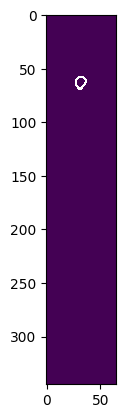

In [61]:
def create_segm_outline(input_mask_im, dilation_iterations=1):
    label1_original = np.array(input_mask_im==1).astype(int)
    segm_outline = binary_dilation( label1_original, iterations=dilation_iterations)- label1_original
    outline_im = np.ma.masked_where(segm_outline == 1, segm_outline)
    return outline_im

plt.imshow(create_segm_outline(mask_ims[20], dilation_iterations=1))

In [62]:
concatenated_PC_im = np.concatenate([x for x in PC_ims],axis=1)
concatenated_mCherry_im = np.concatenate([x for x in mCherry_ims],axis=1)
concatenated_masks_im = np.concatenate([create_segm_outline(x, dilation_iterations=1) for x in mask_ims],axis=1)
curr_ten_xticks = np.arange(PC_ims.shape[2]/2,concatenated_PC_im.shape[1],PC_ims.shape[2])
new_ten_xlabels = np.arange(23)*5

curr_ten_yticks = np.arange(0,concatenated_PC_im.shape[0],(1/pixel_micron_conversion)*10)
new_ten_ylabels = [int(round(x*pixel_micron_conversion,0)) for x in curr_ten_yticks]

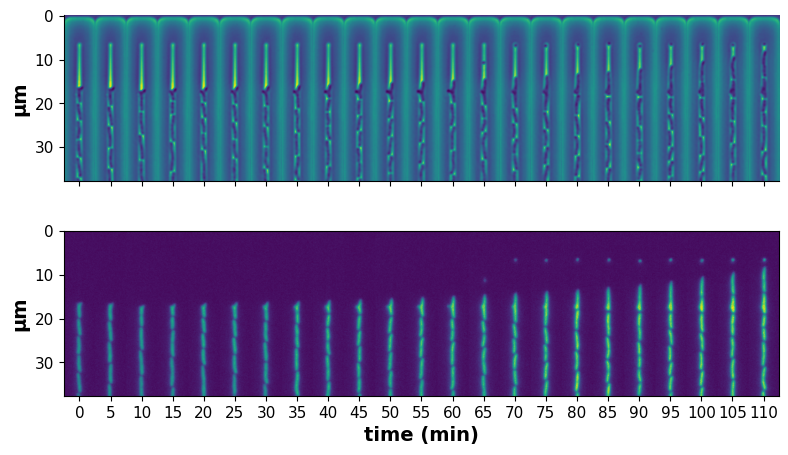

In [63]:
fig = plt.figure(figsize=(8,5),tight_layout=True)
gs = gridspec.GridSpec(2, 1, figure=fig)
ax1= fig.add_subplot(gs[0,0])
ax1.imshow(concatenated_PC_im)
ax1.set_xticks(curr_ten_xticks, new_ten_xlabels);
ax1.set_yticks(curr_ten_yticks, new_ten_ylabels);
plt.xticks(fontsize=11);
plt.yticks(fontsize=11);
# plt.tick_params(bottom = False)
ax1.set(xticklabels=[])
ax2= fig.add_subplot(gs[1,0])
ax2.imshow(concatenated_mCherry_im)
ax2.set_xticks(curr_ten_xticks, new_ten_xlabels);
ax2.set_yticks(curr_ten_yticks, new_ten_ylabels);
plt.xticks(fontsize=11);
plt.yticks(fontsize=11);

ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_ylabel("µm",fontsize=14, fontweight='bold')
ax2.set_ylabel("µm",fontsize=14, fontweight='bold')
ax2.set_xlabel("time (min)",fontsize=14, fontweight='bold')
# ax1.imshow(concatenated_masks_im,alpha=0.5,cmap = 'hot')

# plt.savefig(f"starfish.png", dpi=300)
plt.show()

In [64]:
np.percentile(full_segm_info_df.major_axis_length, [0.01,0.99])

array([ 4.61880215, 10.65770287])

In [65]:
full_segm_info_df.major_axis_length.min()*pixel_micron_conversion, full_segm_info_df.major_axis_length.max()

(0.0, 734.1221976708136)

In [66]:
0, 80/5, 320/5, 99, 220/5, 365/5
pixel_micron_conversion*(470-90)

41.4998

In [67]:
"""Save your analysed data repeadetly!
"""
full_segm_info_df.trench.unique()#.to_csv('full_omnipose_segmented_data_info.csv')

array([   0,    1,    2, ..., 1331, 1332, 1333])

In [68]:
full_segm_info_df.timepoint.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])

In [69]:
# weirdo 0 - tr=410, tp=73+/365+
# weirdo 1 - xy033 - tr_5 _ tp91
# side trench invasion example - tr=1219

---
# Figures & tests

### EPRF

In [70]:
@interact
def show(idx=(0,3)):
    EPRF_data_all_df = full_segm_info_df.loc[(full_segm_info_df.label == 1) & (full_segm_info_df.sample_id == sample_names[idx])]
    q3, q1 = np.percentile(np.arange(len(EPRF_data_all_df.timepoint.unique()+1)), [75 ,25])
    iqr = q3 - q1
    mean_population_t_zero = EPRF_data_all_df.loc[EPRF_data_all_df.timepoint == 0].reporter_mean_intensity.mean()
    grand_mean_t_IQR = EPRF_data_all_df.loc[(EPRF_data_all_df.timepoint >= q1) & (EPRF_data_all_df.timepoint <= q3)].reporter_mean_intensity.mean()
    print(sample_names[idx])
    print(f"mean_population_t_zero/ grand_mean_t_IQR =\n    {mean_population_t_zero, grand_mean_t_IQR}")
    print(f"EPRF = {mean_population_t_zero / grand_mean_t_IQR}")
    display(EPRF_data_all_df)

interactive(children=(IntSlider(value=1, description='idx', max=3), Output()), _dom_classes=('widget-interact'…

## 1: Cell growth graph

In [71]:
complete_peaks_x_list = []
cell_doubling_times_list = []
complete_peaks_y_list = []

complete_valleys_x_list = []
complete_valleys_y_list = []
for tr in tqdm(range(0,len(filled_trench_master_zarr))):
    # Select trench/cell and label
    trench_data = full_segm_info_df.loc[(full_segm_info_df.trench == tr) & 
                                        (full_segm_info_df.label == 1)]
    # Calculate peaks' timepoints & their magnitute
    length_peaks = find_peaks(np.array(trench_data.major_axis_length), 
                              distance = 3, prominence = 3)[0]
    l_peaks_intensities = trench_data.loc[trench_data.timepoint.isin(length_peaks)].major_axis_length
     # Calculate valleys' timepoints & their magnitute
    length_valleys = find_peaks(-np.array(trench_data.major_axis_length), 
                              distance = 3, prominence = 3)[0]
    l_valleys_intensities = trench_data.loc[trench_data.timepoint.isin(length_valleys)].major_axis_length
    # Calculate the inter-trench distance, i.e. the doubling time
    cell_doubling_times = [ (length_peaks[idx+1] - length_peaks[idx]) 
                           for idx in range(0,len(length_peaks)-1)]
    cell_doubling_times_list.append(cell_doubling_times)
    complete_peaks_x_list.append(length_peaks)
    complete_peaks_y_list.append(l_peaks_intensities)
    complete_valleys_x_list.append(length_valleys)
    complete_valleys_y_list.append(l_valleys_intensities)
print(len(complete_peaks_x_list), len(cell_doubling_times_list), len(complete_peaks_y_list))

  0%|          | 0/1334 [00:00<?, ?it/s]

1334 1334 1334


In [72]:
### Find indices for each sample
indices_for_samples= []
sample_names = list(full_segm_info_df.sample_id.unique())
for x in range(4):
    indices_for_samples.append(full_segm_info_df.loc[full_segm_info_df.sample_id == sample_names[x]].trench.unique())

0
  - Total mean = 7.696235627503405
  - Std = 4.070921895227243
  - Median = 7.013683836711522
1
  - Total mean = 7.418096990963169
  - Std = 3.0763191735846958
  - Median = 6.879180793240524
2
  - Total mean = 7.14744355957381
  - Std = 2.8712317669964094
  - Median = 6.676196827190047
3
  - Total mean = 16.42520423273028
  - Std = 15.026461869678876
  - Median = 9.295223443523373


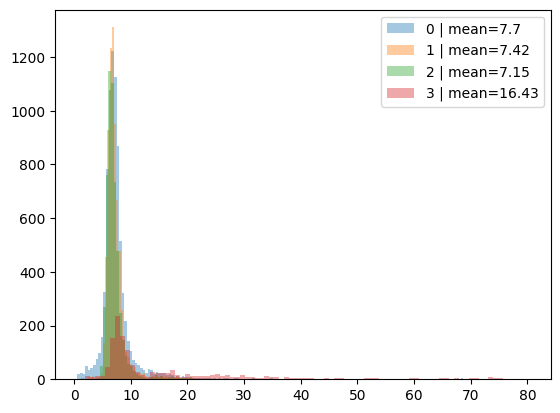

In [73]:
bin_list = [150, 190, 150, 90]
for idx in range(4):
    pixel_peaks_data = list(chain.from_iterable( [list(x) for x in 
                          complete_peaks_y_list[indices_for_samples[idx][0]:indices_for_samples[idx][-1]]]))
    micron_peaks_data = np.array(pixel_peaks_data) * pixel_micron_conversion
    plt.hist(micron_peaks_data,
            bins=bin_list[idx], label=f"{idx} | mean={round(micron_peaks_data.mean(),2)}", alpha=0.4)
    print(f"{idx}\n  - Total mean = {micron_peaks_data.mean()}\n  - Std = {micron_peaks_data.std()}\n  - Median = {np.median(micron_peaks_data)}")
plt.legend()
plt.show()

0
  - Total mean = 7.696235627503405
  - Std = 4.070921895227243
  - Median = 7.013683836711522
1
  - Total mean = 7.418096990963169
  - Std = 3.0763191735846958
  - Median = 6.879180793240524
2
  - Total mean = 7.14744355957381
  - Std = 2.8712317669964094
  - Median = 6.676196827190047
3
  - Total mean = 16.42520423273028
  - Std = 15.026461869678876
  - Median = 9.295223443523373


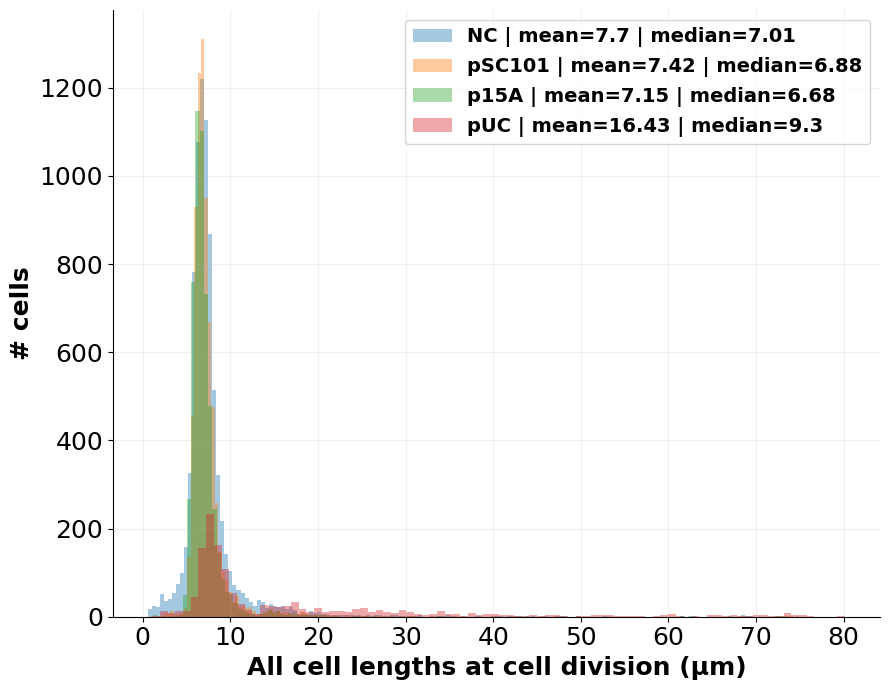

In [74]:
font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
sample_names = list(full_segm_info_df.sample_id.unique())
fig = plt.figure(figsize=(9,7), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,1, figure=fig)
ax1= fig.add_subplot(gs[0,0])

bin_list = [150, 190, 150, 90]
for idx in range(4):
    pixel_peaks_data = list(chain.from_iterable( [list(x) for x in 
                          complete_peaks_y_list[indices_for_samples[idx][0]:indices_for_samples[idx][-1]]]))
    micron_peaks_data = np.array(pixel_peaks_data) * pixel_micron_conversion
    plt.hist(micron_peaks_data,
            bins=bin_list[idx], label=f"{sample_names[idx]} | mean={round(micron_peaks_data.mean(),2)} | median={round(np.nanmedian(micron_peaks_data),2)}", alpha=0.4)
    print(f"{idx}\n  - Total mean = {micron_peaks_data.mean()}\n  - Std = {micron_peaks_data.std()}\n  - Median = {np.median(micron_peaks_data)}")
    
plt.yticks(fontsize=14)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_ylabel("# cells",fontsize=18, fontweight='bold')
ax1.set_xlabel("All cell lengths at cell division (µm)",fontsize=18, fontweight='bold')
ax1.grid(True,alpha=0.2)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
plt.legend(prop={'size': 14,'weight':'bold'})
#plt.savefig(f"reporter_confidence_intervals_STD.png", dpi=300)
plt.show()

0
  - Total mean = 4.301903937896193
  - Std = 2.4811431435770883
  - Median = 4.144823830719476
1
  - Total mean = 4.199058082568985
  - Std = 1.2656674330309372
  - Median = 4.04898949162352
2
  - Total mean = 4.110804751001841
  - Std = 1.5455523395416024
  - Median = 3.9135331547548713
3
  - Total mean = 7.812659840563673
  - Std = 8.704530126036364
  - Median = 4.924972721618529


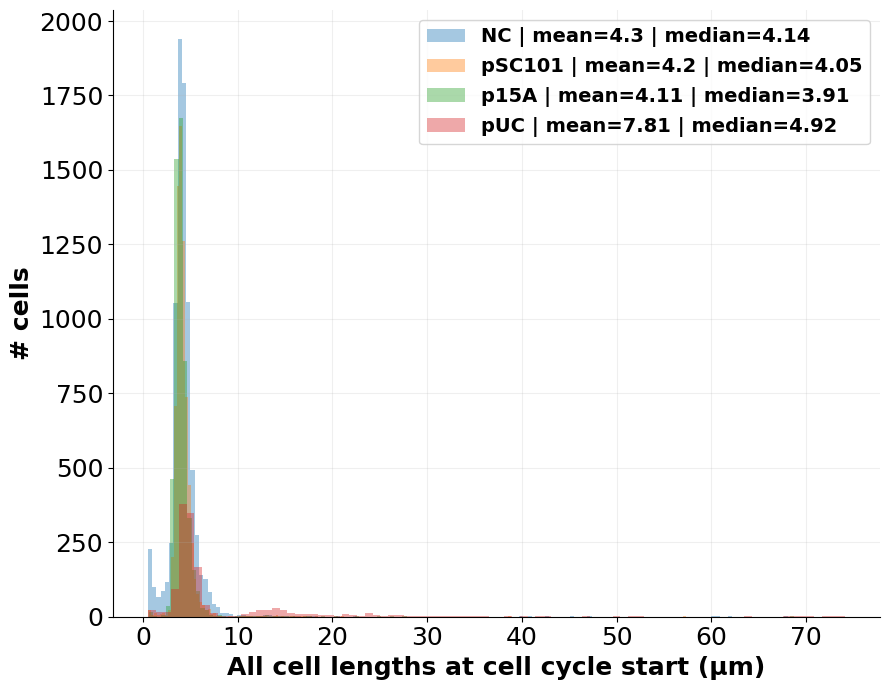

In [75]:
font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
sample_names = list(full_segm_info_df.sample_id.unique())
fig = plt.figure(figsize=(9,7), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,1, figure=fig)
ax1= fig.add_subplot(gs[0,0])

bin_list = [150, 190, 150, 90]
for idx in range(4):
    pixel_valleys_data = list(chain.from_iterable( [list(x) for x in 
                          complete_valleys_y_list[indices_for_samples[idx][0]:indices_for_samples[idx][-1]]]))
    micron_valleys_data = np.array(pixel_valleys_data) * pixel_micron_conversion
    plt.hist(micron_valleys_data,
            bins=bin_list[idx], label=f"{sample_names[idx]} | mean={round(micron_valleys_data.mean(),2)} | median={round(np.nanmedian(micron_valleys_data),2)}", alpha=0.4)
    print(f"{idx}\n  - Total mean = {micron_valleys_data.mean()}\n  - Std = {micron_valleys_data.std()}\n  - Median = {np.median(micron_valleys_data)}")
    
plt.yticks(fontsize=14)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_ylabel("# cells",fontsize=18, fontweight='bold')
ax1.set_xlabel("All cell lengths at cell cycle start (µm)",fontsize=18, fontweight='bold')
ax1.grid(True,alpha=0.2)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
plt.legend(prop={'size': 14,'weight':'bold'})
#plt.savefig(f"reporter_confidence_intervals_STD.png", dpi=300)
plt.show()

In [76]:
500*0.25, 500*0.75

(125.0, 375.0)

In [77]:
import scipy

#### Cell length at doubling time

In [78]:
tr_summ_cell_lenght_total = {}
CLDT_and_DT_total = {}

# Loop through each sample
for idx in tqdm(range(4)):
    print(f"{sample_names[idx]} ---------")
    sample_data = full_segm_info_df.loc[(full_segm_info_df.sample_id == sample_names[idx]) & 
                                        (full_segm_info_df.label == 1)]
    # SC
    tr_summ_cell_lenght_sample = {}
    tr_CLDT_and_DT_total = {}
    for tr in sample_data.trench.unique():
        
        tr_data = sample_data.loc[sample_data.trench==tr]
        ### CELL LENGTH TOTAL
        tr_cl = tr_data.major_axis_length * pixel_micron_conversion
        # Classic statistics
        tr_cl_mean, tr_cl_median, tr_cl_std = tr_cl.mean(), tr_cl.median(), tr_cl.std()
        # Measures of dispersion (%)
        tr_cl_CV, tr_cl_nAAD, tr_cl_nMAD = scipy.stats.variation(tr_cl), mad(tr_cl) / tr_cl_mean, scipy.stats.median_abs_deviation(tr_cl) / tr_cl_mean
        tr_summ_cell_lenght_sample[tr] = {
            'tr_cl_mean' : tr_cl_mean,
            'tr_cl_median' : tr_cl_median,
            'tr_cl_std' : tr_cl_std,
            'tr_cl_CV' : tr_cl_CV,
            'tr_cl_nAAD' : tr_cl_nAAD,
            'tr_cl_nMAD' : tr_cl_nMAD
        }
        
        tr_cw = tr_data.minor_axis_length
        
        ## CELL LENGTH AT DOUBLING TIME (CLDT) & DOUBLING TIME (DT)
        # Calculate peaks' timepoints & their magnitute
        length_peaks = find_peaks(np.array(tr_data.major_axis_length), 
                                  distance = 3, prominence = 3)[0]
        l_peaks_intensities = tr_data.loc[tr_data.timepoint.isin(length_peaks)].major_axis_length
         ## CELL LENGTH AT THE START OF A NEW CELL CYCLE (CLSCC)
         # Calculate valleys' timepoints & their magnitute
        length_valleys = find_peaks(-np.array(tr_data.major_axis_length), 
                                  distance = 3, prominence = 3)[0]
        l_valleys_intensities = tr_data.loc[tr_data.timepoint.isin(length_valleys)].major_axis_length
        # Calculate the inter-trench distance, i.e. the doubling time
        cell_doubling_times_CLDT = [ (length_peaks[idx+1] - length_peaks[idx]) 
                                    for idx in range(0,len(length_peaks)-1)]
        cell_doubling_times_CLSCC = [ (length_valleys[idx+1] - length_valleys[idx]) 
                                    for idx in range(0,len(length_valleys)-1)]
        tr_CLDT_and_DT_total[tr] = {
            'length_peaks' : np.nanmean(length_peaks),
            'l_peaks_intensities' : np.nanmean(l_peaks_intensities),
            'length_valleys' : np.nanmean(length_valleys),
            'l_valleys_intensities' : np.nanmean(l_valleys_intensities),
            'cell_doubling_times_CLDT' : np.nanmean(cell_doubling_times_CLDT),
            'cell_doubling_times_CLSCC' : np.nanmean(cell_doubling_times_CLSCC)
        }
        
    tr_summ_cell_lenght_total[sample_names[idx]] = tr_summ_cell_lenght_sample
    CLDT_and_DT_total[sample_names[idx]] = tr_CLDT_and_DT_total
    # P
    
    
    
    # GM
    cell_length_total_for_sample = sample_data.major_axis_length.mean()*pixel_micron_conversion

  0%|          | 0/4 [00:00<?, ?it/s]

NC ---------
pSC101 ---------
p15A ---------
pUC ---------


In [79]:
NC_summ_cell_lenght_total = pd.DataFrame(tr_summ_cell_lenght_total['NC']).T
pSC101_summ_cell_lenght_total = pd.DataFrame(tr_summ_cell_lenght_total['pSC101']).T
p15A_summ_cell_lenght_total = pd.DataFrame(tr_summ_cell_lenght_total['p15A']).T
pUC_summ_cell_lenght_total = pd.DataFrame(tr_summ_cell_lenght_total['pUC']).T

SC_cell_length_results = pd.DataFrame({'NC' : NC_summ_cell_lenght_total.mean(), 
              'pSC101' : pSC101_summ_cell_lenght_total.mean(), 
              'p15A' : p15A_summ_cell_lenght_total.mean(), 
              'pUC' : pUC_summ_cell_lenght_total.mean()})
SC_cell_length_results

,NC,pSC101,p15A,pUC
tr_cl_mean,5.782422,5.751793,5.603583,11.414257
tr_cl_median,5.492716,5.361276,5.209162,8.083697
tr_cl_std,2.146504,1.872136,1.814661,8.352609
tr_cl_CV,0.359065,0.293609,0.299074,0.672390
tr_cl_nAAD,0.254092,0.220321,0.224282,0.495456
tr_cl_nMAD,0.178764,0.159284,0.163080,0.173617


In [80]:
pd.DataFrame(CLDT_and_DT_total['NC'])

,0,1,2,3,4,5,6,7,8,9,...,424,425,426,427,428,429,430,431,432,433
length_peaks,NaN,62.785714,49.800000,46.684211,51.533333,47.894737,5.000000,50.250000,52.611111,51.157895,...,48.250000,50.578947,46.809524,35.142857,48.450000,49.631579,50.705882,47.095238,50.600000,36.416667
l_peaks_intensities,NaN,70.859971,63.127423,61.944358,439.532866,65.747765,58.226720,63.356202,75.874206,58.573770,...,62.263274,65.606679,73.206774,87.652332,68.084251,63.474808,78.708883,76.672963,75.992106,98.815743
length_valleys,NaN,63.857143,48.428571,47.789474,45.750000,48.894737,6.000000,51.250000,50.842105,52.263158,...,49.250000,51.578947,47.809524,38.866667,46.842105,48.150000,46.058824,48.190476,49.285714,37.416667
l_valleys_intensities,NaN,34.443342,38.329255,35.698908,363.736386,38.084489,33.470581,37.766199,42.245937,33.879547,...,36.816774,38.686832,45.256468,57.190737,39.650779,37.426827,42.229251,41.157108,46.655445,53.426896
cell_doubling_times_CLDT,NaN,5.538462,4.789474,5.277778,6.785714,5.000000,NaN,4.789474,5.176471,5.166667,...,4.842105,5.055556,4.650000,5.692308,5.105263,5.000000,5.750000,4.750000,4.894737,7.181818
cell_doubling_times_CLSCC,NaN,5.538462,4.750000,5.277778,8.090909,5.000000,NaN,4.789474,5.277778,5.166667,...,4.842105,5.055556,4.650000,5.357143,5.055556,4.947368,5.812500,4.750000,4.850000,7.181818


In [81]:
NC_summ_CL_and_DTs_total = pd.DataFrame(CLDT_and_DT_total['NC']).T
pSC101_summ_CL_and_DTs_total = pd.DataFrame(CLDT_and_DT_total['pSC101']).T
p15A_summ_CL_and_DTs_total = pd.DataFrame(CLDT_and_DT_total['p15A']).T
pUC_summ_CL_and_DTs_total = pd.DataFrame(CLDT_and_DT_total['pUC']).T

pd.DataFrame({'NC' : NC_summ_CL_and_DTs_total.mean(), 
              'pSC101' : pSC101_summ_CL_and_DTs_total.mean(), 
              'p15A' : p15A_summ_CL_and_DTs_total.mean(), 
              'pUC' : pUC_summ_CL_and_DTs_total.mean()})

,NC,pSC101,p15A,pUC
length_peaks,48.245621,49.498006,49.525133,48.730598
l_peaks_intensities,70.831041,69.606362,67.315337,201.357755
length_valleys,48.315864,49.782171,49.835484,48.774836
l_valleys_intensities,40.075332,38.706024,38.835298,84.672394
cell_doubling_times_CLDT,5.134761,5.461827,5.741336,8.011427
cell_doubling_times_CLSCC,5.159217,5.491912,5.883109,7.690798


In [82]:
complete_peaks_x_list = []
cell_doubling_times_list = []
complete_peaks_y_list = []

complete_valleys_x_list = []
complete_valleys_y_list = []


width_at_peaks_list = []
width_at_valleys_list = []
complete_peak_stats = {}
for tr in tqdm(range(0,len(filled_trench_master_zarr))):
    # Select trench/cell and label
    trench_data = full_segm_info_df.loc[(full_segm_info_df.trench == tr) & 
                                        (full_segm_info_df.label == 1)]
    # PEAKS
    # Calculate peaks' timepoints & their magnitute
    length_peaks = find_peaks(np.array(trench_data.major_axis_length), 
                              distance = 3, prominence = 3)[0]
    l_peaks_intensities = trench_data.loc[trench_data.timepoint.isin(length_peaks)].major_axis_length * pixel_micron_conversion
    width_at_peaks = trench_data.loc[trench_data.timepoint.isin(length_peaks)].minor_axis_length * pixel_micron_conversion
    # Classic statistics
    tr_peak_mean, tr_peak_median, tr_peak_std = np.nanmean(l_peaks_intensities), np.nanmedian(l_peaks_intensities), np.nanstd(l_peaks_intensities)
    # Measures of dispersion (%)
    tr_peak_CV, tr_peak_nAAD, tr_peak_nMAD = scipy.stats.variation(l_peaks_intensities), mad(np.array(l_peaks_intensities)) / tr_peak_mean, scipy.stats.median_abs_deviation(l_peaks_intensities) / tr_peak_mean
    
    complete_peak_stats[tr] = {
            'tr_peak_mean' : tr_peak_mean,
            'tr_peak_median' : tr_peak_median,
            'tr_peak_std' : tr_peak_std,
            'tr_peak_CV' : tr_peak_CV,
            'tr_peak_nAAD' : tr_peak_nAAD,
            'tr_peak_nMAD' : tr_peak_nMAD
        }
    
    # VALLEYS
    # Calculate valleys' timepoints & their magnitute
    length_valleys = find_peaks(-np.array(trench_data.major_axis_length), 
                              distance = 3, prominence = 3)[0]
    l_valleys_intensities = trench_data.loc[trench_data.timepoint.isin(length_valleys)].major_axis_length * pixel_micron_conversion
    width_at_valleys = trench_data.loc[trench_data.timepoint.isin(length_valleys)].minor_axis_length * pixel_micron_conversion
    # Calculate the inter-trench distance, i.e. the doubling time
    cell_doubling_times = [ (length_peaks[idx+1] - length_peaks[idx]) 
                           for idx in range(0,len(length_peaks)-1)]
    cell_doubling_times_list.append(cell_doubling_times)
    complete_peaks_x_list.append(length_peaks)
    complete_peaks_y_list.append(l_peaks_intensities)
    complete_valleys_x_list.append(length_valleys)
    complete_valleys_y_list.append(l_valleys_intensities)
    width_at_peaks_list.append(width_at_peaks)
    width_at_valleys_list.append(width_at_valleys)
print(len(complete_peaks_x_list), len(cell_doubling_times_list), len(complete_peaks_y_list))

  0%|          | 0/1334 [00:00<?, ?it/s]

1334 1334 1334


In [83]:

summary_diff = np.array(list(chain.from_iterable([list(x) for x in complete_peaks_x_list])))[:21880] - np.array(list(chain.from_iterable([list(x) for x in complete_valleys_y_list])))
summary_diff_width = np.array(list(chain.from_iterable([list(x) for x in width_at_peaks_list])))[:21880] - np.array(list(chain.from_iterable([list(x) for x in width_at_valleys_list])))

4.918813511632397


(-7.657295703037998, 10.630392798263376)

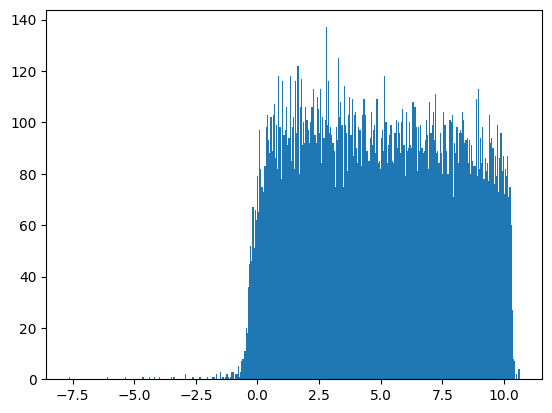

In [84]:
plt.hist(summary_diff*pixel_micron_conversion, bins=400);
print(np.nanmean(summary_diff*pixel_micron_conversion))
(summary_diff*pixel_micron_conversion).min(), (summary_diff*pixel_micron_conversion).max()

0.006348248662716395


(-0.38561799732090407, 0.39745131408798745)

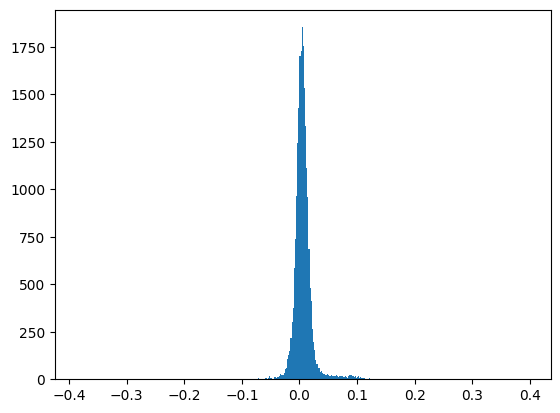

In [102]:
plt.hist(summary_diff_width*pixel_micron_conversion, bins=400);
print(np.nanmean(summary_diff_width*pixel_micron_conversion))
(summary_diff_width*pixel_micron_conversion).min(), (summary_diff_width*pixel_micron_conversion).max()

In [86]:
pd.DataFrame(complete_peak_stats)[indices_for_samples[3]].T#.mean()

,tr_peak_mean,tr_peak_median,tr_peak_std,tr_peak_CV,tr_peak_nAAD,tr_peak_nMAD
1176,22.997095,25.899148,5.087479,0.221223,0.207346,0.058635
1177,12.595986,9.841452,5.926063,0.470472,0.364946,0.192724
1178,24.946055,24.946055,0.899439,0.036055,0.036055,0.036055
1179,27.918489,27.918489,3.483061,0.124758,0.124758,0.124758
1180,12.475776,8.630228,9.452035,0.757631,0.561458,0.098536
...,...,...,...,...,...,...
1329,14.828120,9.701379,10.401498,0.701471,0.532672,0.152187
1330,32.760250,20.034574,25.614421,0.781875,0.691038,0.321942
1331,14.039075,8.290481,9.694565,0.690542,0.575373,0.098464
1332,9.608749,7.153222,4.462634,0.464434,0.376852,0.042173


In [87]:
NC_summ_CL_and_DTs_total = pd.DataFrame(CLDT_and_DT_total['NC']).T
pSC101_summ_CL_and_DTs_total = pd.DataFrame(CLDT_and_DT_total['pSC101']).T
p15A_summ_CL_and_DTs_total = pd.DataFrame(CLDT_and_DT_total['p15A']).T
pUC_summ_CL_and_DTs_total = pd.DataFrame(CLDT_and_DT_total['pUC']).T

pd.DataFrame({'NC' : NC_summ_CL_and_DTs_total.mean(), 
              'pSC101' : pSC101_summ_CL_and_DTs_total.mean(), 
              'p15A' : p15A_summ_CL_and_DTs_total.mean(), 
              'pUC' : pUC_summ_CL_and_DTs_total.mean()})

,NC,pSC101,p15A,pUC
length_peaks,48.245621,49.498006,49.525133,48.730598
l_peaks_intensities,70.831041,69.606362,67.315337,201.357755
length_valleys,48.315864,49.782171,49.835484,48.774836
l_valleys_intensities,40.075332,38.706024,38.835298,84.672394
cell_doubling_times_CLDT,5.134761,5.461827,5.741336,8.011427
cell_doubling_times_CLSCC,5.159217,5.491912,5.883109,7.690798


(array([ 2.,  5.,  8., 30., 29., 19.,  8., 10.,  3.,  5.,  1.,  4.,  4.,
         0.,  1.,  1.,  3.,  2.,  1.,  0.,  0.,  0.,  1.,  0.,  0.,  1.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         1.]),
 array([ 15.   ,  18.875,  22.75 ,  26.625,  30.5  ,  34.375,  38.25 ,
         42.125,  46.   ,  49.875,  53.75 ,  57.625,  61.5  ,  65.375,
         69.25 ,  73.125,  77.   ,  80.875,  84.75 ,  88.625,  92.5  ,
         96.375, 100.25 , 104.125, 108.   , 111.875, 115.75 , 119.625,
        123.5  , 127.375, 131.25 , 135.125, 139.   , 142.875, 146.75 ,
        150.625, 154.5  , 158.375, 162.25 , 166.125, 170.   ]),
 <BarContainer object of 40 artists>)

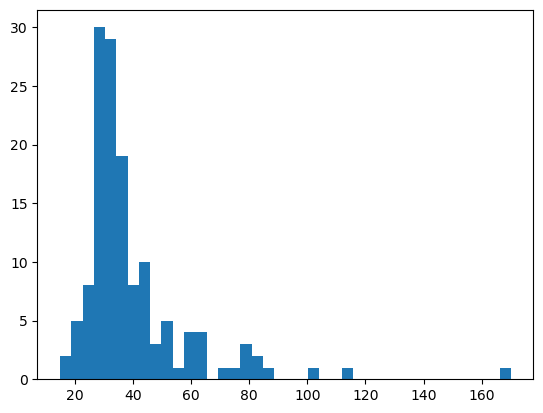

In [88]:
plt.hist([np.nanmean(x)*5 for x in cell_doubling_times_list[indices_for_samples[-1][0]:indices_for_samples[-1][-1]] ], bins=40)

In [89]:
16 / 155

0.1032258064516129

#### No of doubling events graph

µ = 17.7 | mode = 19
µ = 16.4 | mode = 17
µ = 15.6 | mode = 17
µ = 7.7 | mode = 12


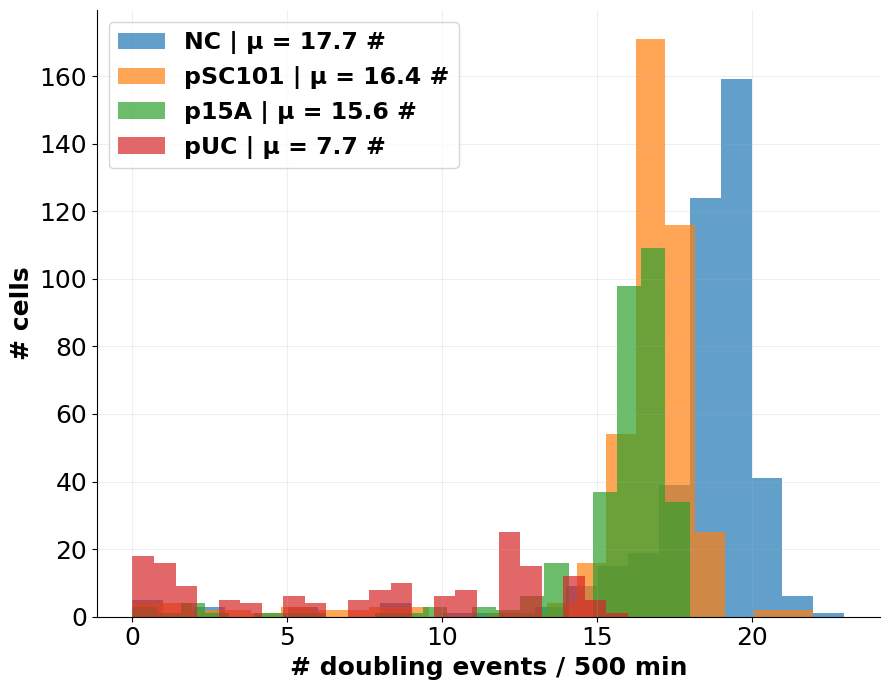

In [90]:


font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
sample_names = list(full_segm_info_df.sample_id.unique())
standard_mpl_colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']

fig = plt.figure(figsize=(9,7), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,1, figure=fig)
ax1 = fig.add_subplot(gs[0,0])
no_growers = {}
bin_list = [50, 50, 40, 20]
sample_no = []
for sample_idx in range(4):
    summary_ = []
    doubling_events_data = [len(x) for x in cell_doubling_times_list[indices_for_samples[sample_idx][0]:indices_for_samples[sample_idx][-1]] ]
    sample_no.append(doubling_events_data)
    for idx, cell_de_no in enumerate(doubling_events_data):
        if cell_de_no == 0:
            summary_.append(idx)
    no_growers[sample_names[sample_idx]] = summary_
    mean = np.nanmean(doubling_events_data)
    mode = scipy.stats.mode(doubling_events_data)[0][0]
    ax1.hist([len(x) for x in cell_doubling_times_list[indices_for_samples[sample_idx][0]:indices_for_samples[sample_idx][-1]] ], bins=23, label=f"{sample_names[sample_idx]} | µ = {round(mean,1)} #", alpha=0.7,color=standard_mpl_colors[sample_idx])
    # ax1.vlines(mode, 0, 180,alpha=0.8,color=standard_mpl_colors[sample_idx], linestyle='--')
    print(f"µ = {round(mean,1)} | mode = {mode}")
    
plt.yticks(fontsize=14)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_ylabel("# cells",fontsize=18, fontweight='bold')
ax1.set_xlabel("# doubling events / 500 min",fontsize=18, fontweight='bold')
ax1.grid(True,alpha=0.2)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
plt.legend(prop={'size': 17,'weight':'bold'})
plt.savefig(f"doubling_events.png", dpi=300)
plt.show()

In [91]:
for idx, name in enumerate(no_growers.keys()):
    print(f"{name} -> {len(no_growers[name])} / {len(sample_no[idx])}")
    print(f"      {len(no_growers[name]) / len(sample_no[idx]) * 100}")

NC -> 5 / 433
      1.1547344110854503
pSC101 -> 4 / 418
      0.9569377990430622
p15A -> 3 / 322
      0.9316770186335404
pUC -> 18 / 157
      11.464968152866243


In [92]:
5 / 434*100, 4 / 418*100, 3 / 323*100, 18 / 155 * 100


(1.1520737327188941,
 0.9569377990430622,
 0.9287925696594427,
 11.612903225806452)

#### DT graph

µ = 25.6 | CV = 31.8 | nMAD = 3.1 | mode = 25.0
µ = 27.3 | CV = 24.2 | nMAD = 2.2 | mode = 26.470588235294116
µ = 28.7 | CV = 39.3 | nMAD = 2.8 | mode = 26.76470588235294
µ = 40.1 | CV = 49.3 | nMAD = 12.5 | mode = nan


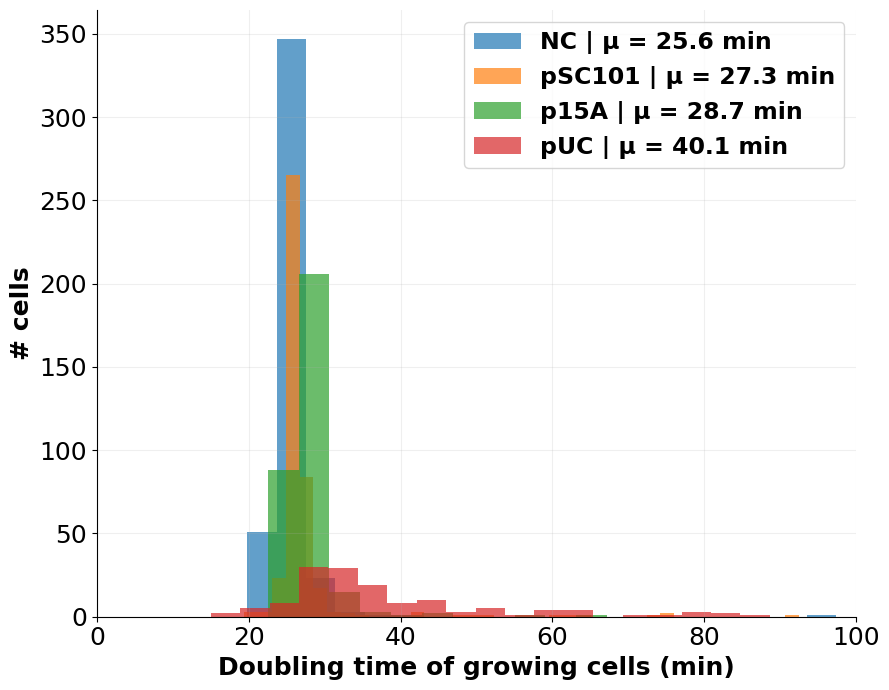

In [93]:


font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
sample_names = list(full_segm_info_df.sample_id.unique())
standard_mpl_colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']

fig = plt.figure(figsize=(9,7), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,1, figure=fig)
ax1 = fig.add_subplot(gs[0,0])

bin_list = [50, 50, 40, 20]
for sample_idx in range(4):
    data_dts = [np.nanmean(x)*5 for x in cell_doubling_times_list[indices_for_samples[sample_idx][0]:indices_for_samples[sample_idx][-1]] ]
    mean = np.nanmean(data_dts)
    mode = scipy.stats.mode(data_dts)[0][0]
    # mean = round(np.nanmean(cell_length_CLDT),1)
    cv = round(scipy.stats.variation(data_dts,nan_policy='omit')*100,1)
    MAD = scipy.stats.median_abs_deviation(data_dts,nan_policy='omit')
    nMAD = round(MAD / mean * 100, 1)
    ax1.hist([np.nanmean(x)*5 for x in cell_doubling_times_list[indices_for_samples[sample_idx][0]:indices_for_samples[sample_idx][-1]] ], bins=40, label=f"{sample_names[sample_idx]} | µ = {round(mean,1)} min", alpha=0.7,color=standard_mpl_colors[sample_idx])
    # ax1.vlines(mode, 0, 180,alpha=0.8,color=standard_mpl_colors[sample_idx], linestyle='--')
    print(f"µ = {round(mean,1)} | CV = {cv} | nMAD = {nMAD} | mode = {mode}")
    
plt.yticks(fontsize=14)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_ylabel("# cells",fontsize=18, fontweight='bold')
ax1.set_xlabel("Doubling time of growing cells (min)",fontsize=18, fontweight='bold')
ax1.grid(True,alpha=0.2)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
ax1.set_xlim(0,100)
plt.legend(prop={'size': 17,'weight':'bold'})
# plt.savefig(f"doubling_times.png", dpi=300)
plt.show()

In [94]:
from scipy.stats import ttest_ind

# Generate two random samples
data_dts0 = [np.nanmean(x)*5 for x in cell_doubling_times_list[indices_for_samples[0][0]:indices_for_samples[0][-1]] ]
data_dts1 = [np.nanmean(x)*5 for x in cell_doubling_times_list[indices_for_samples[1][0]:indices_for_samples[1][-1]] ]
data_dts2 = [np.nanmean(x)*5 for x in cell_doubling_times_list[indices_for_samples[2][0]:indices_for_samples[2][-1]] ]
data_dts3 = [np.nanmean(x)*5 for x in cell_doubling_times_list[indices_for_samples[3][0]:indices_for_samples[3][-1]] ]

n_samples1 = len(data_dts2)
n_samples2 = len(data_dts3)

print(n_samples1, n_samples2)

sample1 = data_dts2
sample2 = data_dts3
combo_set = [data_dts0,data_dts1,data_dts2,data_dts3]

for combo_x in combinations([0,1,2,3],2):
    combo = [combo_set[combo_x[0]], combo_set[combo_x[1]]]
    print(combo_x)
    # Compute the t-statistic and p-value using the two-sample t-test
    t_stat, p_value = ttest_ind(combo[0], combo[1],nan_policy='omit')
    # Print the t-statistic and p-value
    print(f"t-statistic: {t_stat}")
    print(f"p-value: {p_value}")


322 157
(0, 1)
t-statistic: -3.2284232998883837
p-value: 0.0012930458305910894
(0, 2)
t-statistic: -4.292050790475352
p-value: 2.004046304350576e-05
(0, 3)
t-statistic: -12.231065872260672
p-value: 1.1053665179940645e-30
(1, 2)
t-statistic: -2.0946004772615825
p-value: 0.03655021232953846
(1, 3)
t-statistic: -11.386792029811556
p-value: 4.009702112684182e-27
(2, 3)
t-statistic: -7.77684481775185
p-value: 5.0001152750413607e-14


In [95]:
means_per_sample = [25.6, 27.3, 28.7, 40.1]
type(means_per_sample[sample_idx])

float

In [96]:
for sample_idx in range(4):
    print(sample_names[sample_idx])
    curr_doubling_times = [np.nanmean(x) for x in cell_doubling_times_list[indices_for_samples[sample_idx][0]:indices_for_samples[sample_idx][-1]]]
    for idx, x in enumerate(curr_doubling_times):
        if all([x*5 > means_per_sample[sample_idx]-0.4, x*5 < means_per_sample[sample_idx]+0.4] ):
            print(indices_for_samples[sample_idx][idx])


NC
8
9
10
11
14
15
17
23
24
26
28
51
54
57
61
64
79
86
91
94
95
96
103
106
115
119
120
135
136
139
148
153
162
166
173
174
184
185
187
193
223
226
229
230
231
233
235
245
249
250
253
256
258
260
265
276
289
293
295
297
301
306
308
313
314
319
322
323
332
334
344
349
352
353
358
359
360
366
370
372
377
378
385
391
397
411
412
414
415
418
425
428
pSC101
456
507
521
525
533
537
552
562
580
583
585
625
633
634
637
640
641
644
650
653
681
688
709
714
719
721
733
736
748
758
789
808
816
818
830
840
p15A
853
855
862
869
877
886
913
921
928
930
941
974
979
980
992
998
1031
1041
1052
1091
1117
1126
1128
1157
1159
1169
1173
pUC
1232
1243


#### Example growth cuvres

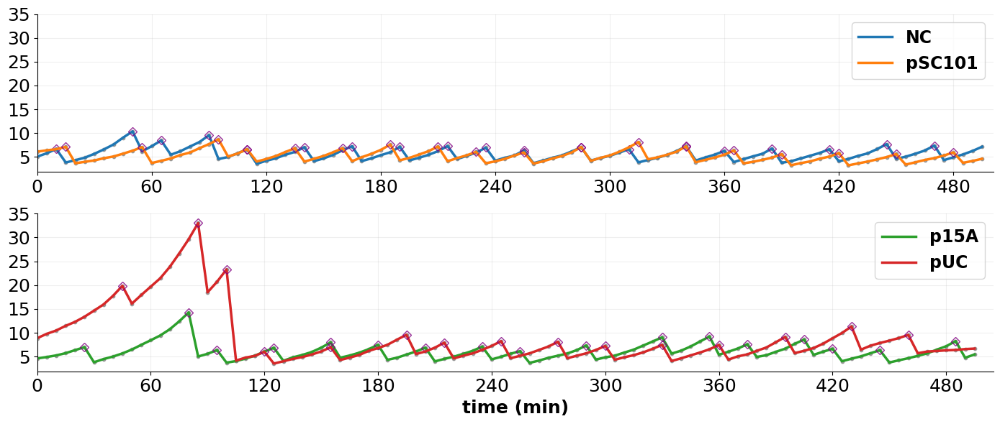

In [103]:
font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
sample_names = list(full_segm_info_df.sample_id.unique())
standard_mpl_colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
trench_to_plot = [174, 625, 998, 1300]
fig = plt.figure(figsize=(14,6), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(2,1, figure=fig)

timepoint_interval = 5
timepoint = list(range(500))
ax1 = fig.add_subplot(gs[0,0])
for idx, sample_idx in enumerate(trench_to_plot[:2]):
    trench_data = full_segm_info_df.loc[(full_segm_info_df.label==1) & (full_segm_info_df.trench==sample_idx)]
    length_peaks = find_peaks(np.array(trench_data.major_axis_length), distance=3, prominence=3)[0]
    l_peaks_intensities = trench_data.loc[trench_data.timepoint.isin(length_peaks)].major_axis_length
    ax1.plot(trench_data.timepoint*timepoint_interval,trench_data.major_axis_length*pixel_micron_conversion, label=f"{sample_names[idx]}",linewidth=2.5)#, s=5, alpha=0.7,color='grey')
    ax1.scatter(trench_data.timepoint*timepoint_interval,np.array(trench_data.major_axis_length*pixel_micron_conversion), s=10, alpha=0.7,color='grey')
    ax1.plot(length_peaks*5, l_peaks_intensities*pixel_micron_conversion,marker='D', alpha=0.8, markerfacecolor="none", markeredgecolor="purple", color='none')


plt.yticks(fontsize=14) #
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
# ax1.set_ylabel("cell length (µm)",fontsize=18, fontweight='bold')
# ax1.set_xlabel("time (min)",fontsize=18, fontweight='bold')
current_x_ticks = np.arange(0, 600, 60)
new_x_ticks = np.arange(0, 541, 60)
ax1.set_xticks(new_x_ticks)
ax1.grid(True,alpha=0.2)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
ax1.set_ylim(1.9,35)
ax1.set_xlim(0,501,5)
plt.legend(prop={'size': 17,'weight':'bold'})
ax1 = fig.add_subplot(gs[1,0])
for idx, sample_idx in enumerate(trench_to_plot[2:]):
    trench_data = full_segm_info_df.loc[(full_segm_info_df.label==1) & (full_segm_info_df.trench==sample_idx)]
    length_peaks = find_peaks(np.array(trench_data.major_axis_length), distance=3, prominence=3)[0]
    l_peaks_intensities = trench_data.loc[trench_data.timepoint.isin(length_peaks)].major_axis_length
    ax1.plot(trench_data.timepoint*timepoint_interval,trench_data.major_axis_length*pixel_micron_conversion, label=f"{sample_names[2:][idx]}",linewidth=2.5, color=standard_mpl_colors[2:][idx])#, s=5, alpha=0.7,color='grey')
    ax1.scatter(trench_data.timepoint*timepoint_interval,np.array(trench_data.major_axis_length*pixel_micron_conversion), s=10, alpha=0.7,color='grey')
    ax1.plot(length_peaks*5, l_peaks_intensities*pixel_micron_conversion,marker='D', alpha=0.8, markerfacecolor="none", markeredgecolor="purple", color='none')

plt.yticks(fontsize=14)
ax1.spines['right'].set_visible(False) #
ax1.spines['top'].set_visible(False)
# ax1.set_ylabel("cell length (µm)",fontsize=18, fontweight='bold')
ax1.set_xlabel("time (min)",fontsize=18, fontweight='bold')
current_x_ticks = np.arange(0, 600, 60)
new_x_ticks = np.arange(0, 541, 60)
ax1.set_xticks(new_x_ticks)
ax1.grid(True,alpha=0.2)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
ax1.set_ylim(1.9,35)
ax1.set_xlim(0,505)
plt.legend(prop={'size': 17,'weight':'bold'})
# plt.savefig(f"example_growth_cuvres.png", dpi=300)
plt.show()

#### CL Length [ALL]

µ = 7.7 | cv = 0.3741612540159423 | nMAD = 0.08598621404841783 | mode = ModeResult(mode=array([3.72004657]), count=array([1.]))
µ = 7.6 | cv = 0.36668615083592077 | nMAD = 0.052655510514109286 | mode = ModeResult(mode=array([2.75261161]), count=array([1.]))
µ = 7.4 | cv = 0.3820850316393391 | nMAD = 0.05292142902411858 | mode = ModeResult(mode=array([3.04981638]), count=array([1.]))
µ = 22.0 | cv = 0.7458293534040584 | nMAD = 0.261058906251805 | mode = ModeResult(mode=array([2.48365545]), count=array([1.]))


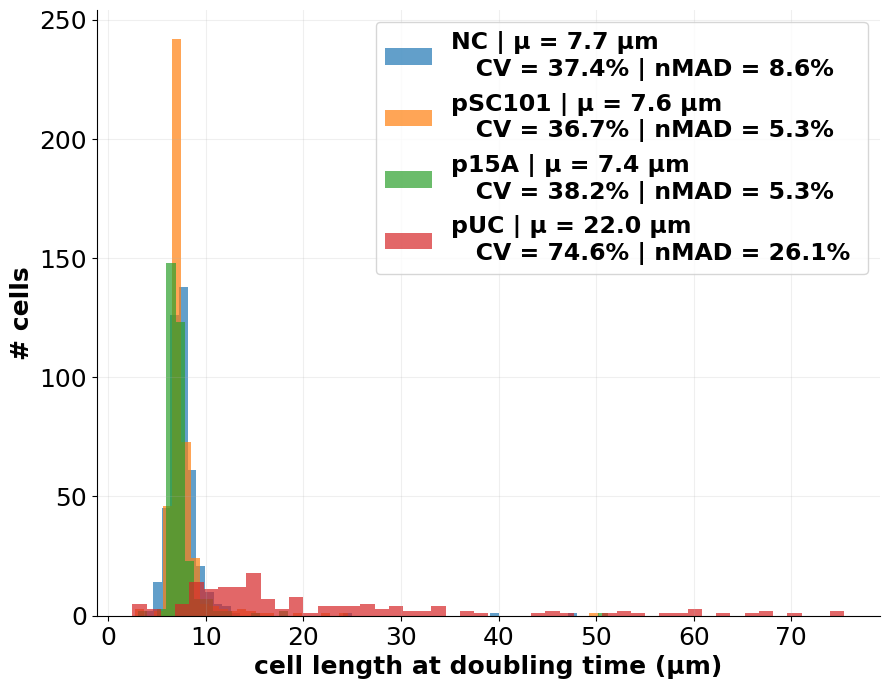

In [98]:


font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
sample_names = list(full_segm_info_df.sample_id.unique())
standard_mpl_colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']

fig = plt.figure(figsize=(9,7), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,1, figure=fig)
ax1 = fig.add_subplot(gs[0,0])

bin_list = [50, 50, 40, 20]
for sample_idx in range(4):
    cell_length_CLDT = [np.nanmean(x) for x in complete_peaks_y_list[indices_for_samples[sample_idx][0]:indices_for_samples[sample_idx][-1]] ]
    mode = scipy.stats.mode(cell_length_CLDT,nan_policy='omit')
    mean = round(np.nanmean(cell_length_CLDT),1)
    cv = scipy.stats.variation(cell_length_CLDT,nan_policy='omit')
    MAD = scipy.stats.median_abs_deviation(cell_length_CLDT,nan_policy='omit')
    nMAD = MAD / mean
    ax1.hist(cell_length_CLDT, bins=50, label=f"{sample_names[sample_idx]} | µ = {mean} µm\n   CV = {round(cv*100,1)}% | nMAD = {round(nMAD*100,1)}% ", alpha=0.7,color=standard_mpl_colors[sample_idx])
    # ax1.vlines(mode, 0, 180,alpha=0.8,color=standard_mpl_colors[sample_idx], linestyle='--')
    print(f"µ = {round(mean,1)} | cv = {cv} | nMAD = {nMAD} | mode = {mode}")
    # cell_length_CLDT = [np.nanmean(x) for x in complete_valleys_y_list[indices_for_samples[sample_idx][0]:indices_for_samples[sample_idx][-1]] ]
    # mode = scipy.stats.mode(cell_length_CLDT)[0][0]
    # mean = round(np.nanmean(cell_length_CLDT),1)
    # ax1.hist(cell_length_CLDT, bins=50, label=f"{sample_names[sample_idx]} | µ = {mean} µm", alpha=0.7,color=standard_mpl_colors[sample_idx])
    # # ax1.vlines(mode, 0, 180,alpha=0.8,color=standard_mpl_colors[sample_idx], linestyle='--')
    # print(f"µ = {round(mean,1)} | mode = {mode}")
    
plt.yticks(fontsize=14)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_ylabel("# cells",fontsize=18, fontweight='bold')
ax1.set_xlabel("cell length at doubling time (µm)",fontsize=18, fontweight='bold')
ax1.grid(True,alpha=0.2)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
# ax1.set_xlim(0,100)
plt.legend(prop={'size': 17,'weight':'bold'})
# plt.savefig(f"CLDT.png", dpi=300)
plt.show()

µ = 7.7 | cv = 0.3741612540159423 | nMAD = 0.08598621404841783 | mode = ModeResult(mode=array([3.72004657]), count=array([1.]))
µ = 4.4 | mode = nan
µ = 7.6 | cv = 0.36668615083592077 | nMAD = 0.052655510514109286 | mode = ModeResult(mode=array([2.75261161]), count=array([1.]))
µ = 4.2 | mode = 2.023269717211446
µ = 7.4 | cv = 0.3820850316393391 | nMAD = 0.05292142902411858 | mode = ModeResult(mode=array([3.04981638]), count=array([1.]))
µ = 4.2 | mode = 1.2997922018673063
µ = 22.0 | cv = 0.7458293534040584 | nMAD = 0.261058906251805 | mode = ModeResult(mode=array([2.48365545]), count=array([1.]))
µ = 9.3 | mode = nan


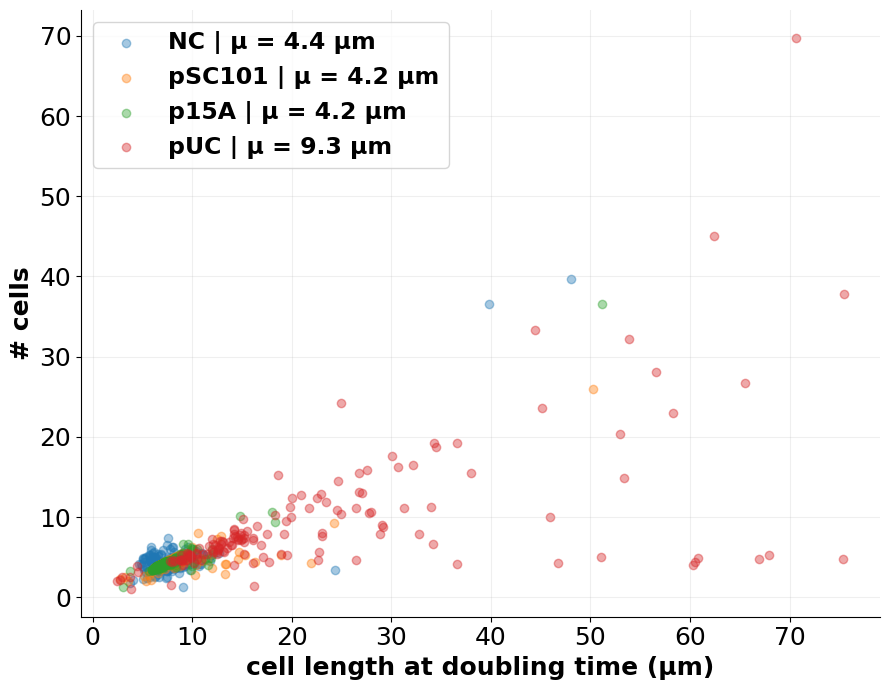

In [99]:


font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
sample_names = list(full_segm_info_df.sample_id.unique())
standard_mpl_colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']

fig = plt.figure(figsize=(9,7), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,1, figure=fig)
ax1 = fig.add_subplot(gs[0,0])

bin_list = [50, 50, 40, 20]
for sample_idx in range(4):
    cell_length_CLDT = [np.nanmean(x) for x in complete_peaks_y_list[indices_for_samples[sample_idx][0]:indices_for_samples[sample_idx][-1]] ]
    mode = scipy.stats.mode(cell_length_CLDT,nan_policy='omit')
    mean = round(np.nanmean(cell_length_CLDT),1)
    cv = scipy.stats.variation(cell_length_CLDT,nan_policy='omit')
    MAD = scipy.stats.median_abs_deviation(cell_length_CLDT,nan_policy='omit')
    nMAD = MAD / mean
    # ax1.hist(cell_length_CLDT, bins=50, label=f"{sample_names[sample_idx]} | µ = {mean} µm\n   CV = {round(cv*100,1)}% | nMAD = {round(nMAD*100,1)}% ", alpha=0.7,color=standard_mpl_colors[sample_idx])
    # ax1.vlines(mode, 0, 180,alpha=0.8,color=standard_mpl_colors[sample_idx], linestyle='--')
    print(f"µ = {round(mean,1)} | cv = {cv} | nMAD = {nMAD} | mode = {mode}")
    cell_length_CLCC = [np.nanmean(x) for x in complete_valleys_y_list[indices_for_samples[sample_idx][0]:indices_for_samples[sample_idx][-1]] ]
    mode = scipy.stats.mode(cell_length_CLCC)[0][0]
    mean = round(np.nanmean(cell_length_CLCC),1)
    # ax1.hist(cell_length_CLCC, bins=50, label=f"{sample_names[sample_idx]} | µ = {mean} µm", alpha=0.7,color=standard_mpl_colors[sample_idx])
    
    ax1.scatter(cell_length_CLDT, cell_length_CLCC, label=f"{sample_names[sample_idx]} | µ = {mean} µm", alpha=0.4,color=standard_mpl_colors[sample_idx])
    # ax1.vlines(mode, 0, 180,alpha=0.8,color=standard_mpl_colors[sample_idx], linestyle='--')
    print(f"µ = {round(mean,1)} | mode = {mode}")
    
plt.yticks(fontsize=14)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_ylabel("# cells",fontsize=18, fontweight='bold')
ax1.set_xlabel("cell length at doubling time (µm)",fontsize=18, fontweight='bold')
ax1.grid(True,alpha=0.2)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
# ax1.set_xlim(0,100)
plt.legend(prop={'size': 17,'weight':'bold'})
# plt.savefig(f"CLDT.png", dpi=300)
plt.show()

#### CL Length [CLDT]

µ = 5.8 | cv = 0.4220385989325694 | nMAD = 0.06243789552516776 | mode = ModeResult(mode=array([1.80162965]), count=array([1]))
µ = 5.8 | cv = 0.27863301325818884 | nMAD = 0.051907043876913674 | mode = ModeResult(mode=array([2.26159019]), count=array([1]))
µ = 5.6 | cv = 0.26663473535959586 | nMAD = 0.05383875796392165 | mode = ModeResult(mode=array([3.68436844]), count=array([1]))
µ = 11.4 | cv = 0.5494115192854451 | nMAD = 0.19534406911033514 | mode = ModeResult(mode=array([2.49300241]), count=array([1]))


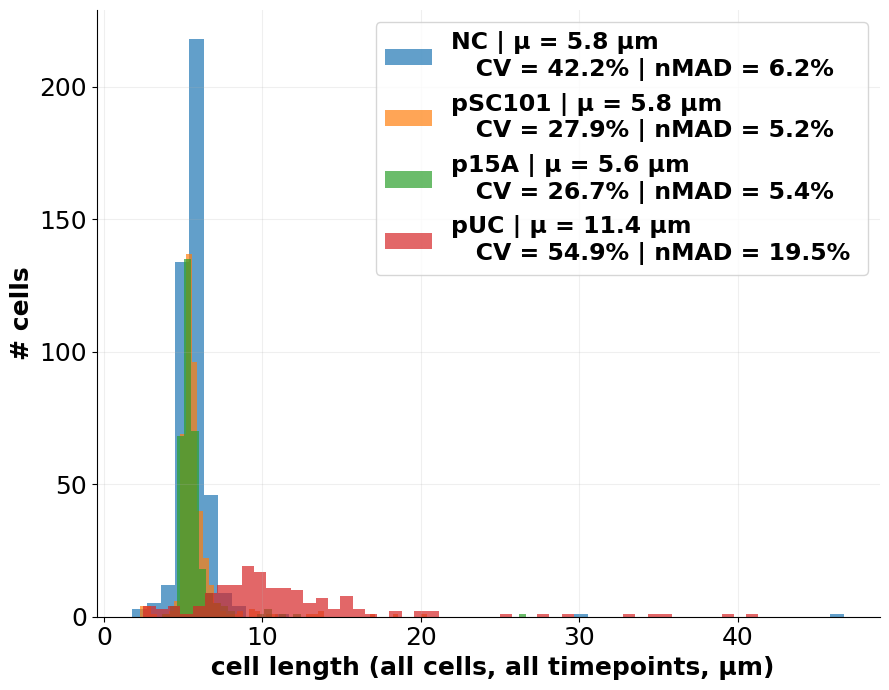

In [100]:


font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
sample_names = list(full_segm_info_df.sample_id.unique())
standard_mpl_colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']

fig = plt.figure(figsize=(9,7), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,1, figure=fig)
ax1 = fig.add_subplot(gs[0,0])
cltd_summary = [NC_summ_cell_lenght_total, pSC101_summ_cell_lenght_total, p15A_summ_cell_lenght_total, pUC_summ_cell_lenght_total ]

bin_list = [50, 50, 40, 20]
for sample_idx in range(4):
    cell_length_CLDT = cltd_summary[sample_idx].tr_cl_mean
    mode = scipy.stats.mode(cell_length_CLDT,nan_policy='omit')
    mean = round(np.nanmean(cell_length_CLDT),1)
    cv = scipy.stats.variation(cell_length_CLDT,nan_policy='omit')
    MAD = scipy.stats.median_abs_deviation(cell_length_CLDT,nan_policy='omit')
    nMAD = MAD / mean
    ax1.hist(cell_length_CLDT, bins=50, label=f"{sample_names[sample_idx]} | µ = {mean} µm\n   CV = {round(cv*100,1)}% | nMAD = {round(nMAD*100,1)}% ", alpha=0.7,color=standard_mpl_colors[sample_idx])
    # ax1.vlines(mode, 0, 180,alpha=0.8,color=standard_mpl_colors[sample_idx], linestyle='--')
    print(f"µ = {round(mean,1)} | cv = {cv} | nMAD = {nMAD} | mode = {mode}")
    # cell_length_CLDT = [np.nanmean(x) for x in complete_valleys_y_list[indices_for_samples[sample_idx][0]:indices_for_samples[sample_idx][-1]] ]
    # mode = scipy.stats.mode(cell_length_CLDT)[0][0]
    # mean = round(np.nanmean(cell_length_CLDT),1)
    # ax1.hist(cell_length_CLDT, bins=50, label=f"{sample_names[sample_idx]} | µ = {mean} µm", alpha=0.7,color=standard_mpl_colors[sample_idx])
    # # ax1.vlines(mode, 0, 180,alpha=0.8,color=standard_mpl_colors[sample_idx], linestyle='--')
    # print(f"µ = {round(mean,1)} | mode = {mode}")
    
plt.yticks(fontsize=14)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_ylabel("# cells",fontsize=18, fontweight='bold')
ax1.set_xlabel(" cell length (all cells, all timepoints, µm)",fontsize=18, fontweight='bold')
ax1.grid(True,alpha=0.2)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
# ax1.set_xlim(0,100)
plt.legend(prop={'size': 17,'weight':'bold'})
plt.savefig(f"CL_ALL.png", dpi=300)
plt.show()

#### CL [CLNCC]

µ = 4.4 | mode = nan
µ = 4.2 | mode = 2.023269717211446
µ = 4.2 | mode = 1.2997922018673063
µ = 9.3 | mode = nan


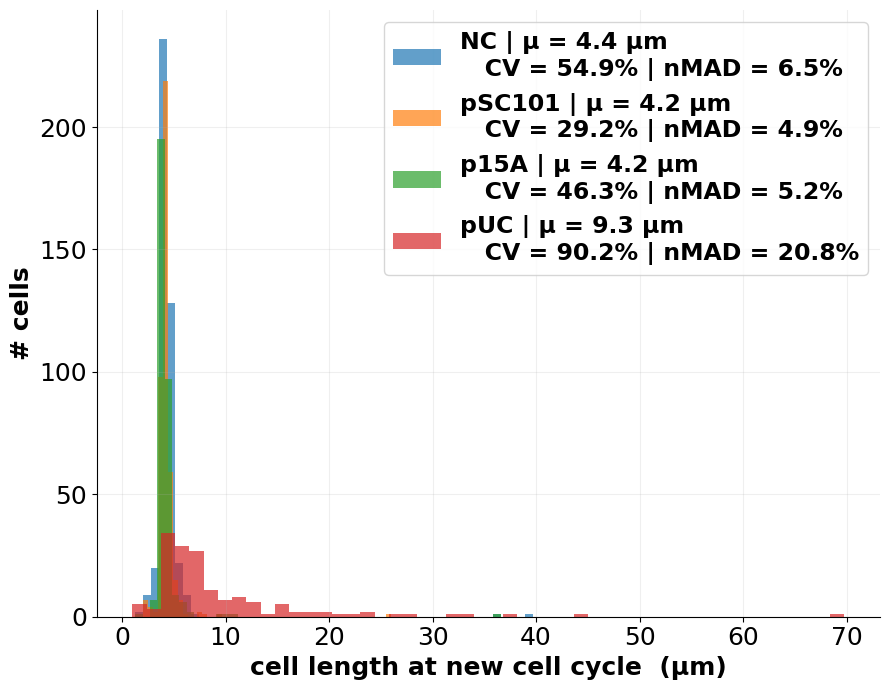

In [101]:


font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
sample_names = list(full_segm_info_df.sample_id.unique())
standard_mpl_colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']

fig = plt.figure(figsize=(9,7), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,1, figure=fig)
ax1 = fig.add_subplot(gs[0,0])
cltd_summary = [NC_summ_cell_lenght_total, pSC101_summ_cell_lenght_total, p15A_summ_cell_lenght_total, pUC_summ_cell_lenght_total ]

bin_list = [50, 50, 40, 20]
for sample_idx in range(4):
    # cell_length_CLDT = cltd_summary[sample_idx].tr_cl_mean
    # mode = scipy.stats.mode(cell_length_CLDT,nan_policy='omit')
    # mean = round(np.nanmean(cell_length_CLDT),1)
    # cv = scipy.stats.variation(cell_length_CLDT,nan_policy='omit')
    # MAD = scipy.stats.median_abs_deviation(cell_length_CLDT,nan_policy='omit')
    # nMAD = MAD / mean
    # ax1.hist(cell_length_CLDT, bins=50, label=f"{sample_names[sample_idx]} | µ = {mean} µm\n   CV = {round(cv*100,1)}% | nMAD = {round(nMAD*100,1)}% ", alpha=0.7,color=standard_mpl_colors[sample_idx])
    # # ax1.vlines(mode, 0, 180,alpha=0.8,color=standard_mpl_colors[sample_idx], linestyle='--')
    # print(f"µ = {round(mean,1)} | cv = {cv} | nMAD = {nMAD} | mode = {mode}")
    cell_length_CLDT = [np.nanmean(x) for x in complete_valleys_y_list[indices_for_samples[sample_idx][0]:indices_for_samples[sample_idx][-1]] ]
    mode = scipy.stats.mode(cell_length_CLDT)[0][0]
    mean = round(np.nanmean(cell_length_CLDT),1)
    cv = scipy.stats.variation(cell_length_CLDT,nan_policy='omit')
    MAD = scipy.stats.median_abs_deviation(cell_length_CLDT,nan_policy='omit')
    nMAD = MAD / mean
    ax1.hist(cell_length_CLDT, bins=50, label=f"{sample_names[sample_idx]} | µ = {mean} µm\n   CV = {round(cv*100,1)}% | nMAD = {round(nMAD*100,1)}%", alpha=0.7,color=standard_mpl_colors[sample_idx])
    # ax1.vlines(mode, 0, 180,alpha=0.8,color=standard_mpl_colors[sample_idx], linestyle='--')
    print(f"µ = {round(mean,1)} | mode = {mode}")
    
plt.yticks(fontsize=14)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_ylabel("# cells",fontsize=18, fontweight='bold')
ax1.set_xlabel("cell length at new cell cycle  (µm)",fontsize=18, fontweight='bold')
ax1.grid(True,alpha=0.2)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
# ax1.set_xlim(0,100)
plt.legend(prop={'size': 17,'weight':'bold'})
plt.savefig(f"CLNCC.png", dpi=300)
plt.show()

In [105]:
time_points = list(full_segm_info_df.timepoint.unique())

#### CL

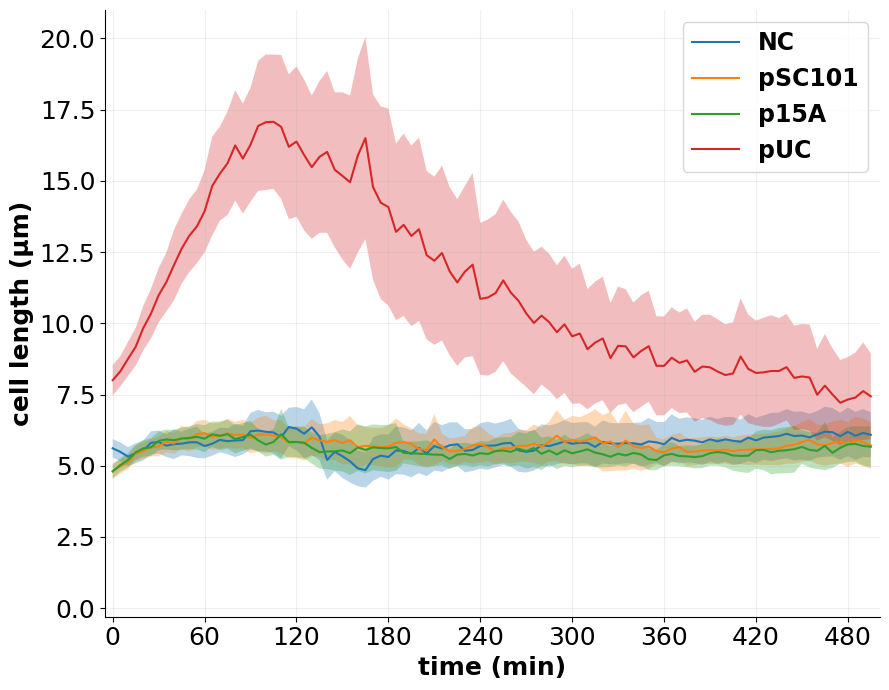

In [106]:
font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
sample_names = list(full_segm_info_df.sample_id.unique())
standard_mpl_colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']

fig = plt.figure(figsize=(9,7), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,1, figure=fig)
ax1 = fig.add_subplot(gs[0,0])
# for sample_idx in range(4):
#     cell_length_CLDT = cltd_summary[sample_idx].tr_cl_mean
#     mode = scipy.stats.mode(cell_length_CLDT,nan_policy='omit')
#     mean = round(np.nanmean(cell_length_CLDT),1)
#     cv = scipy.stats.variation(cell_length_CLDT,nan_policy='omit')
#     MAD = scipy.stats.median_abs_deviation(cell_length_CLDT,nan_policy='omit')
#     nMAD = MAD / mean
#     ax1.hist(cell_length_CLDT, bins=50, label=f"{sample_names[sample_idx]} | µ = {mean} µm\n   CV = {round(cv*100,1)}% | nMAD = {round(nMAD*100,1)}% ", alpha=0.7,color=standard_mpl_colors[sample_idx])
#     # ax1.vlines(mode, 0, 180,alpha=0.8,color=standard_mpl_colors[sample_idx], linestyle='--')
#     print(f"µ = {round(mean,1)} | cv = {cv} | nMAD = {nMAD} | mode = {mode}")
    # cell_length_CLDT = [np.nanmean(x) for x in complete_valleys_y_list[indices_for_samples[sample_idx][0]:indices_for_samples[sample_idx][-1]] ]
    # mode = scipy.stats.mode(cell_length_CLDT)[0][0]
    # mean = round(np.nanmean(cell_length_CLDT),1)
    # ax1.hist(cell_length_CLDT, bins=50, label=f"{sample_names[sample_idx]} | µ = {mean} µm", alpha=0.7,color=standard_mpl_colors[sample_idx])
    # # ax1.vlines(mode, 0, 180,alpha=0.8,color=standard_mpl_colors[sample_idx], linestyle='--')
    # print(f"µ = {round(mean,1)} | mode = {mode}")
cl_over_time_summ = {}
sample_x = 3
for x in range(4):
    sample_data = full_segm_info_df.loc[(full_segm_info_df.label==1) & (full_segm_info_df.sample_id==sample_names[x])]
    major_axis_mean_list = []
    major_axis_std_list = []
    
    for tp in sample_data.timepoint.unique():
        tp_data = sample_data.loc[sample_data.timepoint == tp]
        major_axis_std_list.append(tp_data.major_axis_length.std()*pixel_micron_conversion)
        major_axis_mean_list.append(tp_data.major_axis_length.mean()*pixel_micron_conversion)
    plt.plot(sample_data.timepoint.unique()*5, major_axis_mean_list, label=f"{sample_names[x]}")
    
    sem = 2 * ( np.array(major_axis_std_list) / np.sqrt( len(major_axis_mean_list) ) )
    y = np.array(major_axis_mean_list)
    plt.fill_between(np.array(time_points)*5, (y-sem), (y+sem), alpha=.3)
    
plt.yticks(fontsize=14)
ax1.spines['right'].set_visible(False)
ax1.set_xticks(current_x_ticks)
ax1.spines['top'].set_visible(False)
ax1.set_ylabel("cell length (µm)",fontsize=18, fontweight='bold')
ax1.set_xlabel("time (min)",fontsize=18, fontweight='bold')
ax1.grid(True,alpha=0.2)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
ax1.set_xlim(-5,501)
ax1.set_ylim(-0.3,21)
plt.legend(prop={'size': 17,'weight':'bold'})
plt.savefig(f"CL_sum_over_time.png", dpi=300)
plt.show()

In [107]:
sample_data = full_segm_info_df.loc[(full_segm_info_df.label==1) & (full_segm_info_df.sample_id=='pUC')]
sample_data_tr = [sample_data.trench.unique()[0], sample_data.trench.unique()[-1]]

In [108]:
sample_data_tr[0],sample_data_tr[-1]-1

(1176, 1332)

In [109]:
@interact
def show(tr=(sample_data_tr[0],sample_data_tr[-1]-1)):
    tr_data = sample_data.loc[sample_data.trench==tr]
    
    fig = plt.figure(figsize=(9,7), constrained_layout=True, tight_layout=True)
    gs = gridspec.GridSpec(1,1, figure=fig)
    ax1 = fig.add_subplot(gs[0,0])
    ax1.plot(tr_data.timepoint.unique(), tr_data.reporter_mean_intensity)
    ax2 = ax1.twinx()
    ax2.plot(tr_data.timepoint.unique(), tr_data.major_axis_length*pixel_micron_conversion,label=f"{tr}", color='grey')
    plt.legend()
    plt.show()
    plt.close()

interactive(children=(IntSlider(value=1254, description='tr', max=1332, min=1176), Output()), _dom_classes=('w…

In [107]:
sample_data.corr()

,label,area,centroid-0,centroid-1,reporter_mean_intensity,major_axis_length,minor_axis_length,solidity,segm_mean_intensity,trench,timepoint
label,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
area,NaN,1.000000,0.532916,-0.024290,0.150182,0.992140,0.305642,-0.543802,-0.014075,-0.049495,-0.205123
centroid-0,NaN,0.532916,1.000000,-0.034335,0.221803,0.510149,0.268127,-0.282093,0.040872,0.039545,-0.363079
centroid-1,NaN,-0.024290,-0.034335,1.000000,-0.003598,-0.025772,0.147458,-0.086318,0.056552,0.251963,0.038482
reporter_mean_intensity,NaN,0.150182,0.221803,-0.003598,1.000000,0.138738,0.130331,-0.070677,0.190523,0.024778,-0.136634
major_axis_length,NaN,0.992140,0.510149,-0.025772,0.138738,1.000000,0.254655,-0.567327,-0.004099,-0.065734,-0.187639
minor_axis_length,NaN,0.305642,0.268127,0.147458,0.130331,0.254655,1.000000,-0.501223,0.084286,-0.018422,-0.176295
solidity,NaN,-0.543802,-0.282093,-0.086318,-0.070677,-0.567327,-0.501223,1.000000,-0.025146,0.116600,0.112269
segm_mean_intensity,NaN,-0.014075,0.040872,0.056552,0.190523,-0.004099,0.084286,-0.025146,1.000000,-0.066161,0.113595
trench,NaN,-0.049495,0.039545,0.251963,0.024778,-0.065734,-0.018422,0.116600,-0.066161,1.000000,0.005074


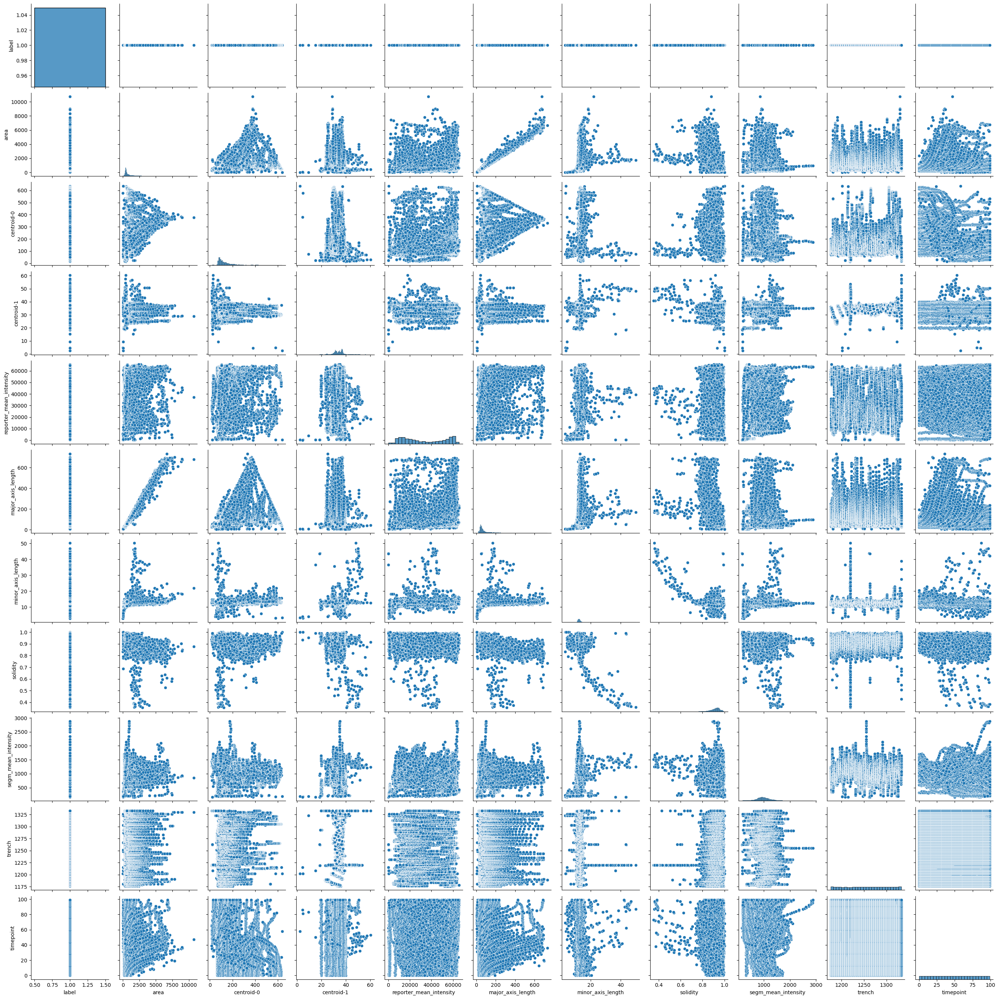

In [108]:
sns.pairplot(sample_data)
plt.show()

In [109]:
major_axis_mean_list[np.argmax(major_axis_mean_list)] / major_axis_mean_list[0] 

2.1333246621613013

In [110]:
full_segm_info_df

,label,area,centroid-0,centroid-1,reporter_mean_intensity,major_axis_length,minor_axis_length,solidity,segm_mean_intensity,trench,timepoint,sample_id
0,1,211,43.417062,37.516588,121.317536,23.206416,11.709028,0.950450,1135.407583,0,0,NC
1,2,464,75.648707,37.577586,127.409483,43.324657,13.798045,0.968685,865.366379,0,0,NC
2,3,454,115.286344,37.909692,126.676211,44.547927,13.339854,0.941909,920.451542,0,0,NC
3,4,606,162.457096,37.683168,127.810231,60.605113,13.152012,0.933744,966.978548,0,0,NC
4,5,504,212.206349,38.478175,127.414683,49.112526,13.265343,0.988235,960.027778,0,0,NC
...,...,...,...,...,...,...,...,...,...,...,...,...
1608692,45,519,583.539499,38.639692,27459.244701,53.403043,12.986482,0.890223,2238.838150,1333,99,pUC
1608693,46,537,606.798883,55.413408,23368.383613,44.847306,15.541753,0.937173,1611.903166,1333,99,pUC
1608694,47,415,607.684337,37.643373,26387.359036,44.366083,12.530916,0.879237,2095.455422,1333,99,pUC
1608695,48,660,622.815152,10.884848,16795.204545,59.066000,14.718375,0.937500,1513.519697,1333,99,pUC


0
  - Total mean = 0.84
  - Std = 0.32
  - Median = 0.8109070387467152
   - SEM = 0.02
   - # 433
1
  - Total mean = 0.83
  - Std = 0.3
  - Median = 0.77603829507343
   - SEM = 0.02
   - # 418
2
  - Total mean = 0.8
  - Std = 0.31
  - Median = 0.7553995167718152
   - SEM = 0.02
   - # 322
3
  - Total mean = 2.41
  - Std = 1.8
  - Median = 1.6626981339626454
   - SEM = 0.9
   - # 157


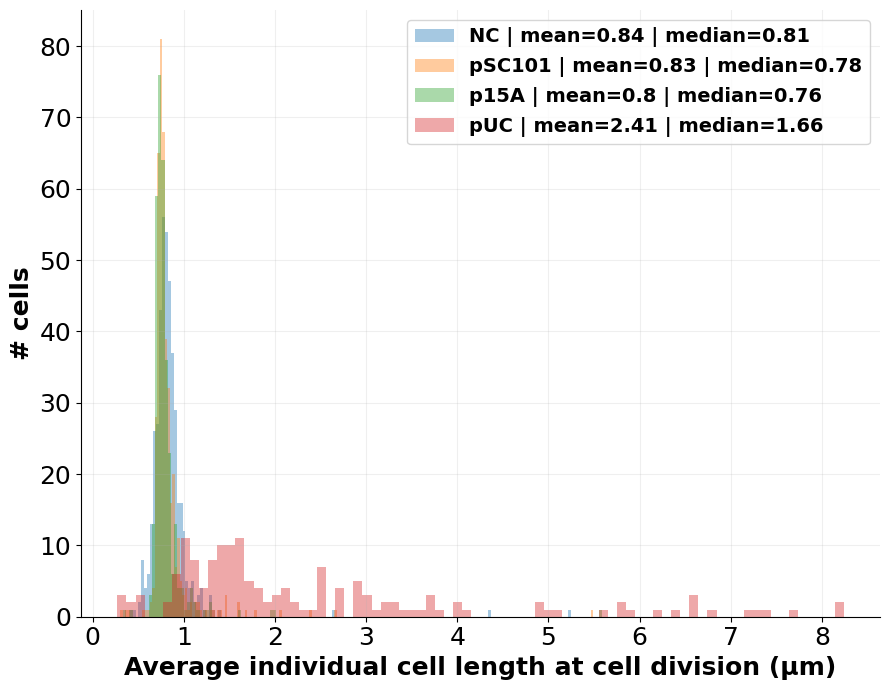

In [111]:
font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
sample_names = list(full_segm_info_df.sample_id.unique())
fig = plt.figure(figsize=(9,7), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,1, figure=fig)
ax1= fig.add_subplot(gs[0,0])

bin_list = [150, 190, 150, 80]
for idx in range(4):
    pixel_peaks_data = [np.mean(list(x)) for x in 
                          complete_peaks_y_list[indices_for_samples[idx][0]:indices_for_samples[idx][-1]]]
    micron_peaks_data = np.array(pixel_peaks_data) * pixel_micron_conversion
    plt.hist(micron_peaks_data,
            bins=bin_list[idx], label=f"{sample_names[idx]} | mean={round(np.nanmean(micron_peaks_data),2)} | median={round(np.nanmedian(micron_peaks_data),2)}", alpha=0.4)
    print(f"{idx}\n  - Total mean = {round(np.nanmean(micron_peaks_data),2)}\n  - Std = {round(np.nanstd(micron_peaks_data),2)}\n  - Median = {np.nanmedian(micron_peaks_data)}")
    print(f"   - SEM = {round(scipy.stats.sem(micron_peaks_data, nan_policy='omit', ddof=150) , 2)}\n   - # {len(micron_peaks_data)}")
plt.yticks(fontsize=14)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_ylabel("# cells",fontsize=18, fontweight='bold')
ax1.set_xlabel("Average individual cell length at cell division (µm)",fontsize=18, fontweight='bold')
ax1.grid(True,alpha=0.2)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
plt.legend(prop={'size': 14,'weight':'bold'})
#plt.savefig(f"reporter_confidence_intervals_STD.png", dpi=300)
plt.show()

In [112]:
@interact
def show(bin_s=(10,1_000)):
    for idx in range(4):
        pixel_peaks_data = list(chain.from_iterable( [list(x) for x in 
                              complete_peaks_y_list[indices_for_samples[idx][0]:indices_for_samples[idx][-1]]]))
        micron_peaks_data = np.array(pixel_peaks_data) * pixel_micron_conversion
        print(micron_peaks_data.mean(), micron_peaks_data.std(), np.median(micron_peaks_data))
        plt.hist(micron_peaks_data,
                bins=bin_s, label=f"{idx}", alpha=0.6)
    plt.legend()
    plt.show()

interactive(children=(IntSlider(value=505, description='bin_s', max=1000, min=10), Output()), _dom_classes=('w…

In [113]:
# Calculate all all_cell_doubling_times_per_sample

# Calculate the mean doubling time for each cell per sample
cell_doubling_times_means_list = []
for x in range(4):
    cell_doubling_times_means_list.append([np.mean(x) for x in cell_doubling_times_list[ indices_for_samples[x][0]:indices_for_samples[x][-1] ]])

0
  - #: 7653
 - Total mean = 25.056840454723638
  - Std = 8.22396763071424
  - Median = 25.0
1
  - #: 6851
 - Total mean = 26.42314990512334
  - Std = 8.297439943903766
  - Median = 25.0
2
  - #: 5021
 - Total mean = 27.62796255725951
  - Std = 9.422680182609005
  - Median = 25.0
3
  - #: 1210
 - Total mean = 34.82644628099174
  - Std = 19.895669068962214
  - Median = 30.0


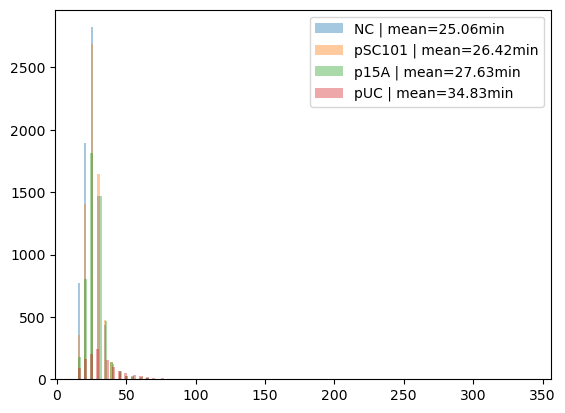

In [114]:
bin_list = [210, 150, 140, 90]
for idx in range(4):
    # Calculate all all_cell_doubling_times_per_sample
    all_cell_doubling_times_per_sample = np.array(list(chain.from_iterable(cell_doubling_times_list[ indices_for_samples[idx][0]:indices_for_samples[idx][-1] ])))
    doubling_times_data_arr = all_cell_doubling_times_per_sample*5 # np.array(cell_doubling_times_means_list[idx])*5
    plt.hist(doubling_times_data_arr,
            bins=bin_list[idx], label=f"{sample_names[idx]} | mean={round(np.nanmean(doubling_times_data_arr),2)}min", alpha=0.4)
    print(f"{idx}\n  - #: {len(doubling_times_data_arr)}\n - Total mean = {doubling_times_data_arr.mean()}\n  - Std = {doubling_times_data_arr.std()}\n  - Median = {np.median(doubling_times_data_arr)}")
plt.legend()
plt.show()

0
  - #: 433
 - Total mean = 25.65
  - Std = 8.166
  - Median = 25.0
1
  - #: 418
 - Total mean = 27.309
  - Std = 6.621
  - Median = 26.176470588235293
2
  - #: 322
 - Total mean = 28.708
  - Std = 11.277
  - Median = 27.1875
3
  - #: 157
 - Total mean = 40.106
  - Std = 19.759
  - Median = 33.75


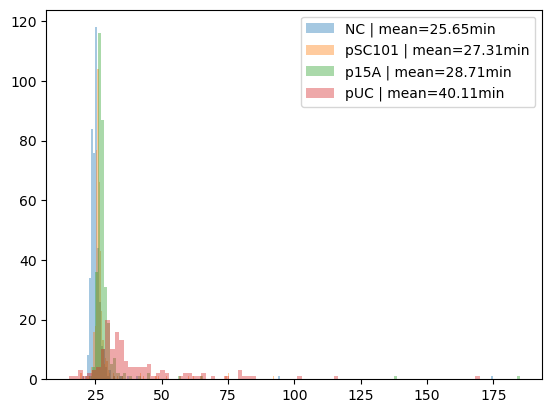

In [115]:
bin_list = [210, 150, 140, 90]
for idx in range(4):
    all_cell_doubling_times_per_sample = np.array(list(chain.from_iterable(cell_doubling_times_list[ indices_for_samples[idx][0]:indices_for_samples[idx][-1] ])))
    doubling_times_data_arr = np.array(cell_doubling_times_means_list[idx])*5
    plt.hist(doubling_times_data_arr,
            bins=bin_list[idx], label=f"{sample_names[idx]} | mean={round(np.nanmean(doubling_times_data_arr),2)}min", alpha=0.4)
    print(f"{idx}\n  - #: {len(doubling_times_data_arr)}\n - Total mean = {round(np.nanmean(doubling_times_data_arr),3)}\n  - Std = {round(np.nanstd(doubling_times_data_arr),3)}\n  - Median = {np.nanmedian(doubling_times_data_arr)}")
plt.legend()
plt.show()

#### Cell doubling time

0
  - #: 2165
 - Total mean = 5.13
  - Std = 1.633
  - Median = 5.0
1
  - #: 2090
 - Total mean = 5.462
  - Std = 1.324
  - Median = 5.235294117647059
2
  - #: 1610
 - Total mean = 5.742
  - Std = 2.255
  - Median = 5.4375
3
  - #: 785
 - Total mean = 8.021
  - Std = 3.952
  - Median = 6.75


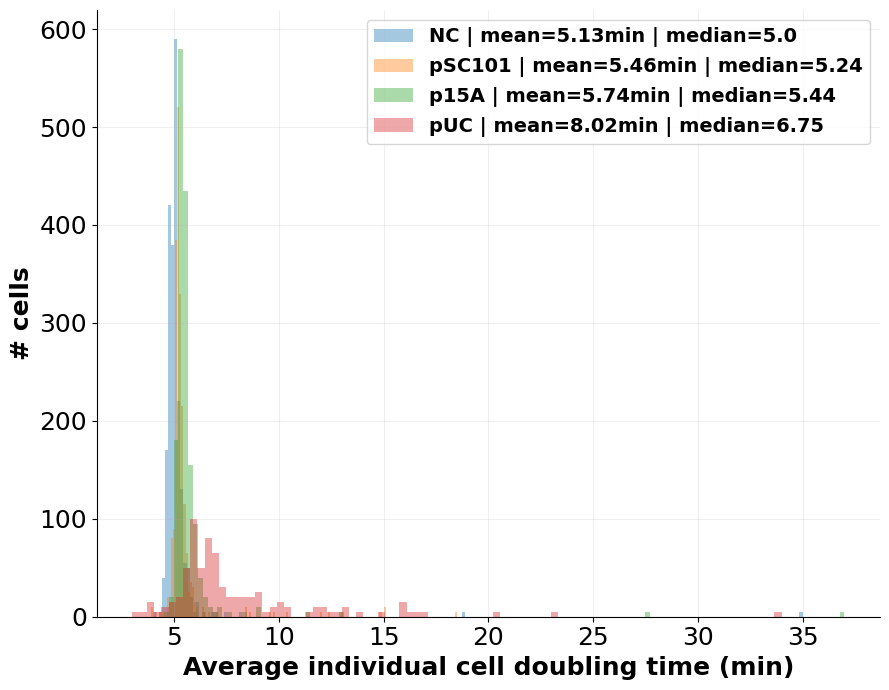

In [116]:
font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
sample_names = list(full_segm_info_df.sample_id.unique())
fig = plt.figure(figsize=(9,7), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,1, figure=fig)
ax1= fig.add_subplot(gs[0,0])

bin_list = [210, 150, 140, 90]
for idx in range(4):
    all_cell_doubling_times_per_sample = [np.mean(cell_dts) for cell_dts in cell_doubling_times_list[ indices_for_samples[idx][0]:indices_for_samples[idx][-1] ] ]
    doubling_times_data_arr = all_cell_doubling_times_per_sample*5
    plt.hist(doubling_times_data_arr,
            bins=bin_list[idx], label=f"{sample_names[idx]} | mean={round(np.nanmean(doubling_times_data_arr),2)}min | median={round(np.nanmedian(doubling_times_data_arr),2)}", alpha=0.4)
    print(f"{idx}\n  - #: {len(doubling_times_data_arr)}\n - Total mean = {round(np.nanmean(doubling_times_data_arr),3)}\n  - Std = {round(np.nanstd(doubling_times_data_arr),3)}\n  - Median = {np.nanmedian(doubling_times_data_arr)}")

plt.yticks(fontsize=14)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_ylabel("# cells",fontsize=18, fontweight='bold')
ax1.set_xlabel("Average individual cell doubling time (min)",fontsize=18, fontweight='bold')
ax1.grid(True,alpha=0.2)
# ax1.set_yticks(current_y_ticks, new_y_ticks)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
# ax1.set_ylim(-700, 58_100)
# ax1.set_xlim(-7, 500)
plt.legend(prop={'size': 14,'weight':'bold'})
# ax1.yaxis.set_major_formatter(formatter)
#plt.savefig(f"reporter_confidence_intervals_STD.png", dpi=300)
plt.show()

0
  - #: 433
 - Total mean = 25.65
  - Std = 8.166
  - Median = 25.0
1
  - #: 418
 - Total mean = 27.309
  - Std = 6.621
  - Median = 26.176470588235293
2
  - #: 322
 - Total mean = 28.708
  - Std = 11.277
  - Median = 27.1875
3
  - #: 157
 - Total mean = 40.106
  - Std = 19.759
  - Median = 33.75


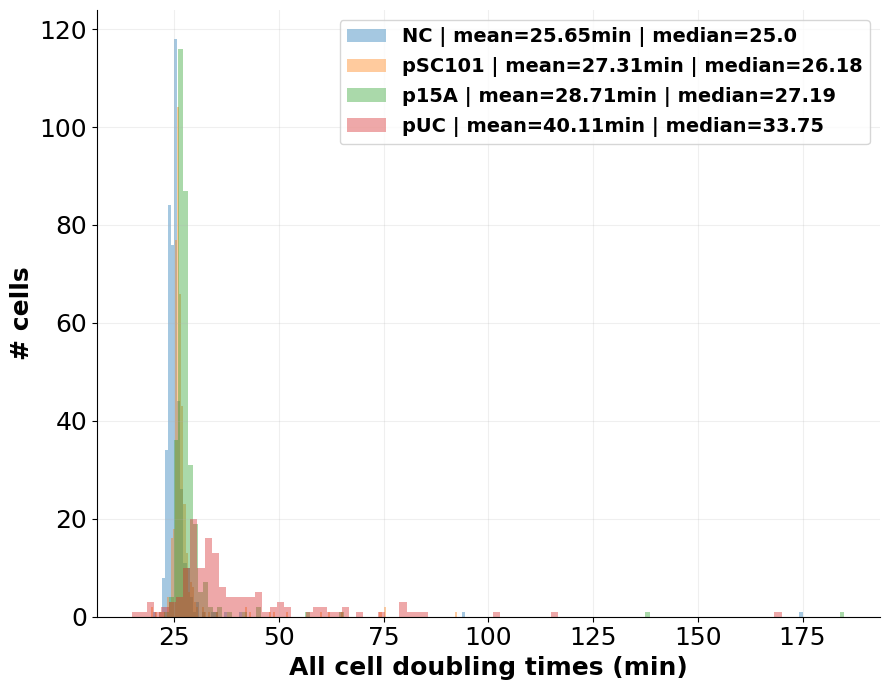

In [117]:
font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
sample_names = list(full_segm_info_df.sample_id.unique())
fig = plt.figure(figsize=(9,7), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,1, figure=fig)
ax1= fig.add_subplot(gs[0,0])

bin_list = [210, 150, 140, 90]
for idx in range(4):
    all_cell_doubling_times_per_sample = np.array(list(chain.from_iterable(cell_doubling_times_list[ indices_for_samples[idx][0]:indices_for_samples[idx][-1] ])))
    doubling_times_data_arr = np.array(cell_doubling_times_means_list[idx])*5
    plt.hist(doubling_times_data_arr,
            bins=bin_list[idx], label=f"{sample_names[idx]} | mean={round(np.nanmean(doubling_times_data_arr),2)}min | median={round(np.nanmedian(doubling_times_data_arr),2)}", alpha=0.4)
    print(f"{idx}\n  - #: {len(doubling_times_data_arr)}\n - Total mean = {round(np.nanmean(doubling_times_data_arr),3)}\n  - Std = {round(np.nanstd(doubling_times_data_arr),3)}\n  - Median = {np.nanmedian(doubling_times_data_arr)}")

plt.yticks(fontsize=14)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_ylabel("# cells",fontsize=18, fontweight='bold')
ax1.set_xlabel("All cell doubling times (min)",fontsize=18, fontweight='bold')
ax1.grid(True,alpha=0.2)
# ax1.set_yticks(current_y_ticks, new_y_ticks)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
# ax1.set_ylim(-700, 58_100)
# ax1.set_xlim(-7, 500)
plt.legend(prop={'size': 14,'weight':'bold'})
# ax1.yaxis.set_major_formatter(formatter)
#plt.savefig(f"reporter_confidence_intervals_STD.png", dpi=300)
plt.show()

In [118]:
major_axis_means_list = []
major_axis_std_list = []
for x in tqdm(range(0,4)):
    interim_mean = []
    interim_std = []
    for t in tqdm(range(0,100)):
        sample_chosen = list(full_segm_info_df.sample_id.unique())[x]
        data = full_segm_info_df.loc[
            (full_segm_info_df.sample_id == sample_chosen) &
            (full_segm_info_df.label == 1) &
            (full_segm_info_df.timepoint == t)
        ].major_axis_length * pixel_micron_conversion
        # \\print(f"Mean: {data.mean()}")
        # print(f"Std: {data.std()}")
        interim_mean.append(data.mean())
        interim_std.append(data.std())
    major_axis_means_list.append(interim_mean)
    major_axis_std_list.append(interim_std)

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

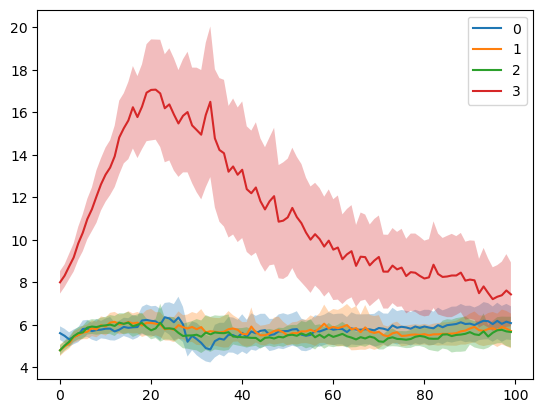

In [119]:
sample_x = 3
for x in range(4):
    time_points = list(range(len(major_axis_means_list[x])))
    plt.plot(time_points, major_axis_means_list[x], label=f"{x}")
    
    ci = 2 * ( np.array(major_axis_std_list[x]) / np.sqrt( len(major_axis_means_list[x]) ) )
    y = np.array(major_axis_means_list[x])
    plt.fill_between(np.array(time_points), (y-ci), (y+ci), alpha=.3)
plt.legend()

## 2: Cell intensity graph

In [110]:
reporter_means_list = []
reporter_std_list = []
for x in tqdm(range(0,4)):
    interim_mean = []
    interim_std = []
    for t in tqdm(range(0,100)):
        sample_chosen = list(full_segm_info_df.sample_id.unique())[x]
        data = full_segm_info_df.loc[
            (full_segm_info_df.sample_id == sample_chosen) &
            (full_segm_info_df.label == 1) &
            (full_segm_info_df.timepoint == t)
        ].reporter_mean_intensity
        # print(f"Mean: {data.mean()}")
        # print(f"Std: {data.std()}")
        interim_mean.append(data.mean())
        interim_std.append(data.std())
    reporter_means_list.append(interim_mean)
    reporter_std_list.append(interim_std)

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

### Confidence Intervals (STD)

In [111]:
current_x_ticks = np.arange(0, 600, 60)
new_x_ticks = np.arange(0, 541, 60)
current_y_ticks = np.arange(0, 60_100, 10000)
new_y_ticks = [round(x,0) for x in np.arange(0, 6.1, 1)]

In [112]:
from matplotlib.ticker import FuncFormatter

def tens_thousands(x, pos):
    'The two args are the value and tick position'
    return '%1.f' % (round(x,0) * 1e-4)


formatter = FuncFormatter(tens_thousands)

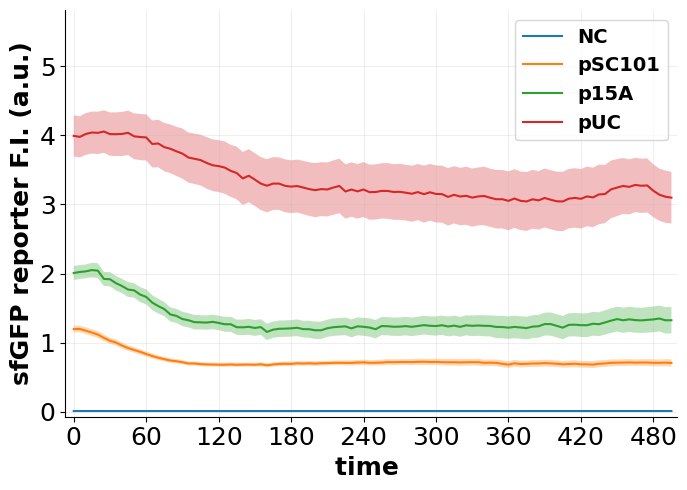

In [113]:
font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
sample_names = list(full_segm_info_df.sample_id.unique())
fig = plt.figure(figsize=(7,5), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,1, figure=fig)
ax1= fig.add_subplot(gs[0,0])

for x in range(4):
    time_points = np.array(range(len(reporter_means_list[x]))) * 5
    plt.plot(time_points, reporter_means_list[x], label=f"{sample_names[x]}")
    # confidence interval
    ci = 2 * ( np.array(reporter_std_list[x]) / np.sqrt( len(reporter_means_list[x]) ) )
    y = np.array(reporter_means_list[x])
    plt.fill_between(np.array(time_points), (y-ci), (y+ci), alpha=.3)

plt.yticks(fontsize=14)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_ylabel("sfGFP reporter F.I. (a.u.)",fontsize=18, fontweight='bold')
ax1.set_xlabel("time ",fontsize=18, fontweight='bold')
ax1.grid(True,alpha=0.2)
ax1.set_xticks(new_x_ticks)
# ax1.set_yticks(current_y_ticks, new_y_ticks)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
ax1.set_ylim(-700, 58_100)
ax1.set_xlim(-7, 500)
plt.legend(prop={'size': 14,'weight':'bold'})
ax1.yaxis.set_major_formatter(formatter)
#plt.savefig(f"reporter_confidence_intervals_STD.png", dpi=300)
plt.show()

### Data distribution (SEM)

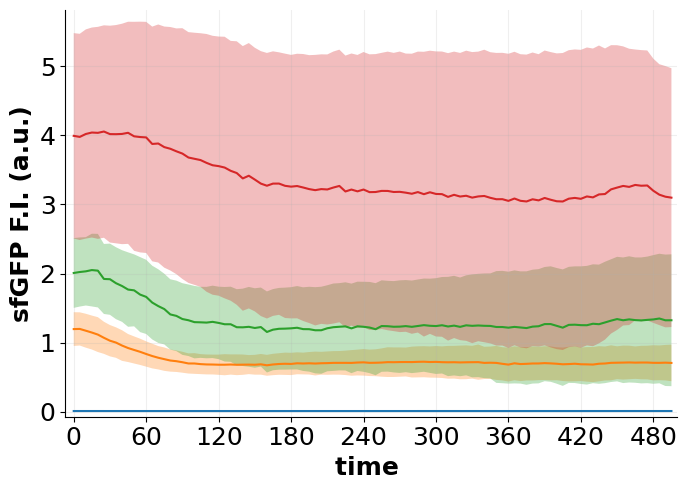

In [114]:
font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
sample_names = list(full_segm_info_df.sample_id.unique())
fig = plt.figure(figsize=(7,5), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,1, figure=fig)
ax1= fig.add_subplot(gs[0,0])

for x in range(4):
    time_points = np.array(range(len(reporter_means_list[x]))) * 5
    plt.plot(time_points, reporter_means_list[x], label=f"{sample_names[x]}")
    # confidence interval
    ci = np.array(reporter_std_list[x])
    y = np.array(reporter_means_list[x])
    plt.fill_between(np.array(time_points), (y-ci), (y+ci), alpha=.3)

plt.yticks(fontsize=14)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_ylabel("sfGFP F.I. (a.u.)",fontsize=18, fontweight='bold')
ax1.set_xlabel("time ",fontsize=18, fontweight='bold')
ax1.set_xticks(new_x_ticks)
ax1.grid(True,alpha=0.2)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
ax1.set_ylim(-700, 58_100)
ax1.set_xlim(-7, 500)
# plt.legend(prop={'size': 14,'weight':'bold'})
ax1.yaxis.set_major_formatter(formatter)
#plt.savefig(f"reporter_confidence_intervals_STD.png", dpi=300)
plt.show()

#### Splitting pUC into its to groups using kmeans()

In [115]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [116]:
data_pUC = full_segm_info_df.loc[
        (full_segm_info_df.sample_id == 'pUC') &
        (full_segm_info_df.label == 1) &
    (full_segm_info_df.timepoint==49)
]
data_pUC_all = full_segm_info_df.loc[
        (full_segm_info_df.sample_id == 'pUC') &
        (full_segm_info_df.label == 1)
]
data_pUC

,label,area,centroid-0,centroid-1,reporter_mean_intensity,major_axis_length,minor_axis_length,solidity,segm_mean_intensity,trench,timepoint,sample_id
1502178,1,433,105.106236,34.577367,52200.773672,47.206683,11.959558,0.935205,768.450346,1176,49,pUC
1502837,1,848,102.852594,33.469340,9056.621462,88.928280,12.799699,0.899258,887.432783,1177,49,pUC
1503808,1,1532,136.364230,34.038512,64460.698433,155.856683,13.487819,0.853007,416.851175,1178,49,pUC
1504409,1,386,81.992228,32.772021,55100.090674,40.907925,12.705891,0.901869,991.012953,1179,49,pUC
1505393,1,634,90.635647,32.080442,25824.052050,66.649235,13.318431,0.861413,1761.541009,1180,49,pUC
...,...,...,...,...,...,...,...,...,...,...,...,...
1602809,1,662,100.521148,31.490937,21984.682779,71.049558,12.239310,0.915629,1314.839879,1329,49,pUC
1603304,1,441,87.299320,30.387755,52101.428571,45.042024,13.183961,0.905544,989.761905,1330,49,pUC
1603776,1,438,82.333333,38.609589,43446.616438,50.216029,11.447584,0.929936,904.744292,1331,49,pUC
1604640,1,420,79.642857,38.059524,45595.021429,48.695342,11.315371,0.935412,1063.295238,1332,49,pUC


In [117]:
kmeans = KMeans(
    init= np.array([[0,],
                    [66_000],
                   ]), #"random",
    n_clusters=2,
    n_init=1,
    max_iter=300,
    algorithm = 'auto' #elkan
)

category_summary = []
for tp in tqdm(data_pUC.timepoint.unique()):
    # X = np.array(data_pUC.loc[data_pUC.timepoint==tp].reporter_mean_intensity).reshape(-1, 1) 
    X = np.array(data_pUC.reporter_mean_intensity).reshape(-1, 1) 
    ## Feature Scaling
    sc_dfa = StandardScaler()
    dfa_std = sc_dfa.fit_transform(X.astype(float))
    category_summary.append(kmeans.fit_predict(X))
category_summary = np.array(category_summary)
data_pUC['pUC_group'] = list(chain.from_iterable(category_summary))

  0%|          | 0/1 [00:00<?, ?it/s]

In [118]:
l_zero = data_pUC.loc[data_pUC.pUC_group == 0].trench.unique()

def check(digit, list_l):
    if digit in list_l:
        return 0
    else:
        return 1
    
data_pUC_all['pUC_group'] = data_pUC_all.trench.apply(lambda x: check(x, l_zero))


In [119]:
data_pUC_all.loc[data_pUC_all.pUC_group == 0].reporter_mean_intensity#.mean()

1502465    35792.069527
1502474    33729.345794
1502482    29784.803526
1502489    34205.988751
1502496    30547.290123
               ...     
1608453    47984.000000
1608501    48421.423875
1608549    45517.316865
1608598    46586.642123
1608648    42338.268908
Name: reporter_mean_intensity, Length: 8993, dtype: float64

In [120]:
data_pUC_all.loc[data_pUC_all.pUC_group == 1].reporter_mean_intensity#.mean()

1501927    57084.071878
1501934    56712.663644
1501940    55619.463722
1501945    57184.863706
1501950    55835.698153
               ...     
1605066    55411.610435
1605075    54543.103270
1605084    53315.471304
1605093    53886.817556
1605102    51255.465430
Name: reporter_mean_intensity, Length: 6618, dtype: float64

In [121]:
full_segm_info_df.loc[(full_segm_info_df.label==1) & (full_segm_info_df.sample_id=='p15A')].reporter_mean_intensity

1081358    15344.610294
1081365    15371.310658
1081372    16017.327083
1081379    17842.155172
1081386    16620.274611
               ...     
1501848     9221.914894
1501863    10124.689427
1501877     9646.795918
1501891     9778.455975
1501909     9465.553672
Name: reporter_mean_intensity, Length: 32233, dtype: float64

In [122]:
len(clustering_results_ir0_kmeans)

NameError: name 'clustering_results_ir0_kmeans' is not defined

In [123]:
data_pUC_all.loc[data_pUC_all.pUC_group == 0]

,label,area,centroid-0,centroid-1,reporter_mean_intensity,major_axis_length,minor_axis_length,solidity,segm_mean_intensity,trench,timepoint,sample_id,pUC_group
1502465,1,676,95.471893,33.634615,35792.069527,72.811735,12.362171,0.920981,962.417160,1177,0,pUC,0
1502474,1,749,99.295060,34.017356,33729.345794,79.898797,12.554265,0.878077,911.957276,1177,1,pUC,0
1502482,1,794,101.479849,33.717884,29784.803526,86.376551,12.347115,0.906393,862.950882,1177,2,pUC,0
1502489,1,889,102.430821,34.274466,34205.988751,94.839754,12.505821,0.909928,903.400450,1177,3,pUC,0
1502496,1,972,108.011317,34.173868,30547.290123,103.412718,12.723356,0.878049,868.581276,1177,4,pUC,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1608453,1,578,50.714533,19.839100,47984.000000,55.832702,13.565487,0.932258,1466.818339,1333,95,pUC,0
1608501,1,578,50.972318,19.823529,48421.423875,56.306397,13.439067,0.947541,1518.340830,1333,96,pUC,0
1608549,1,587,51.199319,19.858603,45517.316865,56.457347,13.654319,0.937700,1562.003407,1333,97,pUC,0
1608598,1,584,51.181507,19.804795,46586.642123,56.387108,13.530825,0.954248,1625.789384,1333,98,pUC,0


In [124]:
data_pUC_all.loc[(data_pUC_all.pUC_group == 1)& 
                                                           (data_pUC_all.pUC_group == 5)]

,label,area,centroid-0,centroid-1,reporter_mean_intensity,major_axis_length,minor_axis_length,solidity,segm_mean_intensity,trench,timepoint,sample_id,pUC_group


In [125]:
pUC_zero_group_means, pUC_one_group_means = [], []
pUC_zero_group_sem, pUC_one_group_sem = [], []

for tp in data_pUC_all.loc[data_pUC_all.pUC_group == 0].timepoint.unique():
    pUC_zero_group_means.append(np.nanmean(data_pUC_all.loc[(data_pUC_all.pUC_group == 0)&
                                                            (data_pUC_all.timepoint == tp)].reporter_mean_intensity))
    pUC_one_group_means.append(np.nanmean(data_pUC_all.loc[(data_pUC_all.pUC_group == 1)& 
                                                           (data_pUC_all.timepoint == tp)].reporter_mean_intensity))
    pUC_zero_group_sem.append(scipy.stats.sem(data_pUC_all.loc[(data_pUC_all.pUC_group == 0)&
                                                            (data_pUC_all.timepoint == tp)].reporter_mean_intensity))
    pUC_one_group_sem.append(scipy.stats.sem(data_pUC_all.loc[(data_pUC_all.pUC_group == 1)&
                                                            (data_pUC_all.timepoint == tp)].reporter_mean_intensity))

### MAD & nMAD

In [126]:
for idx in range(4):
    print(f"{sample_names[idx]}")
    data_current = full_segm_info_df.loc[
            (full_segm_info_df.sample_id == sample_names[idx]) &
            (full_segm_info_df.label == 1)# &
            #(full_segm_info_df.timepoint > 20)
    ]
all_replicates_per_tr_means_list 

NC
pSC101
p15A
pUC


NameError: name 'all_replicates_per_tr_means_list' is not defined

In [127]:
example_cells_dict['low_CV'].append(5)

NameError: name 'example_cells_dict' is not defined

  0%|          | 0/4 [00:00<?, ?it/s]

NC
2 -> current_normalised_SC_medianAD < 0.0038
7 -> current_normalised_SC_medianAD < 0.0038
22 -> current_normalised_SC_medianAD < 0.0038
32 -> current_normalised_SC_medianAD < 0.0038
290 -> current_normalised_SC_medianAD < 0.0038
389 -> current_normalised_SC_medianAD < 0.0038
426 -> current_normalised_SC_medianAD < 0.0038
    SC_means=122.9642, SC_std=1.3406, SC_CV=1.092, SC_MAD=1.0695, normalised_SC_MAD=0.0087, current_SEM=0.1306


NameError: name 'current_SEM' is not defined

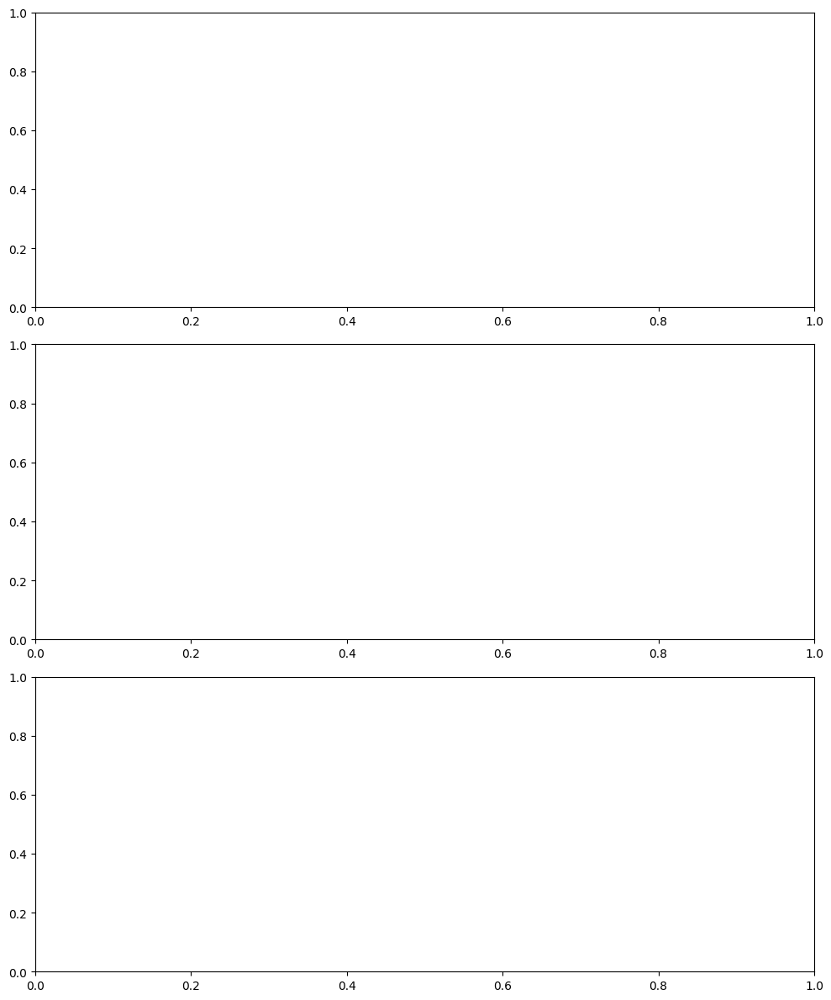

In [128]:
"""NEW ANALYSIS
"""
font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
sample_names = list(full_segm_info_df.sample_id.unique())
fig = plt.figure(figsize=(10,12), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(3,1, figure=fig)
ax1= fig.add_subplot(gs[0,0])
ax2= fig.add_subplot(gs[1,0])
ax3= fig.add_subplot(gs[2,0])
standard_mpl_colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
time_points = list(range(100))
summary_dict = {}
# scipy.stats.median_abs_deviation()
idx = 3
sf = 4
example_cells_dict = {'low_nMAD' : [], 'high_nMAD' : []}

SC_means_per_sample, SC_std_per_sample, SC_CV_per_sample, SC_MAD_per_sample, normalised_SC_MAD_per_sample, SC_SEM_per_sample = [], [], [], [], [], []
for idx in tqdm(range(4)):
    print(f"{sample_names[idx]}")
    data_current = full_segm_info_df.loc[
            (full_segm_info_df.sample_id == sample_names[idx]) &
            (full_segm_info_df.label == 1)# &
            #(full_segm_info_df.timepoint > 20)
    ]
    # SC (t)
    SC_means, SC_std, SC_CV, SC_MAD, normalised_SC_MAD, SC_SEM = [], [], [], [], [], []
    for tr in data_current.trench.unique():
        current_SC_data = data_current.loc[data_current.trench == tr]
        # Calculate features
        current_SC_mean = current_SC_data.reporter_mean_intensity.mean()
        current_SC_std = current_SC_data.reporter_mean_intensity.std()
        current_CV = current_SC_std / current_SC_mean * 100
        current_SC_MAD = mad(current_SC_data.reporter_mean_intensity)
        current_normalised_SC_MAD = current_SC_MAD / current_SC_mean
        current_SC_medianAD = scipy.stats.median_abs_deviation(current_SC_data.reporter_mean_intensity)
        current_normalised_SC_medianAD = current_SC_medianAD / current_SC_mean
        if current_normalised_SC_medianAD < 0.0038:
            print(f"{tr} -> current_normalised_SC_medianAD < 0.0038")
            example_cells_dict['low_nMAD'].append(tr)
        if current_normalised_SC_medianAD > 0.5:
            print(f"{tr} -> current_normalised_SC_medianAD > 0.5")
            example_cells_dict['high_nMAD'].append(tr)
        current_SC_SEM = scipy.stats.sem(current_SC_data.reporter_mean_intensity, nan_policy='omit')
        # Save features of current SC
        [SC_means.append(current_SC_mean), SC_std.append(current_SC_std), SC_CV.append(current_CV), SC_MAD.append(current_SC_MAD), 
         normalised_SC_MAD.append(current_normalised_SC_MAD), SC_SEM.append(current_SC_SEM)]
    # Save all SC features for current sample
    [SC_means_per_sample.append(SC_means), SC_std_per_sample.append(SC_std), SC_CV_per_sample.append(SC_MAD), 
     SC_MAD_per_sample.append(SC_MAD), normalised_SC_MAD_per_sample.append(SC_MAD), SC_SEM_per_sample.append(SC_SEM) ]
    print(f"    SC_means={round(np.nanmean(SC_means),sf)}, SC_std={round(np.nanmean(SC_std),sf)}, SC_CV={round(np.nanmean(SC_CV),sf)}, SC_MAD={round(np.nanmean(SC_MAD),sf)}, normalised_SC_MAD={round(np.nanmean(normalised_SC_MAD),sf)}, current_SEM={round(current_SC_SEM,sf)}")
    summary_dict[f"SC_{sample_names[idx]}"] =  {'mean' : round(np.nanmean(SC_means),sf), 
                           'std' : round(np.nanmean(SC_std),sf),
                           'CV' : round(np.nanmean(SC_CV),sf),
                           'MAD' : round(np.nanmean(SC_MAD),sf),
                           'normalised_MAD' :  round(np.nanmean(normalised_SC_MAD),sf),
                            'normalised_medianAD' : round(current_normalised_SC_medianAD,sf),
                           'current_SEM' : round(current_SEM,sf)
                                                    }

    # P (t=tp89/445min)
    tp445_P_data = data_current.loc[data_current.timepoint == 89]
    # Calculate features
    tp445_P_mean = tp445_P_data.reporter_mean_intensity.mean()
    tp445_P_std = tp445_P_data.reporter_mean_intensity.std()
    tp445_CV = tp445_P_std / tp445_P_mean * 100
    tp445_P_MAD = mad(tp445_P_data.reporter_mean_intensity)
    tp445_normalised_P_MAD = tp445_P_MAD / tp445_P_mean
    tp445_P_medianAD = scipy.stats.median_abs_deviation(tp445_P_data.reporter_mean_intensity)
    tp445_normalised_P_medianAD = tp445_P_medianAD / tp445_P_mean
    p445_SEM = scipy.stats.sem(tp445_P_data.reporter_mean_intensity, nan_policy='omit')
    print(f"    tp445_P_mean={round(np.nanmean(tp445_P_mean),sf)}, tp445_P_std={round(np.nanmean(tp445_P_std),sf)}, tp445_CV={round(np.nanmean(tp445_CV),sf)}, tp445_P_MAD={round(np.nanmean(tp445_P_MAD),sf)}, tp445_normalised_P_MAD={round(np.nanmean(tp445_normalised_P_MAD),sf)}")
    summary_dict[f"tp455_{sample_names[idx]}"] = {'mean' : round(np.nanmean(tp445_P_mean),sf), 
                                    'std' : round(np.nanmean(tp445_P_std),sf),
                                    'CV' : round(np.nanmean(tp445_CV),sf),
                                    'MAD' : round(np.nanmean(tp445_P_MAD),sf),
                                    'normalised_MAD' :  round(np.nanmean(tp445_normalised_P_MAD),sf),
                                    'normalised_medianAD' : round(tp445_normalised_P_medianAD,sf),
                                    'current_SEM' : round(p445_SEM,sf)
                                                }
    # GM (t)
    GM_P_data = data_current#.loc[data_current.timepoint == 89]
    # Calculate features
    GM_P_mean = data_current.reporter_mean_intensity.mean()
    GM_P_std = data_current.reporter_mean_intensity.std()
    GM_CV = GM_P_std / GM_P_mean * 100
    GM_P_MAD = mad(data_current.reporter_mean_intensity)
    GM_normalised_P_MAD = GM_P_MAD / GM_P_mean
    GP_P_medianAD = scipy.stats.median_abs_deviation(GM_P_data.reporter_mean_intensity)
    GP_normalised_P_medianAD = GP_P_medianAD / GM_P_mean
    GP_SEM = scipy.stats.sem(GM_P_data.reporter_mean_intensity, nan_policy='omit')
    print(f"    GM_P_mean={round(np.nanmean(GM_P_mean),sf)}, GM_P_std={round(np.nanmean(GM_P_std),sf)}, tp445_CV={round(np.nanmean(GM_CV),sf)}, tp445_P_MAD={round(np.nanmean(GM_P_MAD),sf)}, tp445_normalised_P_MAD={round(np.nanmean(GM_normalised_P_MAD),sf)}, GP_SEM={round(GP_SEM,sf)}\n")
    summary_dict[f"GM_{sample_names[idx]}"] = {'mean' : round(np.nanmean(GM_P_mean),sf), 
                                    'std' : round(np.nanmean(GM_P_std),sf),
                                    'CV' : round(np.nanmean(GM_CV),sf),
                                    'MAD' : round(np.nanmean(GM_P_MAD),sf),
                                    'normalised_MAD' :  round(np.nanmean(GM_normalised_P_MAD),sf),
                                               'normalised_medianAD' : round(GP_normalised_P_medianAD,sf),
                                    'current_SEM' : round(GP_SEM,sf)
                                                }
summary_stats = pd.DataFrame(summary_dict)

ax1.hlines(current_SC_mean, 0,500, label=f"{sample_names[idx]} SC_means")

plt.yticks(fontsize=14)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_ylabel("sfGFP F.I. (a.u.)",fontsize=18, fontweight='bold')
ax1.set_xlabel("time (min)",fontsize=18, fontweight='bold')
ax1.set_xticks(new_x_ticks)
ax1.grid(True,alpha=0.2)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
# ax1.set_ylim(-700, 58_100)
# ax1.set_xlim(-7, 500)
ax1.legend(prop={'size': 14,'weight':'bold'})
    
len(SC_means)

In [ ]:
summary_stats

### PCDP
population variation contribution to data dispersion 

In [129]:
[x for x in summary_stats.columns if 'SC' in x]

NameError: name 'summary_stats' is not defined

In [ ]:
normalised_medianAD_SC = np.array(summary_stats.loc['normalised_medianAD'][[x for x in summary_stats.columns if 'SC_' in x]]*100)
normalised_medianAD_GM = np.array(summary_stats.loc['normalised_medianAD'][[x for x in summary_stats.columns if 'GM' in x]]*100)

In [ ]:
summary_stats.loc['normalised_medianAD'][[x for x in summary_stats.columns if 'SC_' in x]]*100

In [ ]:
summary_stats.loc['normalised_medianAD'][[x for x in summary_stats.columns if 'GM' in x]]*100

In [ ]:
(14.36 - 8.73) / 14.36

PCDP

In [ ]:
(normalised_medianAD_GM - normalised_medianAD_SC) / normalised_medianAD_GM

 individual cell variation contribution to data dispersion (ICCDP) 

In [ ]:
1- (normalised_medianAD_GM - normalised_medianAD_SC) / normalised_medianAD_GM

In [ ]:
# Define the list of strings to be sorted
strings_list = list(summary_stats.columns)#['giraffe', 'tiger', 'elephant', 'zebra', 'snake']
print(strings_list)
# Define the order of sorting as a list
order_list = ['s', 't', 'g']

# Define a function to use as the sorting key
def custom_key(string):
    # Get the index of the first character in the order_list
    # If the character is not in the order_list, set its index to len(order_list)
    # This ensures that strings with characters not in the order_list are sorted to the end
    index = order_list.index(string[0]) if string[0] in order_list else len(order_list)
    return (index, string)
# Sort the list of strings using the custom_key function
sorted_list = sorted(sorted(strings_list), key=custom_key)
# Print the sorted list of strings
print(sorted_list)

In [ ]:
summary_stats = summary_stats.reindex(['SC_NC', 'SC_pSC101', 'SC_p15A', 'SC_pUC', 'GM_NC','GM_pSC101',  'GM_p15A', 'GM_pUC'], axis=1)#.iloc[:,4:]
summary_stats #'tp455_NC', 'tp455_pSC101', 'tp455_p15A', 'tp455_pUC',

samples = np.array(range(len(summary_stats.columns)))
sample_names = list(summary_stats.columns)

width = 0.25       # the width of the bars: can also be len(x) sequence
fig, ax = plt.subplots(figsize=(17,6))
ax.bar(samples, np.array(summary_stats.loc['CV']), width, label='CV', color='royalblue')
ax.bar(samples+width, np.array(summary_stats.loc['normalised_MAD'])*100, width, label='nAAG', color='gold')
ax.bar(samples+2*width, np.array(summary_stats.loc['normalised_medianAD'])*100, width, label='nMAD', color='purple')
# sns.barplot(data=summary_stats.T, x=summary_stats.index, y='normalised_medianAD')

ax.set_ylabel('variation (%)')
# ax.set_title('Trench Loading Efficiency by Plasmid\n',size=13)
# ax.set_xticks(x, samples)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.grid(True,alpha=0.2)
ax.set_xticks(samples + width)
ax.set_xticklabels(sample_names)

lgd = ax.legend(bbox_to_anchor=(1.03, 1.0))
#plt.savefig(f"trench_loading_efficiency.pdf",bbox_extra_artists=(lgd,), bbox_inches='tight')
plt.show()

In [550]:
1_000_000 / 30

33333.333333333336

In [551]:
384/3

128.0

In [ ]:
summary_stats.loc['mean'].plot()

In [ ]:
pd.DataFrame(summary_dict)

cell_died
  Grand mean = nan
  SC Mean : nan
  TP89/445min Mean : nan
  averaged_SC_MAD : nan
  averaged_pop_MAD : nan
cell_lost
  Grand mean = nan
  SC Mean : nan
  TP89/445min Mean : nan
  averaged_SC_MAD : nan
  averaged_pop_MAD : nan
empty_trench
  Grand mean = nan
  SC Mean : nan
  TP89/445min Mean : nan
  averaged_SC_MAD : nan
  averaged_pop_MAD : nan
cell_survived
  Grand mean = nan
  SC Mean : nan
  TP89/445min Mean : nan
  averaged_SC_MAD : nan
  averaged_pop_MAD : nan


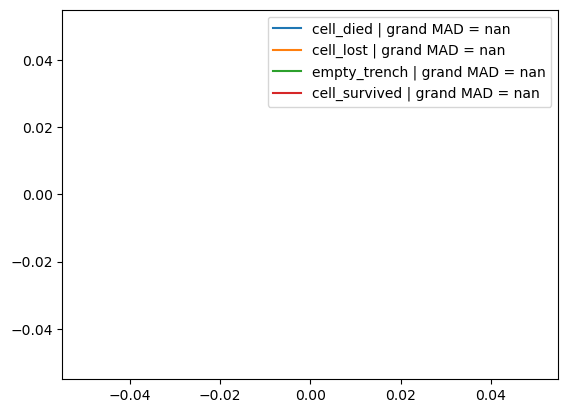

In [517]:


# scipy.stats.median_abs_deviation()
idx = 3

MAD_per_sample = []
for idx in range(4):
    print(f"{sample_names[idx]}")
    data_current = full_segm_info_df.loc[
            (full_segm_info_df.sample_id == sample_names[idx]) &
            (full_segm_info_df.label == 1)# &
            #(full_segm_info_df.timepoint > 20)
    ]
    print(f"  Grand mean = {round(np.nanmean(data_current.reporter_mean_intensity),4)}")
    grand_mean = np.nanmean(data_current.reporter_mean_intensity)
    
    # Iterate through every timepoint to assess population at each tp
    all_replicates_per_tp_list = []
    for tp in data_current.timepoint.unique():
        new_tp_data = data_current.loc[data_current.timepoint == tp]
        all_replicates_per_tp_list.append( mad(new_tp_data.reporter_mean_intensity) )
    # Iterate through every cell to assess all cells
    all_replicates_per_tr_means_list = []
    for tr in data_current.trench.unique():
        new_tr_data = data_current.loc[data_current.trench == tr]
        all_replicates_per_tr_means_list.append( np.nanmean(new_tr_data.reporter_mean_intensity) )
    # only select TP89 / 445min
    tp_445_data = data_current.loc[data_current.timepoint == 89]
    print(f"  SC Mean : {round(np.nanmean(all_replicates_per_tr_means_list),4)}")
    print(f"  TP89/445min Mean : {round(np.nanmean(tp_445_data.reporter_mean_intensity),4)}")
    normalised_SC_MADs = np.array(all_replicates_per_tp_list)/grand_mean
    normalised_pop_MADs = mad(data_current.reporter_mean_intensity) / data_current.reporter_mean_intensity#.mean()
    print(f"  averaged_SC_MAD : {round(np.nanmean(normalised_SC_MADs),4)}")
    print(f"  averaged_pop_MAD : {round(np.nanmean(normalised_pop_MADs),4)}")
    plt.plot(list(range(len(all_replicates_per_tp_list))), normalised_SC_MADs, label=f"{sample_names[idx]} | grand MAD = {round(np.nanmean(normalised_SC_MADs),4)}")
    MAD_per_sample.append(np.array(all_replicates_per_tp_list)/grand_mean)
plt.legend()
plt.show()

In [ ]:
445/5

In [ ]:
# scipy.stats.median_abs_deviation()
idx = 3

MAD_per_sample = []
for idx in range(4):
    print(f"{sample_names[idx]}")
    data_current = full_segm_info_df.loc[
            (full_segm_info_df.sample_id == sample_names[idx]) &
            (full_segm_info_df.label == 1)# &
            #(full_segm_info_df.timepoint > 20)
    ]
    print(f"  Mean = {np.nanmean(data_current.reporter_mean_intensity)}")
    grand_mean = np.nanmean(data_current.reporter_mean_intensity)
    all_replicates_per_tp_list = []
    for tp in data_current.timepoint.unique():
        new_tp_data = data_current.loc[data_current.timepoint == tp]
        all_replicates_per_tp_list.append( scipy.stats.median_abs_deviation(new_tp_data.reporter_mean_intensity) )
    normalised_MADs = np.array(all_replicates_per_tp_list)/grand_mean
    averaged_MAD = np.nanmean(all_replicates_per_tp_list)/grand_mean
    print(f"  averaged_MAD : {averaged_MAD}")
    plt.plot(list(range(len(all_replicates_per_tp_list))), normalised_MADs, label=f"{sample_names[idx]} | grand MAD = {round(np.nanmean(normalised_MADs),4)}")
    MAD_per_sample.append(np.array(all_replicates_per_tp_list)/grand_mean)
plt.legend()
plt.show()

### Stupid T test

In [ ]:
list(data_pUC_all.loc[(data_pUC_all.pUC_group==1) & (data_pUC_all.timepoint==0)].reporter_mean_intensity)

In [ ]:

# Generate two random samples
n_pUC_zero = len(data_pUC_all.loc[data_pUC_all.pUC_group==0].trench.unique())
n_samples2 = len(data_pUC_all.loc[data_pUC_all.pUC_group==1].trench.unique())

p_summary = []
for tp in data_pUC_all.timepoint.unique():
    population_zero = list(data_pUC_all.loc[(data_pUC_all.pUC_group==0) & (data_pUC_all.timepoint==tp)].reporter_mean_intensity)
    population_one = list(data_pUC_all.loc[(data_pUC_all.pUC_group==1) & (data_pUC_all.timepoint==tp)].reporter_mean_intensity)
    t_stat, p_value = ttest_ind(population_zero, population_one)
    p_summary.append(p_value)
plt.plot(list(range(len(p_summary))),p_summary)

In [ ]:
np.mean(p_summary)

### Granger causality test

In [ ]:
from statsmodels.tsa.stattools import grangercausalitytests

In [ ]:
pSC101_mean = []
p15A_means = []

for tp in full_segm_info_df.timepoint.unique():
    pSC101_mean.append(full_segm_info_df.loc[(full_segm_info_df.label==1) & (full_segm_info_df.timepoint==tp) & (full_segm_info_df.sample_id=='pSC101')].reporter_mean_intensity.mean())
    p15A_means.append(full_segm_info_df.loc[(full_segm_info_df.label==1) & (full_segm_info_df.timepoint==tp) & (full_segm_info_df.sample_id=='p15A')].reporter_mean_intensity.mean())

In [ ]:
len(p15A_means)

In [ ]:
df_pUC_zero_vs_one = pd.DataFrame([pUC_zero_group_means, pUC_one_group_means]).T
df_pUC_zero_vs_one
df_pUC_zero_vs_p15A = pd.DataFrame([pUC_zero_group_means, p15A_means]).T
df_pUC_zero_vs_p15A
df_pUC_zero_vs_pSC101 = pd.DataFrame([pUC_zero_group_means, pSC101_mean]).T
df_pUC_zero_vs_pSC101
df_pSC101_vs_p15A = pd.DataFrame([pSC101_mean, p15A_means]).T
df_pSC101_vs_p15A

In [ ]:
#perform Granger-Causality test
grangercausalitytests(df_pUC_zero_vs_one[[0,1]], maxlag=[3])

In [ ]:
#perform Granger-Causality test
grangercausalitytests(df_pUC_zero_vs_p15A[[0,1]], maxlag=[3])

In [ ]:
#perform Granger-Causality test
grangercausalitytests(df_pUC_zero_vs_p15A[[1,0]], maxlag=[3])

In [ ]:
#perform Granger-Causality test
grangercausalitytests(df_pSC101_vs_p15A[[0,1]], maxlag=[3])

In [ ]:
#perform Granger-Causality test


In [ ]:
grangercausalitytests(df_pUC_pSC101_vs_p15A[[0,1]], maxlag=[3]) 

In [ ]:
pUC_zero_group_means, pUC_one_group_means = [], []
pUC_zero_group_sem, pUC_one_group_sem = [], []

for tp in data_pUC_all.loc[data_pUC_all.pUC_group == 0].timepoint.unique():
    pUC_zero_group_means.append(np.nanmean(data_pUC_all.loc[(data_pUC_all.pUC_group == 0)&
                                                            (data_pUC_all.timepoint == tp)].reporter_mean_intensity))
    pUC_one_group_means.append(np.nanmean(data_pUC_all.loc[(data_pUC_all.pUC_group == 1)& 
                                                           (data_pUC_all.timepoint == tp)].reporter_mean_intensity))
    pUC_zero_group_sem.append(scipy.stats.sem(data_pUC_all.loc[(data_pUC_all.pUC_group == 0)&
                                                            (data_pUC_all.timepoint == tp)].reporter_mean_intensity))
    pUC_one_group_sem.append(scipy.stats.sem(data_pUC_all.loc[(data_pUC_all.pUC_group == 1)&
                                                            (data_pUC_all.timepoint == tp)].reporter_mean_intensity))

In [ ]:
from scipy.stats import ttest_ind

# Generate two random samples
n_samples1 = 50
n_samples2 = 60
sample1 = np.random.normal(loc=0, scale=1, size=n_samples1)
sample2 = np.random.normal(loc=1, scale=1, size=n_samples2)

# Compute the t-statistic and p-value using the two-sample t-test
t_stat, p_value = ttest_ind(sample1, sample2)

# Print the t-statistic and p-value
print(f"t-statistic: {t_stat}")
print(f"p-value: {p_value}")


#### SEM vs STD graph

In [ ]:
len(MAD_per_sample)

In [ ]:
font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
sample_names = list(full_segm_info_df.sample_id.unique())
fig = plt.figure(figsize=(14,6), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,2, figure=fig)
ax1= fig.add_subplot(gs[0,0])
standard_mpl_colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']

for x in range(4):
    time_points = np.array(range(len(reporter_means_list[x]))) * 5
    plt.plot(time_points, reporter_means_list[x], label=f"{sample_names[x]}")
    # confidence interval
    ci = np.array(reporter_std_list[x])
    y = np.array(reporter_means_list[x])
    plt.fill_between(np.array(time_points), (y-ci), (y+ci), alpha=.3, color=standard_mpl_colors[x])
    MAD_interval = y * MAD_per_sample[x]
    # plt.fill_between(np.array(time_points), (y-MAD_interval), (y+MAD_interval), alpha=.3, color=standard_mpl_colors[x])
    

plt.yticks(fontsize=14)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_ylabel("sfGFP F.I. (a.u.)",fontsize=18, fontweight='bold')
ax1.set_xlabel("time (min)",fontsize=18, fontweight='bold')
ax1.set_xticks(new_x_ticks)
ax1.grid(True,alpha=0.2)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
ax1.set_ylim(-700, 58_100)
ax1.set_xlim(-7, 500)
# plt.legend(prop={'size': 14,'weight':'bold'})
ax1.yaxis.set_major_formatter(formatter)




ax1.plot(time_points, pUC_zero_group_means, color='purple', alpha=0.4)
ax1.plot(time_points, pUC_one_group_means, color='purple', alpha=0.4)

ax2= fig.add_subplot(gs[0,1])

for x in range(4):
    time_points = np.array(range(len(reporter_means_list[x]))) * 5
    plt.plot(time_points, reporter_means_list[x], label=f"{sample_names[x]} | grand mean = {round(np.mean(reporter_means_list[x]),2)}")
    # confidence interval
    ci = 2 * ( np.array(reporter_std_list[x]) / np.sqrt( len(reporter_means_list[x]) ) )
    y = np.array(reporter_means_list[x])
    plt.fill_between(np.array(time_points), (y-ci), (y+ci), alpha=.3)


plt.yticks(fontsize=14)
ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
# ax2.set_ylabel("sfGFP F.I. (a.u.)",fontsize=18, fontweight='bold')
ax2.set_xlabel("time (min)",fontsize=18, fontweight='bold')
ax2.set_xticks(new_x_ticks)
ax2.grid(True,alpha=0.2)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
ax2.set_ylim(-700, 58_100)
ax2.set_xlim(-7, 500)
plt.legend(prop={'size': 14,'weight':'bold'})
ax2.yaxis.set_major_formatter(formatter)
# plt.savefig(f"sfGFP_grand_mean_STDvsSEM.png", dpi=300)
plt.show()

In [137]:
20/pixel_micron_conversion

183.1334126911455

#### Shapiro norm test

In [133]:
shapiro_pvalues_over_time = []
shapiro_stat_over_time = []

for sample_idx in range(4):
    sample_shapiro_p_values_over_time = []
    sample_shapiro_stat_over_time = []
    data_per_sample = full_segm_info_df.loc[
        (full_segm_info_df.sample_id == sample_names[sample_idx]) &
        (full_segm_info_df.label == 1)]
    for tp in data_per_sample.timepoint.unique():
        data_per_sample_per_tp = data_per_sample.loc[data_per_sample.timepoint == tp]
        stat, p = scipy.stats.shapiro(np.array(data_per_sample_per_tp.reporter_mean_intensity))
        sample_shapiro_p_values_over_time.append(p)
        sample_shapiro_stat_over_time.append(stat)
    shapiro_pvalues_over_time.append(sample_shapiro_p_values_over_time)
    shapiro_stat_over_time.append(sample_shapiro_stat_over_time)

0: p = 6.607428534724357e-08  | stat = 0.9563204163312912
1: p = 8.569426300345151e-13  | stat = 0.7468177253007888
2: p = 8.172596852629448e-11  | stat = 0.5504716438055038
3: p = 2.529268693629398e-07  | stat = 0.8870289254188538


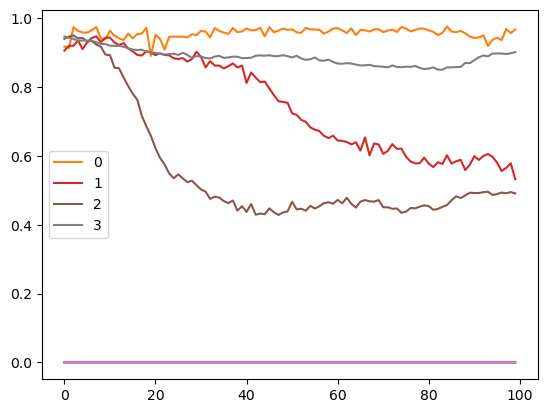

In [134]:
for x in range(4):
    print(f"{x}: p = {np.mean(shapiro_pvalues_over_time[x])}  | stat = {np.mean(shapiro_stat_over_time[x])}")
    plt.plot(list(range(len(shapiro_pvalues_over_time[x]))), shapiro_pvalues_over_time[x])
    plt.plot(list(range(len(shapiro_stat_over_time[x]))), shapiro_stat_over_time[x], label=f"{x}")
    #plt.ylim(-0.01, 0.05)
plt.legend()
plt.show()

#### Kolmogorov-Smirnov norm test

In [ ]:
kstest_pvalues_over_time = []
kstest_stat_over_time = []

for sample_idx in range(4):
    sample_kstest_p_values_over_time = []
    sample_kstest_stat_over_time = []
    data_per_sample = full_segm_info_df.loc[
        (full_segm_info_df.sample_id == sample_names[sample_idx]) &
        (full_segm_info_df.label == 1)]
    for tp in data_per_sample.timepoint.unique():
        data_per_sample_per_tp = np.array(data_per_sample.loc[data_per_sample.timepoint == tp].reporter_mean_intensity)
        # Calculate mean and standard deviation of the data
        mu, std = scipy.stats.norm.fit(data)
        # Perform Kolmogorov-Smirnov test for normality
        stat, p = scipy.stats.kstest(data_per_sample_per_tp, 'norm', args=(mu, std))
        sample_kstest_p_values_over_time.append(p)
        sample_kstest_stat_over_time.append(stat)
    kstest_pvalues_over_time.append(sample_kstest_p_values_over_time)
    kstest_stat_over_time.append(sample_kstest_stat_over_time)

In [ ]:
for x in range(4):
    print(f"{x}: {np.mean(kstest_pvalues_over_time[x])}")
    plt.plot(list(range(len(kstest_pvalues_over_time[x]))), kstest_pvalues_over_time[x])
    plt.plot(list(range(len(kstest_stat_over_time[x]))), kstest_stat_over_time[x], label=f"{x}")
    #plt.ylim(-0.01, 0.05)
plt.legend()
plt.show()

#### Anderson-Darling norm test

In [ ]:
anderson_pvalues_over_time = []
# anderson_stat_over_time = []

for sample_idx in range(4):
    sample_anderson_p_values_over_time = []
    # sample_anderson_stat_over_time = []
    data_per_sample = full_segm_info_df.loc[
        (full_segm_info_df.sample_id == sample_names[sample_idx]) &
        (full_segm_info_df.label == 1)]
    for tp in data_per_sample.timepoint.unique():
        data_per_sample_per_tp = np.array(data_per_sample.loc[data_per_sample.timepoint == tp].reporter_mean_intensity)
        # Perform Anderson-Darling test for normality
        p = scipy.stats.anderson(data_per_sample_per_tp, dist='norm').critical_values
        sample_anderson_p_values_over_time.append(p)
        # sample_anderson_stat_over_time.append(stat)
    anderson_pvalues_over_time.append(sample_anderson_p_values_over_time)
    # anderson_stat_over_time.append(sample_anderson_stat_over_time)

In [ ]:
for x in range(4):
    print(f"{x}: {np.mean(anderson_pvalues_over_time[x])}")
    plt.plot(list(range(len(anderson_pvalues_over_time[x]))), anderson_pvalues_over_time[x])
    #plt.plot(list(range(len(kstest_stat_over_time[x]))), kstest_stat_over_time[x], label=f"{x}")
    #plt.ylim(-0.01, 0.05)
plt.legend()
plt.show()

### THE FI 4x graph

0 0
n=434
CV = 3.090839076447298 | mean_u = 122.96704848044578 | std_ = 3.800713585587512
0 1
n=419
CV = 32.3643455929022 | mean_u = 7490.512483130847 | std_ = 2424.2553467199473
1 0
n=323
CV = 54.11984851341434 | mean_u = 13455.522479832722 | std_ = 7282.108382773881
1 1
n=158
CV = 58.41352960449346 | mean_u = 33593.68379397915 | std_ = 19623.256428235934


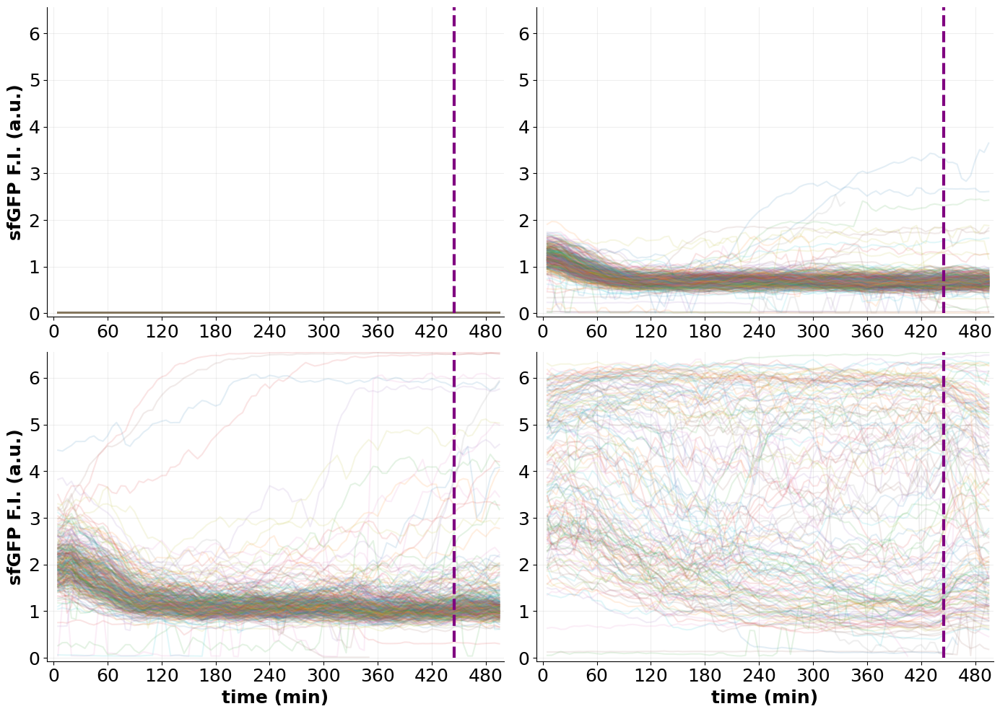

In [130]:
font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
sample_names = list(full_segm_info_df.sample_id.unique())
fig = plt.figure(figsize=(14,10), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(2,2, figure=fig)


for sample_idx in range(4):
    column = 0
    row = 0
    if any([sample_idx == 1, sample_idx == 3]):
        column = 1
    if sample_idx > 1:
        row = 1
    print(row,column)
    ax1= fig.add_subplot(gs[row,column])
    data_per_sample = full_segm_info_df.loc[
        (full_segm_info_df.sample_id == sample_names[sample_idx]) &
        (full_segm_info_df.label == 1)
    ] 
    for trench_x in data_per_sample.trench.unique():
        tr_data = data_per_sample.loc[data_per_sample.trench == trench_x]
        plt.plot(tr_data['timepoint']*5, tr_data['reporter_mean_intensity'].rolling(2).mean(), alpha = 0.12)
    print(f"n={len(data_per_sample.trench.unique())}")
    # for x in range(4):
    #     time_points = np.array(range(len(reporter_means_list[x]))) * 5
    #     plt.plot(time_points, reporter_means_list[x], label=f"{sample_names[x]}")
    #     # confidence interval
    #     ci = np.array(reporter_std_list[x])
    #     y = np.array(reporter_means_list[x])
    #     plt.fill_between(np.array(time_points), (y-ci), (y+ci), alpha=.3)
    ax1.vlines(445, 0, 66_000, color='purple', linestyle='--', linewidth=3)
    plt.yticks(fontsize=14)
    ax1.spines['right'].set_visible(False)
    ax1.spines['top'].set_visible(False)
    if any([sample_idx == 0, sample_idx == 2]):
        ax1.set_ylabel("sfGFP F.I. (a.u.)",fontsize=18, fontweight='bold')
    if any([sample_idx == 2, sample_idx == 3]):
        ax1.set_xlabel("time (min)",fontsize=18, fontweight='bold')
    ax1.set_xticks(new_x_ticks)
    ax1.grid(True,alpha=0.2)
    plt.yticks(fontsize=18)
    plt.xticks(fontsize=18)
    ax1.set_ylim(-700, 65_600)
    ax1.set_xlim(-7, 500)
    # plt.legend(prop={'size': 14,'weight':'bold'})
    ax1.yaxis.set_major_formatter(formatter)
    mean_u = np.mean(data_per_sample.reporter_mean_intensity)
    std_ =  np.std(data_per_sample.reporter_mean_intensity, ddof=1)
    cv = std_ / mean_u * 100
    print(f"CV = {cv} | mean_u = {mean_u} | std_ = {std_}")
# plt.savefig(f"sfGFP_SC_expression_per_sample.png", dpi=300)
plt.show()

688


  0%|          | 0/100 [00:00<?, ?it/s]

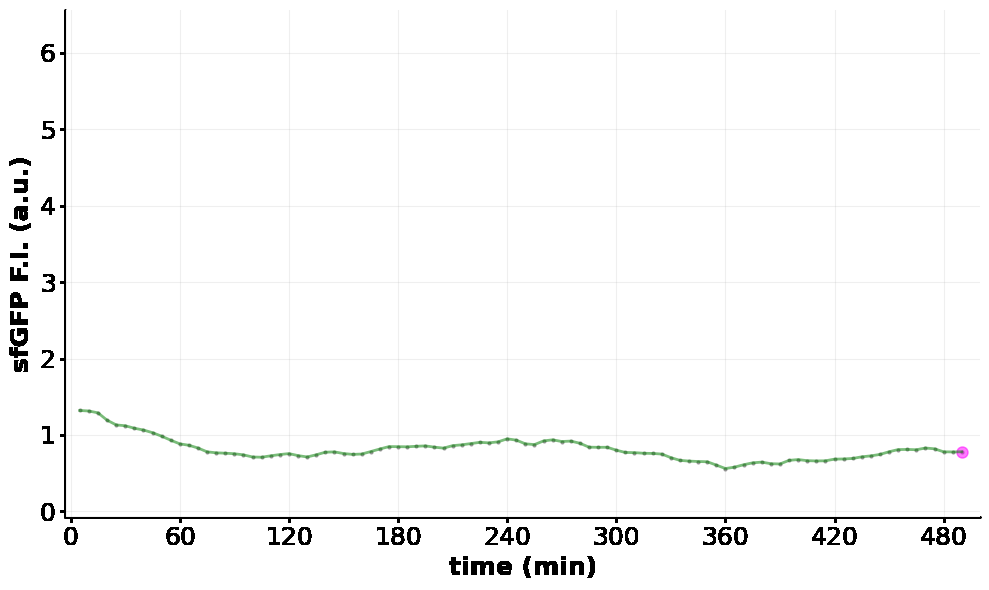

CPU times: user 7min 14s, sys: 4.21 s, total: 7min 18s
Wall time: 4min 26s


In [210]:
%%time
font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}

fig = plt.figure(figsize=(10,6), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,1, figure=fig)

x_translation = 6 * 49
x_range = [0+x_translation, 42+x_translation] #[int(x + 10*y_conversion_factor) for x in y_range_set]
current_data = data_array[57][x_range[0]:x_range[-1]]

for sample_idx in range(1,2):
    data_per_sample = full_segm_info_df.loc[
        (full_segm_info_df.sample_id == sample_names[sample_idx]) &
        (full_segm_info_df.label == 1)
    ] 
    for trench_x in data_per_sample.trench.unique()[254:255]:
        print(trench_x)
        tr_data = data_per_sample.loc[data_per_sample.trench == trench_x]
        tp_data = list(tr_data['timepoint']*5)
        fi_data = tr_data['reporter_mean_intensity'].rolling(2).mean()
        for tp in tqdm(range(100)):
            ax1 = fig.add_subplot(gs[0,0])
            plt.plot(tp_data[:tp], fi_data[:tp], 'o', markersize=2, alpha = 0.72, linewidth=1, color="grey")
            plt.plot(tp_data[tp-1:tp], fi_data[tp-1:tp], 'o', markersize=8, alpha = 0.52, linewidth=1, color="magenta")
            plt.plot(tp_data[:tp], fi_data[:tp], alpha = 0.52, linewidth=2, color="green")
        
            ax1.yaxis.set_major_formatter(formatter)  
            plt.yticks(fontsize=14)
            ax1.spines['right'].set_visible(False)
            ax1.spines['top'].set_visible(False)
            ax1.set_ylabel("sfGFP F.I. (a.u.)",fontsize=18, fontweight='bold')
            ax1.set_xlabel("time (min)",fontsize=18, fontweight='bold')
            ax1.grid(True,alpha=0.2)
            plt.yticks(fontsize=18)
            plt.xticks(fontsize=18)
            ax1.set_xticks(new_x_ticks)
            ax1.set_ylim(-700, 65_600)
            ax1.set_xlim(-3, 500)
            plt.savefig(f"FI_data/FI_{sample_idx}_tr{str(trench_x).zfill(4)}_tp{str(tp).zfill(3)}.png", dpi=300)
  # print(f"n={len(data_per_sample.trench.unique())}")
# plt.legend(prop={'size': 17,'weight':'bold'})
# plt.savefig(f"7th_trench_backwater.png", dpi=300)
plt.show()

In [196]:
data_per_sample#['reporter_mean_intensity'].rolling(2).mean()

,label,area,centroid-0,centroid-1,reporter_mean_intensity,major_axis_length,minor_axis_length,solidity,segm_mean_intensity,trench,timepoint,sample_id
531406,1,443,231.404063,40.758465,10324.072235,43.110618,13.351855,0.942553,993.270880,434,0,pSC101
531416,1,486,228.323045,40.738683,9225.551440,45.850437,13.760884,0.958580,966.000000,434,1,pSC101
531427,1,514,227.661479,40.673152,10860.492218,50.243057,13.337835,0.943119,1043.309339,434,2,pSC101
531439,1,591,210.769882,40.602369,10325.001692,57.664102,13.439425,0.947115,1019.856176,434,3,pSC101
531451,1,645,230.330233,40.581395,10032.348837,64.286226,13.216299,0.936139,997.955039,434,4,pSC101
...,...,...,...,...,...,...,...,...,...,...,...,...
1081281,1,503,83.723658,28.262425,6475.626243,50.922587,12.745632,0.965451,699.095427,852,95,pSC101
1081295,1,549,106.967213,28.183971,6981.111111,55.913610,12.955936,0.922689,738.550091,852,96,pSC101
1081311,1,621,147.268921,28.143317,6256.628019,64.528679,12.948066,0.910557,693.426731,852,97,pSC101
1081327,1,339,100.132743,28.176991,5685.681416,36.757196,11.907522,0.976945,663.513274,852,98,pSC101


In [200]:
data_per_sample.trench.unique()

array([434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446,
       447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459,
       460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 472,
       473, 474, 475, 476, 477, 478, 479, 480, 481, 482, 483, 484, 485,
       486, 487, 488, 489, 490, 491, 492, 493, 494, 495, 496, 497, 498,
       499, 500, 501, 502, 503, 504, 505, 506, 507, 508, 509, 510, 511,
       512, 513, 514, 515, 516, 517, 518, 519, 520, 521, 522, 523, 524,
       525, 526, 527, 528, 529, 530, 531, 532, 533, 534, 535, 536, 537,
       538, 539, 540, 541, 542, 543, 544, 545, 546, 547, 548, 549, 550,
       551, 552, 553, 554, 555, 556, 557, 558, 559, 560, 561, 562, 563,
       564, 565, 566, 567, 568, 569, 570, 571, 572, 573, 574, 575, 576,
       577, 578, 579, 580, 581, 582, 583, 584, 585, 586, 587, 588, 589,
       590, 591, 592, 593, 594, 595, 596, 597, 598, 599, 600, 601, 602,
       603, 604, 605, 606, 607, 608, 609, 610, 611, 612, 613, 61

In [205]:
data_per_sample.loc[data_per_sample.trench == 254]

,label,area,centroid-0,centroid-1,reporter_mean_intensity,major_axis_length,minor_axis_length,solidity,segm_mean_intensity,trench,timepoint,sample_id


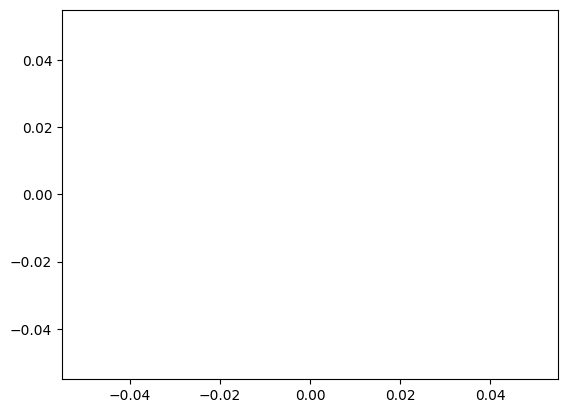

In [204]:
plt.plot(data_per_sample.loc[data_per_sample.trench == 254]['timepoint']*5, 
                 data_per_sample.loc[data_per_sample.trench == 254]['reporter_mean_intensity'].rolling(2).mean(), 
                 alpha = 0.27, linewidth=2, color="green")

  0%|          | 0/100 [00:00<?, ?it/s]

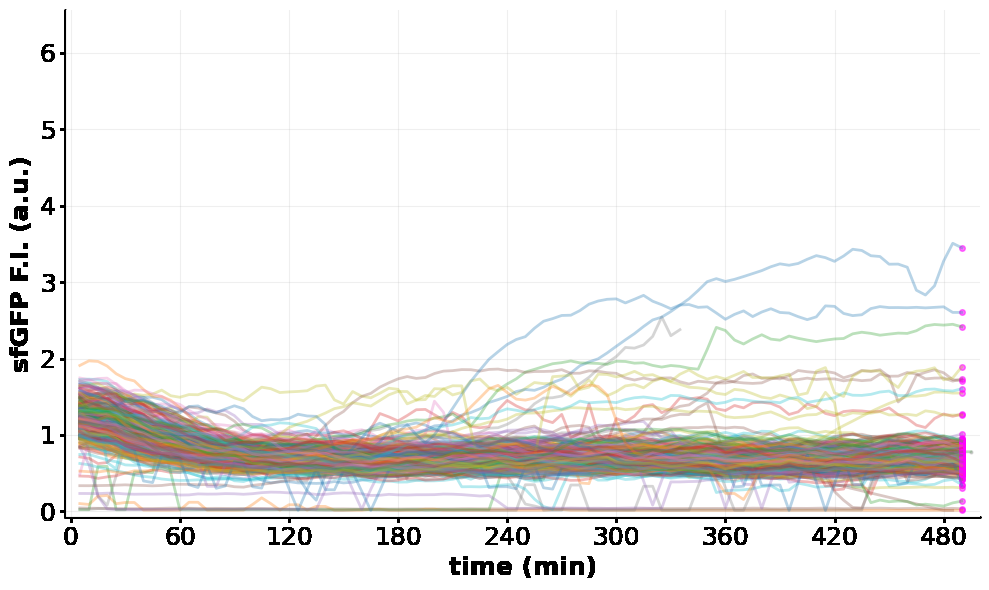

CPU times: user 22min 49s, sys: 7.47 s, total: 22min 57s
Wall time: 19min 38s


In [209]:
%%time
font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}

fig = plt.figure(figsize=(10,6), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,1, figure=fig)

x_translation = 6 * 49
x_range = [0+x_translation, 42+x_translation] #[int(x + 10*y_conversion_factor) for x in y_range_set]
current_data = data_array[57][x_range[0]:x_range[-1]]

for sample_idx in range(1,2):
    data_per_sample = full_segm_info_df.loc[
        (full_segm_info_df.sample_id == sample_names[sample_idx]) &
        (full_segm_info_df.label == 1)
    ]     
    for tp in tqdm(range(100)):
        ax1 = fig.add_subplot(gs[0,0])
        plt.plot(data_per_sample.loc[data_per_sample.trench == 688]['timepoint']*5, 
                 data_per_sample.loc[data_per_sample.trench == 688]['reporter_mean_intensity'].rolling(2).mean(), 
                 alpha = 0.27, linewidth=2, color="green")
        plt.plot(data_per_sample.loc[data_per_sample.trench == 688]['timepoint']*5, 
                 data_per_sample.loc[data_per_sample.trench == 688]['reporter_mean_intensity'].rolling(2).mean(), 'o',
                 alpha = 0.27, markersize=2, linewidth=1, color="grey")
        
        for trench_x in data_per_sample.trench.unique():
            tr_data = data_per_sample.loc[data_per_sample.trench == trench_x]
            tp_data = list(tr_data['timepoint']*5)
            fi_data = tr_data['reporter_mean_intensity'].rolling(2).mean()
            
            # plt.plot(tp_data[:tp], fi_data[:tp], 'o', markersize=2, alpha = 0.72, linewidth=1, color="grey")
            plt.plot(tp_data[tp-1:tp], fi_data[tp-1:tp], 'o', markersize=4, alpha = 0.52, linewidth=1, color="magenta")
            plt.plot(tp_data[:tp], fi_data[:tp], alpha = 0.32, linewidth=2)

            ax1.yaxis.set_major_formatter(formatter)  
            plt.yticks(fontsize=14)
            ax1.spines['right'].set_visible(False)
            ax1.spines['top'].set_visible(False)
            ax1.set_ylabel("sfGFP F.I. (a.u.)",fontsize=18, fontweight='bold')
            ax1.set_xlabel("time (min)",fontsize=18, fontweight='bold')
            ax1.grid(True,alpha=0.2)
            plt.yticks(fontsize=18)
            plt.xticks(fontsize=18)
            ax1.set_xticks(new_x_ticks)
            ax1.set_ylim(-700, 65_600)
            ax1.set_xlim(-3, 500)
        plt.savefig(f"FI_data_rest/FI_{sample_idx}_tp{str(tp).zfill(3)}.png", dpi=300)
  # print(f"n={len(data_per_sample.trench.unique())}")
# plt.legend(prop={'size': 17,'weight':'bold'})
# plt.savefig(f"7th_trench_backwater.png", dpi=300)
plt.show()

  0%|          | 0/100 [00:00<?, ?it/s]

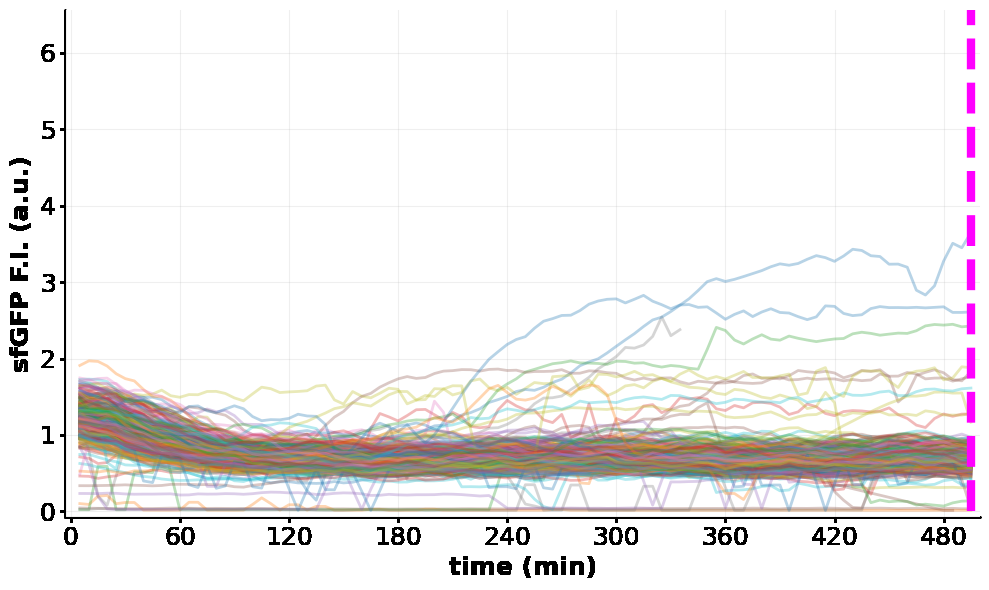

CPU times: user 24min 42s, sys: 7.55 s, total: 24min 49s
Wall time: 21min 33s


In [215]:
%%time
font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}

fig = plt.figure(figsize=(10,6), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,1, figure=fig)

x_translation = 6 * 49
x_range = [0+x_translation, 42+x_translation] #[int(x + 10*y_conversion_factor) for x in y_range_set]
current_data = data_array[57][x_range[0]:x_range[-1]]

for sample_idx in range(1,2):
    data_per_sample = full_segm_info_df.loc[
        (full_segm_info_df.sample_id == sample_names[sample_idx]) &
        (full_segm_info_df.label == 1)
    ]     
    for tp in tqdm(range(100)):
        ax1 = fig.add_subplot(gs[0,0])
        plt.plot(data_per_sample.loc[data_per_sample.trench == 688]['timepoint']*5, 
                 data_per_sample.loc[data_per_sample.trench == 688]['reporter_mean_intensity'].rolling(2).mean(), 
                 alpha = 0.27, linewidth=2, color="green")
        plt.plot(data_per_sample.loc[data_per_sample.trench == 688]['timepoint']*5, 
                 data_per_sample.loc[data_per_sample.trench == 688]['reporter_mean_intensity'].rolling(2).mean(), 'o',
                 alpha = 0.27, markersize=2, linewidth=1, color="grey")
        
        for trench_x in data_per_sample.trench.unique():
            tr_data = data_per_sample.loc[data_per_sample.trench == trench_x]
            tp_data = list(tr_data['timepoint']*5)
            fi_data = tr_data['reporter_mean_intensity'].rolling(2).mean()
            
            # plt.plot(tp_data[:tp], fi_data[:tp], 'o', markersize=2, alpha = 0.72, linewidth=1, color="grey")
            # plt.plot(tp_data[tp-1:tp], fi_data[tp-1:tp], 'o', markersize=4, alpha = 0.52, linewidth=1, color="magenta")
            plt.plot(tp_data[:], fi_data[:], alpha = 0.32, linewidth=2)

            ax1.yaxis.set_major_formatter(formatter)  
            plt.yticks(fontsize=14)
            ax1.spines['right'].set_visible(False)
            ax1.spines['top'].set_visible(False)
            ax1.set_ylabel("sfGFP F.I. (a.u.)",fontsize=18, fontweight='bold')
            ax1.set_xlabel("time (min)",fontsize=18, fontweight='bold')
            ax1.grid(True,alpha=0.2)
            plt.yticks(fontsize=18)
            plt.xticks(fontsize=18)
            ax1.set_xticks(new_x_ticks)
            ax1.set_ylim(-700, 65_600)
            ax1.set_xlim(-3, 500)
        ax1.vlines(tp*5, 0,66_000, linewidth=6, linestyle='--', color='magenta')
        plt.savefig(f"FI_data_populations/FI_{sample_idx}_tp{str(tp).zfill(3)}.png", dpi=300)
  # print(f"n={len(data_per_sample.trench.unique())}")
# plt.legend(prop={'size': 17,'weight':'bold'})
# plt.savefig(f"7th_trench_backwater.png", dpi=300)
plt.show()

In [218]:
!pip install diptest

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.0/90.0 kB 1.4 MB/s eta 0:00:00a 0:00:01


In [219]:
import diptest

In [225]:
from matplotlib.ticker import FuncFormatter

def tens_thousands(x, pos):
    'The two args are the value and tick position'
    return '%1.f' % (round(x,0) * 1e-4)


formatter = FuncFormatter(tens_thousands)

In [238]:
list(full_segm_info_df.sample_id.unique())
14 *  3_557.47

49804.579999999994

  0%|          | 0/100 [00:00<?, ?it/s]

dip_stat = 0.012689480959546872 | dip=0.012689480959546872 | pval=0.9596644623401298
dip_stat = 0.01022267729024755 | dip=0.01022267729024755 | pval=0.9938705615280298
dip_stat = 0.011979053783605526 | dip=0.011979053783605526 | pval=0.9821303592479002
dip_stat = 0.010485017715708011 | dip=0.010485017715708011 | pval=0.9931131669778572
dip_stat = 0.010743334128451456 | dip=0.010743334128451456 | pval=0.9923673900245396
dip_stat = 0.010572031343865744 | dip=0.010572031343865744 | pval=0.9928619527487055
dip_stat = 0.013112479615440476 | dip=0.013112479615440476 | pval=0.9420988208220074
dip_stat = 0.01440322254231233 | dip=0.01440322254231233 | pval=0.8544409569279934
dip_stat = 0.013045533008825891 | dip=0.013045533008825891 | pval=0.9459083229447623
dip_stat = 0.012474139664587906 | dip=0.012474139664587906 | pval=0.96698870167896
dip_stat = 0.010085466629307002 | dip=0.010085466629307002 | pval=0.9942666979856097
dip_stat = 0.012660084644084966 | dip=0.012660084644084966 | pval=0.960

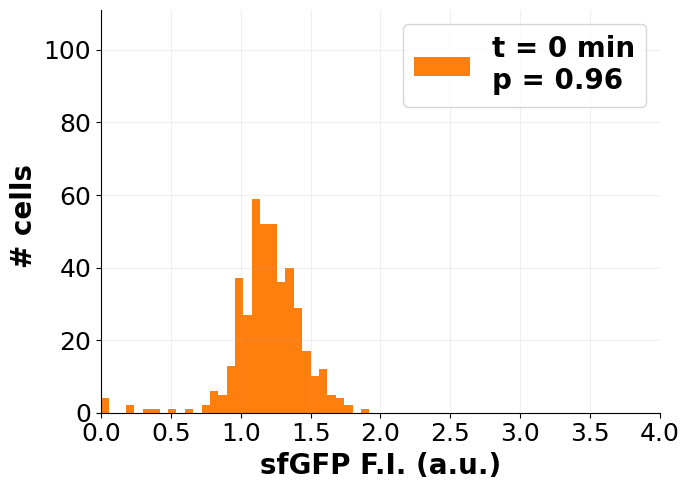

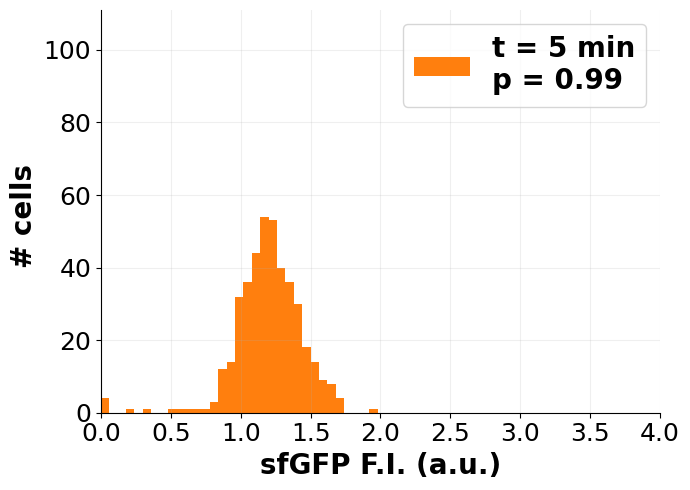

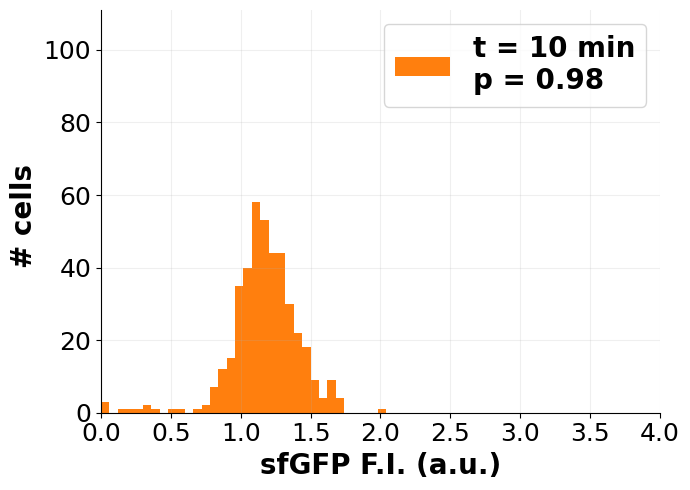

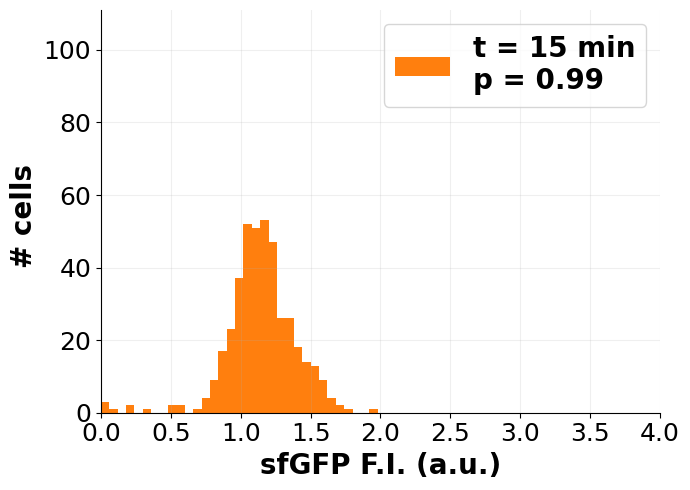

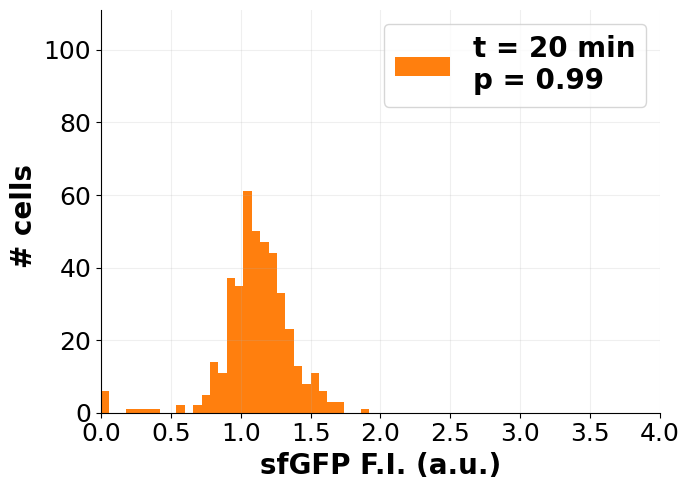

...

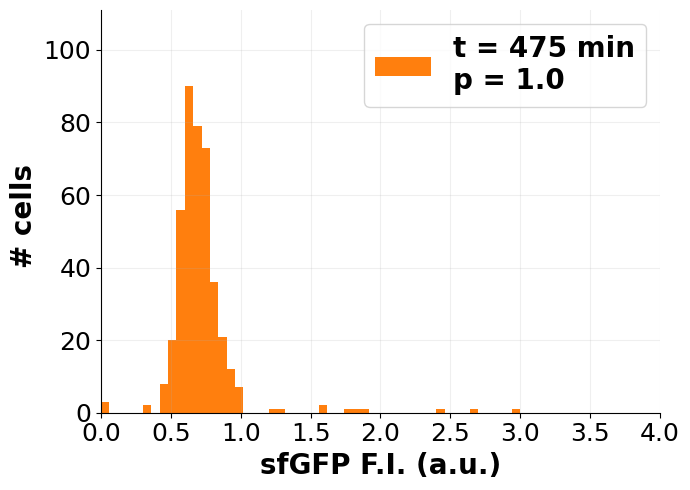

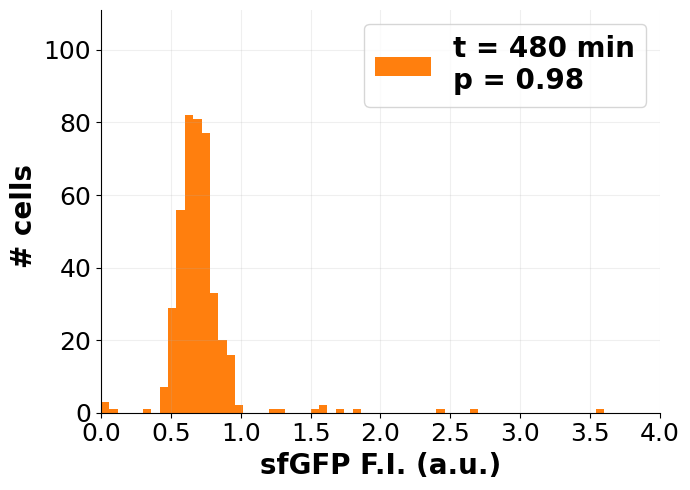

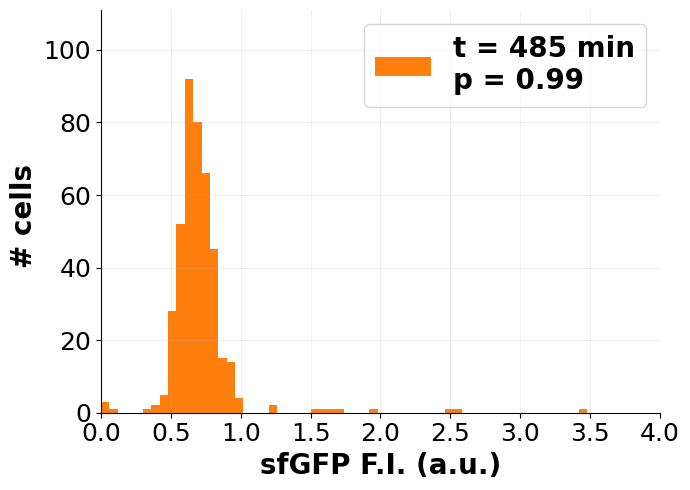

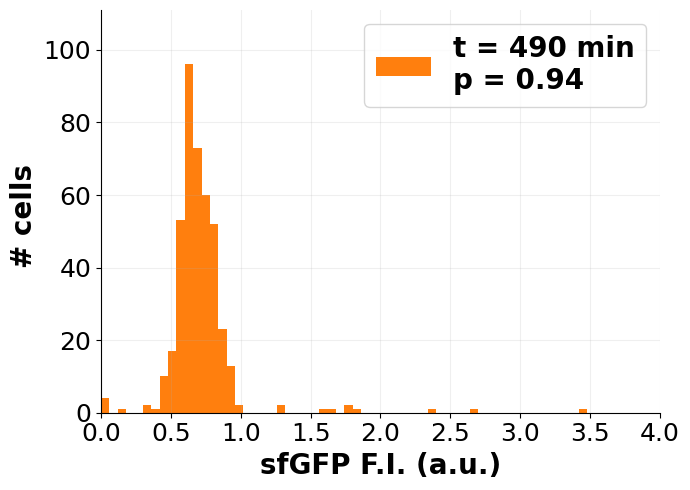

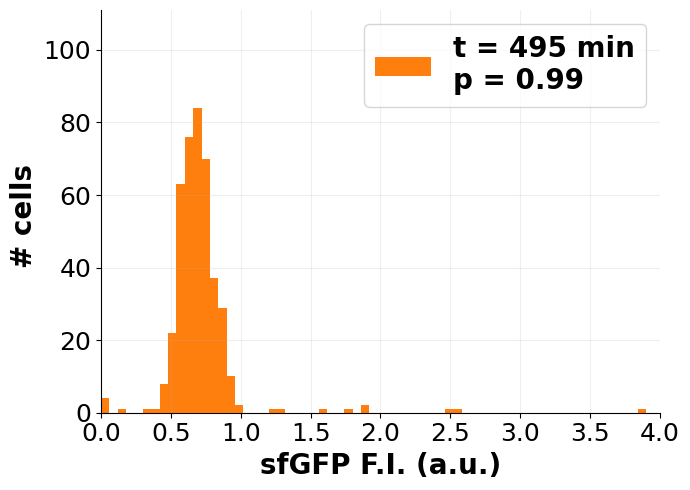

In [244]:
font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
standard_mpl_colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
sample_names = list(full_segm_info_df.sample_id.unique())

for tp in tqdm(range(100)):
    fig = plt.figure(figsize=(7,5), constrained_layout=True, tight_layout=True)
    gs = gridspec.GridSpec(1,1, figure=fig)
    ax1= fig.add_subplot(gs[0,0])

    # tp_t = tp
    # for x in range(1):
    #     sample_chosen = list(full_segm_info_df.sample_id.unique())[x]
    sample_data = np.array(full_segm_info_df.loc[
        (full_segm_info_df.sample_id == 'pSC101') &
        (full_segm_info_df.label == 1) &
        (full_segm_info_df.timepoint == tp)
    ].reporter_mean_intensity) / 10_000

    # only the dip statistic
    dip_stat = diptest.dipstat(sample_data)
    # both the dip statistic and p-value
    dip, pval = diptest.diptest(sample_data)
    print(f"dip_stat = {dip_stat} | dip={dip} | pval={pval}")
    w=0.06
    plt.hist(sample_data, bins=np.arange(0, 4 + w, w), label=f"t = {tp*5} min\np = {round(pval,2)}", color=standard_mpl_colors[1])  
    plt.xlim(0, 4)
    plt.ylim(0, 111)
    plt.yticks(fontsize=14)
    ax1.spines['right'].set_visible(False)
    ax1.spines['top'].set_visible(False)
    ax1.set_xlabel("sfGFP F.I. (a.u.)",fontsize=20, fontweight='bold')
    ax1.set_ylabel("# cells ",fontsize=20, fontweight='bold')
    # ax1.set_xticks(new_x_ticks)
    ax1.grid(True,alpha=0.2)
    plt.yticks(fontsize=18)
    plt.xticks(fontsize=18)
    
    # ax1.xaxis.set_major_formatter(formatter)
    # ax1.set_ylim(-700, 58_100)
    # ax1.set_xlim(113, 140)
    plt.legend(prop={'size': 20,'weight':'bold'}) 
    # ax1.xaxis.set_major_formatter(formatter)
    plt.savefig(f"FI_pSC101_hist/FI_pSC101_hist_tp{tp}.png", dpi=300)
plt.show()

## Variation source graph

  - low population variance
    - low SC variance - low P variance
  - high population variance
    - high SC variance - low P variance
    - low SC variance - high P variance 
    - high SC variance - high P variance 

In [131]:
SC_means_per_sample, SC_std_per_sample, SC_CV_per_sample, SC_MAD_per_sample, normalised_SC_MAD_per_sample, SC_SEM_per_sample

([[123.87980394738894,
   126.2695382260665,
   127.75026661430645,
   121.1268023503596,
   120.35800570263163,
   120.49096310799145,
   120.03597518673843,
   127.56120070179027,
   127.64591047237255,
   128.0096714563861,
   127.76836747586685,
   127.08419796692453,
   120.3861501578301,
   120.03412521929612,
   118.58753708340606,
   125.26720962536434,
   127.08491256018345,
   126.27899820270213,
   121.99633443283153,
   121.15801780075377,
   121.56527766266622,
   121.30565310046941,
   127.15100337030992,
   127.62290055995733,
   127.41950617562381,
   126.78112667150656,
   121.43950467648969,
   120.77663667295188,
   120.02218051119671,
   124.81897237242168,
   125.94339059016653,
   126.28428733079969,
   120.84023541066249,
   121.32522394213501,
   121.42509541181391,
   121.2394463367149,
   126.3541508960887,
   127.01303398360409,
   125.22282573787808,
   127.5066545643786,
   120.59436190139695,
   120.54296758033064,
   119.58887563987389,
   124.59074612899

In [132]:
[len(x) for x in indices_for_samples]

[434, 419, 323, 158]

In [133]:
cividis_three_colors = sns.color_palette("cividis", 3)

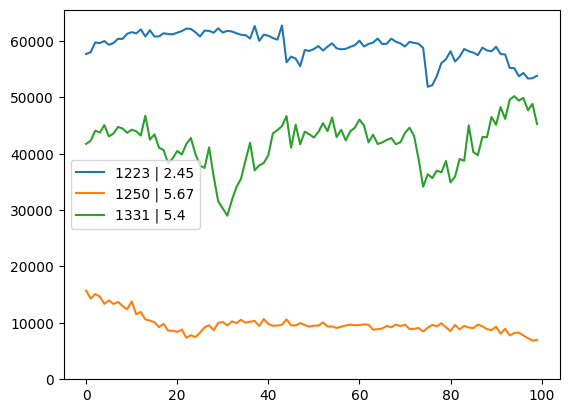

In [134]:
current_data1 = full_segm_info_df.loc[(full_segm_info_df.label == 1) & (full_segm_info_df.trench == 1223)]#  & (full_segm_info_df.sample_id == sample_names[sample]) ]
current_SC_MAD1 = scipy.stats.median_abs_deviation(current_data1.reporter_mean_intensity) / current_data1.reporter_mean_intensity.mean() *100
current_data2 = full_segm_info_df.loc[(full_segm_info_df.label == 1) & (full_segm_info_df.trench == 1250)]#  & (full_segm_info_df.sample_id == sample_names[sample]) ]
current_SC_MAD2 = scipy.stats.median_abs_deviation(current_data2.reporter_mean_intensity) /current_data2.reporter_mean_intensity.mean()*100
current_data3 = full_segm_info_df.loc[(full_segm_info_df.label == 1) & (full_segm_info_df.trench == 1331)]#  1325& (full_segm_info_df.sample_id == sample_names[sample]) ]
current_SC_MAD3 = scipy.stats.median_abs_deviation(current_data3.reporter_mean_intensity) /current_data3.reporter_mean_intensity.mean()*100
plt.set_cmap('cividis')
plt.plot(current_data1.timepoint, current_data1.reporter_mean_intensity, label=f"{current_data1.trench.iloc[0]} | {round(current_SC_MAD1,2)}")
plt.plot(current_data2.timepoint, current_data2.reporter_mean_intensity, label=f"{current_data2.trench.iloc[0]} | {round(current_SC_MAD2,2)}")
plt.plot(current_data3.timepoint, current_data3.reporter_mean_intensity, label=f"{current_data3.trench.iloc[0]} | {round(current_SC_MAD3,2)}")
plt.ylim(0,2**16)
plt.legend()
plt.show()


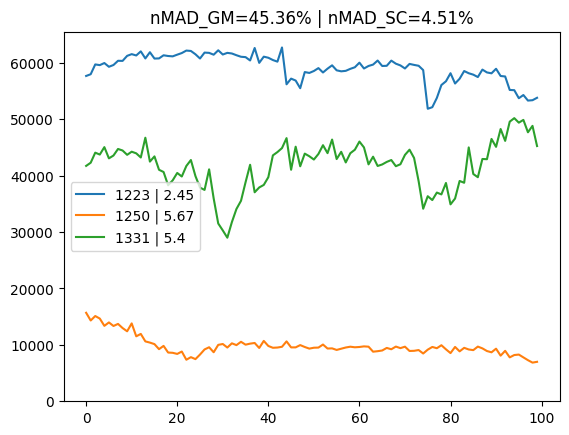

In [135]:
sum_trenches = []
nMAD_list = []
for tr in [1223, 1250, 1331]:
    current_data1 = full_segm_info_df.loc[(full_segm_info_df.label == 1) & (full_segm_info_df.trench == tr)]#  & (full_segm_info_df.sample_id == sample_names[sample]) ]
    current_SC_MAD1 = scipy.stats.median_abs_deviation(current_data1.reporter_mean_intensity) / current_data1.reporter_mean_intensity.mean() *100
    plt.plot(current_data1.timepoint, current_data1.reporter_mean_intensity, label=f"{current_data1.trench.iloc[0]} | {round(current_SC_MAD1,2)}")
    sum_trenches.append(current_data1)
    nMAD_list.append(current_SC_MAD1)
sum_trenches = pd.concat(sum_trenches)
nMAD_GM = round(scipy.stats.median_abs_deviation(sum_trenches.reporter_mean_intensity) / sum_trenches.reporter_mean_intensity.mean()*100,2)
plt.title(f"nMAD_GM={nMAD_GM}% | nMAD_SC={round(np.mean(nMAD_list),2)}%")
plt.ylim(0,2**16)
plt.legend()
plt.show()

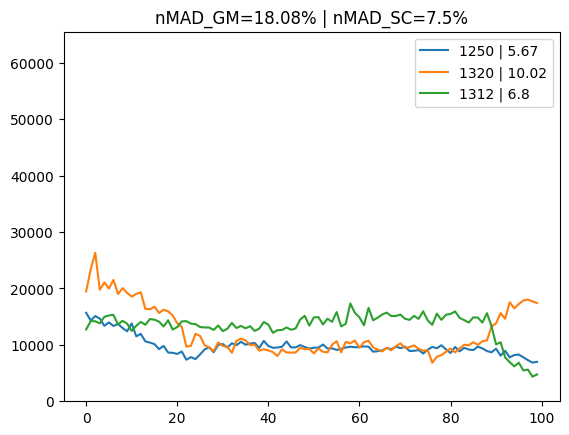

In [136]:
sum_trenches = []
nMAD_list = []
for tr in [1250, 1320, 1312]:
    current_data1 = full_segm_info_df.loc[(full_segm_info_df.label == 1) & (full_segm_info_df.trench == tr)]#  & (full_segm_info_df.sample_id == sample_names[sample]) ]
    current_SC_MAD1 = scipy.stats.median_abs_deviation(current_data1.reporter_mean_intensity) / current_data1.reporter_mean_intensity.mean() *100
    plt.plot(current_data1.timepoint, current_data1.reporter_mean_intensity, label=f"{current_data1.trench.iloc[0]} | {round(current_SC_MAD1,2)}")
    sum_trenches.append(current_data1)
    nMAD_list.append(current_SC_MAD1)
sum_trenches = pd.concat(sum_trenches)
nMAD_GM = round(scipy.stats.median_abs_deviation(sum_trenches.reporter_mean_intensity) / sum_trenches.reporter_mean_intensity.mean()*100,2)
plt.title(f"nMAD_GM={nMAD_GM}% | nMAD_SC={round(np.mean(nMAD_list),2)}%")
plt.ylim(0,2**16)
plt.legend()
plt.show()

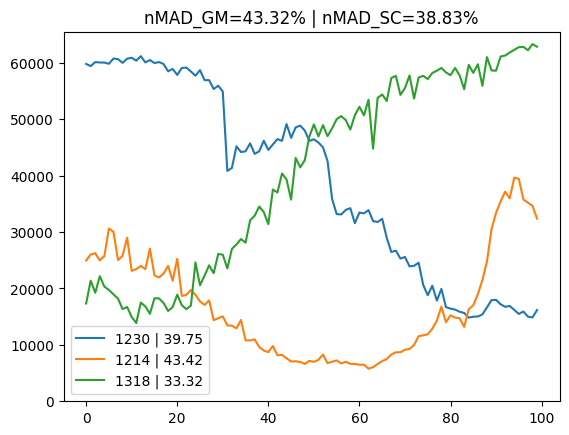

In [137]:
sum_trenches = []
nMAD_list = []
for tr in [1230, 1214, 1318]:
    current_data1 = full_segm_info_df.loc[(full_segm_info_df.label == 1) & (full_segm_info_df.trench == tr)]#  & (full_segm_info_df.sample_id == sample_names[sample]) ]
    current_SC_MAD1 = scipy.stats.median_abs_deviation(current_data1.reporter_mean_intensity) / current_data1.reporter_mean_intensity.mean() *100
    plt.plot(current_data1.timepoint, current_data1.reporter_mean_intensity, label=f"{current_data1.trench.iloc[0]} | {round(current_SC_MAD1,2)}")
    sum_trenches.append(current_data1)
    nMAD_list.append(current_SC_MAD1)
sum_trenches = pd.concat(sum_trenches)
nMAD_GM = round(scipy.stats.median_abs_deviation(sum_trenches.reporter_mean_intensity) / sum_trenches.reporter_mean_intensity.mean()*100,2)
plt.title(f"nMAD_GM={nMAD_GM}% | nMAD_SC={round(np.mean(nMAD_list),2)}%")
plt.ylim(0,2**16)
plt.legend()
plt.show()

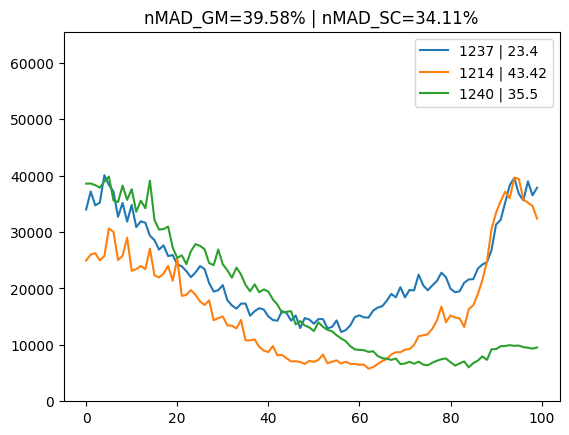

In [138]:
sum_trenches = []
nMAD_list = []
for tr in [1237, 1214, 1240]:
    current_data1 = full_segm_info_df.loc[(full_segm_info_df.label == 1) & (full_segm_info_df.trench == tr)]#  & (full_segm_info_df.sample_id == sample_names[sample]) ]
    current_SC_MAD1 = scipy.stats.median_abs_deviation(current_data1.reporter_mean_intensity) / current_data1.reporter_mean_intensity.mean() *100
    plt.plot(current_data1.timepoint, current_data1.reporter_mean_intensity, label=f"{current_data1.trench.iloc[0]} | {round(current_SC_MAD1,2)}")
    sum_trenches.append(current_data1)
    nMAD_list.append(current_SC_MAD1)
sum_trenches = pd.concat(sum_trenches)
nMAD_GM = round(scipy.stats.median_abs_deviation(sum_trenches.reporter_mean_intensity) / sum_trenches.reporter_mean_intensity.mean()*100,2)
plt.title(f"nMAD_GM={nMAD_GM}% | nMAD_SC={round(np.mean(nMAD_list),2)}%")
plt.ylim(0,2**16)
plt.legend()
plt.show()

In [139]:
tr = [1212, 1214, 1216, 1217, 1230, 1233, 1236, 1237, 1240, 1333] # high nMAD 0.3535
[1218, 1223, 1223, 1225, 1226, 1227, 1228, 1229, 1232, 1246, 1250, 1255] # lowish nMAD 1250, 1331

[1218, 1223, 1223, 1225, 1226, 1227, 1228, 1229, 1232, 1246, 1250, 1255]

In [140]:
comb3_list = list(combinations(indices_for_samples[-1],3))
len(comb3_list)

644956

In [141]:
@interact
def show(idx=(0,len(comb3_list)-1)):
    sum_trenches = []
    nMAD_list = []
    for tr in comb3_list[idx]:
        current_data1 = full_segm_info_df.loc[(full_segm_info_df.label == 1) & (full_segm_info_df.trench == tr)]#  & (full_segm_info_df.sample_id == sample_names[sample]) ]
        current_SC_MAD1 = scipy.stats.median_abs_deviation(current_data1.reporter_mean_intensity) / current_data1.reporter_mean_intensity.mean() *100
        plt.plot(current_data1.timepoint, current_data1.reporter_mean_intensity, label=f"{current_data1.trench.iloc[0]} | {round(current_SC_MAD1,2)}")
        sum_trenches.append(current_data1)
        nMAD_list.append(current_SC_MAD1)
    sum_trenches = pd.concat(sum_trenches)
    nMAD_GM = round(scipy.stats.median_abs_deviation(sum_trenches.reporter_mean_intensity) / sum_trenches.reporter_mean_intensity.mean()*100,2)
    plt.title(f"nMAD_GM={nMAD_GM}% | nMAD_SC={round(np.mean(nMAD_list),2)}%")
    plt.ylim(0,2**16)
    plt.legend()
    plt.show()

interactive(children=(IntSlider(value=322477, description='idx', max=644955), Output()), _dom_classes=('widget…

In [ ]:
def find_SC_means(full_df, tr_tro):
    # current_trio_l = full_df.loc[(full_df.label == 1) & (full_df.trench.isin(tr_tro))]
    nMAD_SCset_list_l = []
    for tr in tr_tro:
        # print(tr)
        current_SC_l = full_df.loc[(full_df.label == 1) & (full_df.trench==tr)]
        current_SC_MAD1_l = round(scipy.stats.median_abs_deviation(current_SC_l.reporter_mean_intensity) / current_SC_l.reporter_mean_intensity.mean() *100,2)
        nMAD_SCset_list_l.append(current_SC_MAD1_l)
        # print(current_SC_MAD1_l)
    return np.mean(nMAD_SCset_list_l)

def find_GM(full_df, tr_tro):
    current_trio_l = full_df.loc[(full_df.label == 1) & (full_df.trench.isin(tr_tro))]
    return round(scipy.stats.median_abs_deviation(current_trio_l.reporter_mean_intensity) / current_trio_l.reporter_mean_intensity.mean()*100,2)
#
nMAD_GM_list_parallel = Parallel(n_jobs = 7, require='sharedmem')(delayed(find_GM)(full_segm_info_df, tr_tro_test)
                                                              for tr_tro_test in tqdm(comb3_list))

In [ ]:
all_SC_and_GM_FIs = pd.DataFrame([nMAD_SCset_list_means_parallel, nMAD_GM_list_parallel])#, columns=['SC', 'GM'])
all_SC_and_GM_FIs = all_SC_and_GM_FIs.T
all_SC_and_GM_FIs.columns = ['SC', 'GM']
# all_SC_and_GM_FIs.to_csv('all_SC_and_GM_FIs.csv', index=False)

In [ ]:
len(nMAD_SCset_list_means_parallel), len(nMAD_GM_list_parallel)

In [ ]:
all_SC_and_GM_FIs.loc[(all_SC_and_GM_FIs.GM < 50)]

In [ ]:
# large dispersion
@interact
def show(SC=(0,100,1),
         GM=(0,100,1)):
    display(all_SC_and_GM_FIs.loc[(all_SC_and_GM_FIs.SC > SC) & (all_SC_and_GM_FIs.GM > GM)])

In [ ]:
# small dispersion
@interact
def show(SC=(0,2,0.1),
         GM=(0,2,0.1)):
    display(all_SC_and_GM_FIs.loc[(all_SC_and_GM_FIs.SC < SC) & (all_SC_and_GM_FIs.GM < GM)])

In [ ]:
find_GM(full_segm_info_df, comb3_list[627967])
comb3_list[211007]

In [ ]:
sum_trenches = []
nMAD_list = []
for tr in comb3_list[403371]:
    current_data1 = full_segm_info_df.loc[(full_segm_info_df.label == 1) & (full_segm_info_df.trench == tr)]#  & (full_segm_info_df.sample_id == sample_names[sample]) ]
    current_SC_MAD1 = scipy.stats.median_abs_deviation(current_data1.reporter_mean_intensity) / current_data1.reporter_mean_intensity.mean() *100
    plt.plot(current_data1.timepoint, current_data1.reporter_mean_intensity, label=f"{current_data1.trench.iloc[0]} | {round(current_SC_MAD1,2)}")
    sum_trenches.append(current_data1)
    nMAD_list.append(current_SC_MAD1)
sum_trenches = pd.concat(sum_trenches)
nMAD_GM = round(scipy.stats.median_abs_deviation(sum_trenches.reporter_mean_intensity) / sum_trenches.reporter_mean_intensity.mean()*100,2)
plt.title(f"nMAD_GM={nMAD_GM}% | nMAD_SC={round(np.mean(nMAD_list),2)}%")
plt.ylim(0,2**16)
plt.legend()
plt.show()

In [ ]:
@interact
def show(sample=(0,3),
         tr=(0,len(full_segm_info_df.trench.unique())-1)):
    
    current_data = full_segm_info_df.loc[(full_segm_info_df.label == 1) & (full_segm_info_df.trench == tr)  & (full_segm_info_df.sample_id == sample_names[sample]) ]
    current_SC_MAD = scipy.stats.median_abs_deviation(current_data.reporter_mean_intensity)
    current_normalised_SC_MAD = current_SC_MAD / current_data.reporter_mean_intensity.mean()
    plt.title(f"{round(current_normalised_SC_MAD,2)}")
    plt.plot(current_data.timepoint, current_data.reporter_mean_intensity, label=f"{tr}")
    plt.ylim(0,65_000)
    plt.legend()
    plt.show()

In [ ]:
for tr in full_segm_info_df.trench.unique():
    current_data1 = full_segm_info_df.loc[(full_segm_info_df.label == 1) & (full_segm_info_df.trench == tr)]

#### here

In [ ]:


full_segm_info_df.loc

In [ ]:
from scipy.stats import ttest_ind

# Generate two random samples
n_samples1 = 50
n_samples2 = 60
sample1 = np.random.normal(loc=0, scale=1, size=n_samples1)
sample2 = np.random.normal(loc=1, scale=1, size=n_samples2)

# Compute the t-statistic and p-value using the two-sample t-test
t_stat, p_value = ttest_ind(sample1, sample2)

# Print the t-statistic and p-value
print(f"t-statistic: {t_stat}")
print(f"p-value: {p_value}")


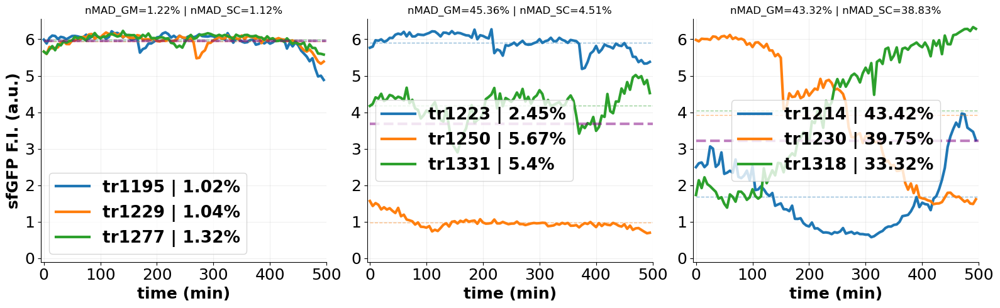

In [556]:
font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
standard_mpl_colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
sample_names = list(full_segm_info_df.sample_id.unique())
fig = plt.figure(figsize=(16,5), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,3, figure=fig)
example_sets = [[1195, 1229, 1277], [1223, 1250, 1331] , [1214, 1230, 1318]]
# alt option 1: [1250, 1312, 1320]


for x in range(3):
    ax1= fig.add_subplot(gs[0,x])
    sum_trenches = []
    nMAD_list = []
    
    for tr_idx, tr in enumerate(example_sets[x]):
        current_data1 = full_segm_info_df.loc[(full_segm_info_df.label == 1) & (full_segm_info_df.trench == tr)]#  & (full_segm_info_df.sample_id == sample_names[sample]) ]
        current_SC_MAD1 = scipy.stats.median_abs_deviation(current_data1.reporter_mean_intensity) / current_data1.reporter_mean_intensity.mean() *100
        ax1.plot(current_data1.timepoint*5, current_data1.reporter_mean_intensity / 10_000,linewidth=3, label=f"tr{current_data1.trench.iloc[0]} | {round(current_SC_MAD1,2)}%", color=standard_mpl_colors[tr_idx])
        #ax1.scatter(current_data1.timepoint*5, current_data1.reporter_mean_intensity / 10_000, s=15, alpha=0.7,color='grey')
        ax1.hlines(current_data1.reporter_mean_intensity.mean().mean() / 10_000,0,500, color=standard_mpl_colors[tr_idx], linestyle='--', linewidth=1, alpha=0.5)
        sum_trenches.append(current_data1)
        nMAD_list.append(current_SC_MAD1)
    sum_trenches = pd.concat(sum_trenches)
    ax1.hlines(sum_trenches.reporter_mean_intensity.mean().mean() / 10_000,0,500, color='purple', linestyle='--', linewidth=3, alpha=0.5)
    nMAD_GM = round(scipy.stats.median_abs_deviation(sum_trenches.reporter_mean_intensity) / sum_trenches.reporter_mean_intensity.mean()*100,2)
    ax1.set_title(f"nMAD_GM={nMAD_GM}% | nMAD_SC={round(np.mean(nMAD_list),2)}%")
    
    plt.yticks(fontsize=14)
    ax1.spines['right'].set_visible(False)
    ax1.spines['top'].set_visible(False)
    ax1.set_xlabel("time (min)",fontsize=18, fontweight='bold')
    if x ==0:
        ax1.set_ylabel("sfGFP F.I. (a.u.)",fontsize=18, fontweight='bold')
    # ax1.set_xticks(new_x_ticks)
    ax1.grid(True,alpha=0.2)
    plt.yticks(fontsize=18)
    plt.xticks(fontsize=18)
    ax1.set_ylim(-0.1, 2**16/10_000)
    ax1.set_xlim(-5, 500)
    plt.legend(prop={'size': 19,'weight':'bold'}) 
    # ax1.yaxis.set_major_formatter(formatter)
# plt.savefig(f"24_variation_source_fig.png", dpi=300)
plt.show()

In [ ]:
low_CV_data

In [ ]:
data_pUC = full_segm_info_df.loc[
            (full_segm_info_df.sample_id == 'pUC') &
            (full_segm_info_df.label == 1)
] # &
            #(full_segm_info_df.timepoint == t)

In [ ]:
# data_pUC[['timepoint','reporter_mean_intensity']].plot()
for trench_x in data_pUC.trench.unique():
    tr_data_pUC = data_pUC.loc[data_pUC.trench == trench_x]
    plt.plot(tr_data_pUC['timepoint'], tr_data_pUC['reporter_mean_intensity'], alpha = 0.12)
    #plt.xlim(40,42)

In [ ]:
sample_data = np.array(full_segm_info_df.loc[
        (full_segm_info_df.sample_id == 'pUC') &
        (full_segm_info_df.label == 1) &
        (full_segm_info_df.timepoint == t)
    ].reporter_mean_intensity)
len(sample_data)

### Hartigan's Dip Test for uni-modality

In [ ]:
import diptest

In [ ]:
diptest_results_per_sample = []
for x in tqdm(range(4)):
    sample_data_x = []
    for t in tqdm(range(100)):
        sample_chosen = list(full_segm_info_df.sample_id.unique())[x]
        sample_data = np.array(full_segm_info_df.loc[
            (full_segm_info_df.sample_id == sample_chosen) &
            (full_segm_info_df.label == 1) &
            (full_segm_info_df.timepoint == t)
        ].reporter_mean_intensity)
        dip, pval = diptest.diptest(sample_data)
        sample_data_x.append(pval)
    diptest_results_per_sample.append(sample_data_x)

In [ ]:
for x in range(4):
    plt.plot(list(range(len(diptest_results_per_sample[x]))), diptest_results_per_sample[x], label=f"{sample_names[x]}")
plt.legend()
plt.show()

In [559]:
import diptest

dip_stat = 0.012165570373613441 | dip=0.012165570373613441 | pval=0.970537225852288


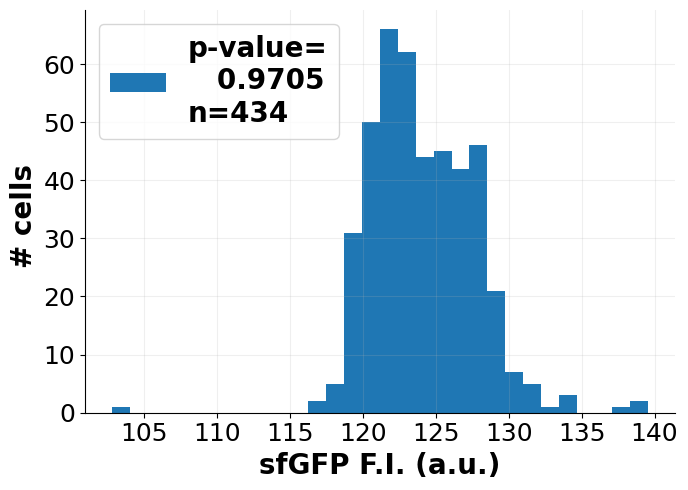

In [567]:
font = {'family': 'serif', 'color':  'royalblue',
        'weight': 'bold', 'size': 18,}
standard_mpl_colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
sample_names = list(full_segm_info_df.sample_id.unique())
fig = plt.figure(figsize=(7,5), constrained_layout=True, tight_layout=True)
gs = gridspec.GridSpec(1,1, figure=fig)
ax1= fig.add_subplot(gs[0,0])

tp_t = 89
for x in range(1):
    sample_chosen = list(full_segm_info_df.sample_id.unique())[x]
    sample_data = np.array(full_segm_info_df.loc[
        (full_segm_info_df.sample_id == sample_chosen) &
        (full_segm_info_df.label == 1) &
        (full_segm_info_df.timepoint == tp_t)
    ].reporter_mean_intensity)

    # only the dip statistic
    dip_stat = diptest.dipstat(sample_data)
    # both the dip statistic and p-value
    dip, pval = diptest.diptest(sample_data)
    print(f"dip_stat = {dip_stat} | dip={dip} | pval={pval}")
    plt.hist(sample_data, bins=30, label=f"p-value=\n   {round(pval,4)}\nn={len(sample_data)}", color=standard_mpl_colors[x])  

plt.yticks(fontsize=14)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.set_xlabel("sfGFP F.I. (a.u.)",fontsize=20, fontweight='bold')
ax1.set_ylabel("# cells ",fontsize=20, fontweight='bold')
# ax1.set_xticks(new_x_ticks)
ax1.grid(True,alpha=0.2)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
# ax1.set_ylim(-700, 58_100)
# ax1.set_xlim(113, 140)
plt.legend(prop={'size': 20,'weight':'bold'},loc='upper left') 
# ax1.xaxis.set_major_formatter(formatter)
# plt.savefig(f"FI_hist_sample{sample_names[x]}_at_t{tp_t}.png", dpi=300)
plt.show()

In [562]:
@interact
def show(x = (0,3),
         t = (0,99)):
    
    sample_chosen = list(full_segm_info_df.sample_id.unique())[x]
    sample_data = np.array(full_segm_info_df.loc[
        (full_segm_info_df.sample_id == sample_chosen) &
        (full_segm_info_df.label == 1) &
        (full_segm_info_df.timepoint == t)
    ].reporter_mean_intensity)

    # only the dip statistic
    dip_stat = diptest.dipstat(sample_data)
    # both the dip statistic and p-value
    dip, pval = diptest.diptest(sample_data)
    print(f"dip_stat = {dip_stat} | dip={dip} | pval={pval}")
    plt.hist(sample_data, bins=40)

interactive(children=(IntSlider(value=1, description='x', max=3), IntSlider(value=49, description='t', max=99)…

In [ ]:
@interact
def show(x = (0,3),
         t = (0,99)):
    sample_chosen = list(full_segm_info_df.sample_id.unique())[x]
    full_segm_info_df.loc[
        (full_segm_info_df.sample_id == sample_chosen) &
        (full_segm_info_df.label == 1) &
        (full_segm_info_df.timepoint == t)
    ].segm_mean_intensity.hist(bins=30)

### FI vs cell size

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [ ]:
data_test_3d = full_segm_info_df.loc[(full_segm_info_df.sample_id == sample_names[-1]) &
                                     (full_segm_info_df.label == 1) #&
                                     #(full_segm_info_df.reporter_mean_intensity < 32_500)
                                     #(full_segm_info_df.timepoint == 0)
                                    ]
data_test_3d_x = data_test_3d.major_axis_length * pixel_micron_conversion
data_test_3d_y = data_test_3d.reporter_mean_intensity
data_test_3d_z = data_test_3d.timepoint * 5
data_test_3d

In [ ]:
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable


In [ ]:
# Create a new figure
fig = plt.figure(figsize=(9,8),tight_layout=True)
gs1 = gridspec.GridSpec(1, 1)
ax = fig.add_subplot(gs1[0,0])
cmap = LinearSegmentedColormap.from_list('mycmap', [
    'black',
    'firebrick', # pure Cy5' #DA8B87'
    'darkorange', # pure: ATTO550  '#FFBB91'
    'orangered', # Cy5 + ATTO550'#80461B', 
    'limegreen', # pure AF488 '#DBFF9C'
    'gold', #'#AA8B00', # Cy5 + AF488
    '#964B00', 
    'magenta'
])
# Create the plot
time_defined = list(range(0,100))
# ax.scatter(data_test_3d_x, data_test_3d_y,cmap='viridis', alpha=0.2) #,cmap=cmap c=fake_cluster_colours
# sns.relplot(data=data_test_3d, x='major_axis_length', y='reporter_mean_intensity')#, hue='timepoint', hue_order=time_defined, aspect=1.61)
axes = ax.scatter(data_test_3d_x, data_test_3d_y, s=20, c=data_test_3d_z, cmap='viridis')

ax.set_xlabel('cell length (µm)', fontsize=14, fontweight='bold')
ax.set_ylabel('sfGFP FI (a.u.)', fontsize=14, fontweight='bold')
ax.tick_params(axis='both', which='major', labelsize=12)
plt.colorbar(axes)
#fig.tight_layout()
# plt.savefig(f"58_8bit_classification_simulation.png", dpi=300)
plt.show()

In [ ]:
full_segm_info_df.loc[(full_segm_info_df.sample_id == sample_names[-1]) &
                                     (full_segm_info_df.label == 1) &
                                     (full_segm_info_df.trench == 10)]

In [ ]:
@interact
def show(tild=(0,60),
        right_left = (-180,180),
        tr=(indices_for_samples[-1][0], indices_for_samples[-1][-1]-1)):
    # Setup data
    data_test_3d = full_segm_info_df.loc[(full_segm_info_df.sample_id == sample_names[-1]) &
                                     (full_segm_info_df.label == 1) &
                                     (full_segm_info_df.trench == tr)
                                     #(full_segm_info_df.timepoint == 0)
                                    ]
    data_test_3d_x = data_test_3d.major_axis_length * pixel_micron_conversion
    data_test_3d_y = data_test_3d.reporter_mean_intensity
    data_test_3d_z = data_test_3d.timepoint * 5
    # Create a new figure
    fig = plt.figure(figsize=(9,8),tight_layout=True)
    gs1 = gridspec.GridSpec(1, 1)
    ax = fig.add_subplot(gs1[0], projection='3d')
    # Create the plot
    ax.scatter(data_test_3d_z, data_test_3d_y, data_test_3d_x,cmap='inferno',c=data_test_3d_y, alpha=0.2) #,cmap=cmap c=fake_cluster_colours

    ax.set_zlabel('cell length (µm)', fontsize=14, fontweight='bold')
    ax.set_ylabel('sfGFP FI (a.u.)', fontsize=14, fontweight='bold')
    ax.set_xlabel('time (min)', fontsize=14, fontweight='bold')
    ax.set_ylim(5_000,66_000)
    ax.set_zlim(0,80)
    ax.set_xlim(0,505)
    # Get rid of colored axes planes
    ax.w_xaxis.set_pane_color((0., 0.05, 0.05, 0.1))
    ax.w_yaxis.set_pane_color((0., 0.05, 0.05, 0.13))
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.view_init(tild, right_left, 0)
    plt.show()

## Cell length graph

In [ ]:
full_segm_info_df.sample_id.unique()

In [ ]:
@interact
def show(x = (0,3),
         t = (0,99)):
    sample_chosen = list(full_segm_info_df.sample_id.unique())[x]
    data = full_segm_info_df.loc[
        (full_segm_info_df.sample_id == sample_chosen) &
        (full_segm_info_df.label == 1) &
        (full_segm_info_df.timepoint == t)
    ].reporter_mean_intensity# * pixel_micron_conversion
    print(f"Mean: {data.mean()}")
    print(f"Std: {data.std()}")
    plt.hist(data, bins=20)

In [ ]:
major_axis_means_list = []
major_axis_std_list = []
for x in tqdm(range(0,4)):
    interim_mean = []
    interim_std = []
    for t in tqdm(range(0,100)):
        sample_chosen = list(full_segm_info_df.sample_id.unique())[x]
        data = full_segm_info_df.loc[
            (full_segm_info_df.sample_id == sample_chosen) &
            (full_segm_info_df.label == 1) &
            (full_segm_info_df.timepoint == t)
        ].major_axis_length * pixel_micron_conversion
        # \\print(f"Mean: {data.mean()}")
        # print(f"Std: {data.std()}")
        interim_mean.append(data.mean())
        interim_std.append(data.std())
    major_axis_means_list.append(interim_mean)
    major_axis_std_list.append(interim_std)

In [ ]:
sample_x = 3
for x in range(4):
    time_points = list(range(len(major_axis_means_list[x])))
    plt.plot(time_points, major_axis_means_list[x], label=f"{x}")
    
    ci = 2 * ( np.array(major_axis_std_list[x]) / np.sqrt( len(major_axis_means_list[x]) ) )
    y = np.array(major_axis_means_list[x])
    plt.fill_between(np.array(time_points), (y-ci), (y+ci), alpha=.3)
plt.legend()

## Cell width graph

In [ ]:
mino_axis_means_list = []
mino_axis_std_list = []
for x in tqdm(range(0,4)):
    interim_mean = []
    interim_std = []
    for t in tqdm(range(0,100)):
        sample_chosen = list(full_segm_info_df.sample_id.unique())[x]
        data = full_segm_info_df.loc[
            (full_segm_info_df.sample_id == sample_chosen) &
            (full_segm_info_df.label == 1) &
            (full_segm_info_df.timepoint == t)
        ].minor_axis_length * pixel_micron_conversion
        # print(f"Mean: {data.mean()}")
        # print(f"Std: {data.std()}")
        interim_mean.append(data.mean())
        interim_std.append(data.std())
    mino_axis_means_list.append(interim_mean)
    mino_axis_std_list.append(interim_std)

In [ ]:
sample_x = 3
for x in range(4):
    time_points = list(range(len(mino_axis_means_list[x])))
    plt.plot(time_points, mino_axis_means_list[x])
    
    ci = 2 * ( np.array(mino_axis_std_list[x]) / np.sqrt( len(mino_axis_means_list[x]) ) )
    y = np.array(mino_axis_means_list[x])
    plt.fill_between(np.array(time_points), (y-ci), (y+ci), alpha=.3)

In [ ]:
full_segm_info_df

In [ ]:
viewer = napari.view_image(gh_mask_zarr, rgb=False,colormap='yellow')

### Manual Correction

In [ ]:
PC_ims_master_array = filled_trench_master_zarr[:,0,:, :,:]
#segm_ims_master_array = filled_trench_master_zarr[:,1,:, :,:]
#reporter_ims_master_array = filled_trench_master_zarr[:,2,:, :,:]

In [ ]:
viewer = napari.view_image(PC_ims_master_array, rgb=False,colormap='yellow')
#viewer.add_image(filled_trench_master_zarr[:,1,:, :,:], rgb=False,colormap='red');
#viewer.add_image(reporter_ims_master_array, rgb=False,colormap='yellow');
cell_label = viewer.add_labels(gh_mask_zarr, name = "mask")
cell_label.data.shape

---